# CoughSultant: A Covid-19 detection tool based on cough recordings
### Final Project for CS-577 (Machine Learning) fall semester 2022 - 2023
### University of Crete, Computer Science Department

## By: Ioannis Kaziales - csdp1305



In this file, I explore the [Coughvid dataset](https://coughvid.epfl.ch/) and perform some preprocessing to get the final dataset(s). Specifically, this file is consisted of 3 parts:
1. Exploration/Visualization of the `Coughvid` dataset's metadata
1. Choosing a subset of the dataset that is deemed fit to be in the final dataset
1. Add extracted audio features to obtain the final dataset

## Import necessary libraries and files and define helper functions

In [18]:
# needs: pip install xgboost==0.90
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio
from IPython.display import display
from numerize import numerize
import scipy.io.wavfile as wav
import sys
import os
import pickle
import opensmile
import subprocess

from src.segmentation import segment_cough
src_dir = os.path.abspath('./src')
if src_dir not in sys.path:
    sys.path.append(src_dir)
from DSP import classify_cough

pd.set_option('display.max.columns', None)

# for the labels of the pie-charts
def func(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return f"{pct:.1f}%\n({numerize.numerize(absolute)})"

colors = ['#ff595e','#8ac926','#1982c4','#6a4c93']

# plots a pie chart from a dataframe column
def plot_pie_chart(df, column, title, save_name=''):
    labels = df[column].unique()
    count = []
    for i, label in enumerate(labels):
        if label != label: # if label is nan
            labels[i] = 'missing_value'
            count.append(len(df[df[column].isnull()]))
        else:
            count.append(len(df[df[column] == label]))

    #print(f"In total, there are {numerize.numerize(len(df))} samples")
    # Pie chart
    labels = [str(l)+f"\n({numerize.numerize(count[i])})" for i, l in enumerate(labels)]
    fig, ax = plt.subplots()
    plt.title(title, fontsize=14)
    patches, texts, autotexts  = ax.pie(count, labels=labels, colors=colors, 
                                        autopct='%1.1f%%', startangle=90, textprops={'fontsize': 9, 'fontweight':'bold'})
    [text.set_color(colors[i]) for i, text in enumerate(texts)]
    plt.tight_layout()
    if save_name:
        plt.savefig(save_name)
    plt.show()
    
# plots a pie chart from a dataframe column
def plot_pie_charts(df, columns, titles, save_name=''):
    fig, axs = plt.subplots(1, len(columns), figsize=(5*len(columns), 5))
    for j, column in enumerate(columns):
        labels = df[column].unique()
        count = []
        for i, label in enumerate(labels):
            if label != label: # if label is nan
                labels[i] = 'missing_value'
                count.append(len(df[df[column].isnull()]))
            else:
                count.append(len(df[df[column] == label]))

        # Pie chart
        labels = [str(l)+f"\n({numerize.numerize(count[i])})" for i, l in enumerate(labels)]
        axs[j].set_title(titles[j], fontsize=14)
        patches, texts, autotexts  = axs[j].pie(count, labels=labels, colors=colors, 
                                            autopct='%1.1f%%', startangle=90, textprops={'fontsize': 9, 'fontweight':'bold'})
        [text.set_color(colors[i]) for i, text in enumerate(texts)]
    #plt.tight_layout()
    if save_name:
        plt.savefig(save_name)
    plt.show()
    
# plots the histogram and kernel density estimation of a numeric column of a dataframe
def plot_distribution(df, column, title, xlabel, save_name='', xlim=[]):
    col = df[~df[column].isnull()][column]
    mu, std = col.mean(), col.std()
    fig, ax = plt.subplots(figsize = (6,4))
    col.plot(kind = "hist", density=True, alpha=0.5, bins=20, color='#1982c4')
    col.plot(kind = "kde", color='red')
    if xlim:
        ax.set_xlim(xlim)
    else:
        ax.set_xlim(min(col)-1, max(col)+1)
    ax.set_xlabel(xlabel)
    ax.set_ylabel("Frequency")
    ax.set_title(title, size = 15)
    ax.axvline(mu, color='red', linestyle='dashed')
    ax.axvline(mu-std, color='red', linestyle='dashed', alpha=0.5)
    ax.axvline(mu+std, color='red', linestyle='dashed', alpha=0.5)
    plt.text(70, 0.015, rf'$\mu={df[column].mean():.2f}, \quad \sigma={df[column].std():.2f}$', fontsize=10)
    plt.tight_layout()
    if save_name:
        plt.savefig(save_name)
    plt.show()

In [19]:
recordings_dir = './coughvid_20211012/'
metadata_file = './coughvid_20211012/metadata_compiled.csv'

metadata = pd.read_csv(metadata_file)
metadata = metadata.drop('Unnamed: 0', axis=1) # remove the index column

---
## Part 1: Exploration of the original dataset's metadata
In this part, I explore the coughvid dataset.

In [20]:
metadata.head()

,uuid,datetime,cough_detected,latitude,longitude,age,gender,respiratory_condition,fever_muscle_pain,status,status_SSL,quality_1,cough_type_1,dyspnea_1,wheezing_1,stridor_1,choking_1,congestion_1,nothing_1,diagnosis_1,severity_1,quality_2,cough_type_2,dyspnea_2,wheezing_2,stridor_2,choking_2,congestion_2,nothing_2,diagnosis_2,severity_2,quality_3,cough_type_3,dyspnea_3,wheezing_3,stridor_3,choking_3,congestion_3,nothing_3,diagnosis_3,severity_3,quality_4,cough_type_4,dyspnea_4,wheezing_4,stridor_4,choking_4,congestion_4,nothing_4,diagnosis_4,severity_4
0,00014dcc-0f06-4c27-8c7b-737b18a2cf4c,2020-11-25T18:58:50.488301+00:00,0.0155,48.9,2.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00039425-7f3a-42aa-ac13-834aaa2b6b92,2020-04-13T21:30:59.801831+00:00,0.9609,31.3,34.8,15.0,male,False,False,healthy,healthy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0007c6f1-5441-40e6-9aaf-a761d8f2da3b,2020-10-18T15:38:38.205870+00:00,0.1643,NaN,NaN,46.0,female,False,False,healthy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,00098cdb-4da1-4aa7-825a-4f1b9abc214b,2021-01-22T22:08:06.742577+00:00,0.1133,47.4,9.4,66.0,female,False,False,healthy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0009eb28-d8be-4dc1-92bb-907e53bc5c7a,2020-04-12T04:02:18.159383+00:00,0.9301,40.0,-75.1,34.0,male,True,False,healthy,healthy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
metadata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34434 entries, 0 to 34433
Data columns (total 51 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   uuid                   34434 non-null  object 
 1   datetime               34434 non-null  object 
 2   cough_detected         34434 non-null  float64
 3   latitude               19431 non-null  float64
 4   longitude              19431 non-null  float64
 5   age                    19396 non-null  float64
 6   gender                 20664 non-null  object 
 7   respiratory_condition  20664 non-null  object 
 8   fever_muscle_pain      20664 non-null  object 
 9   status                 20664 non-null  object 
 10  status_SSL             8331 non-null   object 
 11  quality_1              820 non-null    object 
 12  cough_type_1           820 non-null    object 
 13  dyspnea_1              820 non-null    object 
 14  wheezing_1             820 non-null    object 
 15  st

Let's visualize the distribution of some of the key features, such as `gender`, `respiratory_condition` and `fever_muscle_pain`.

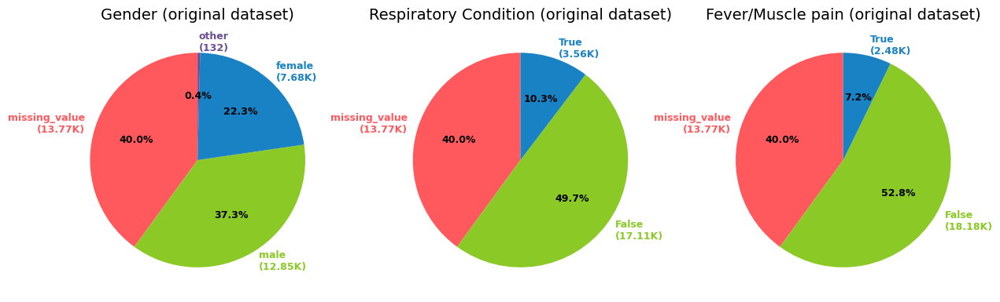

In [22]:
cols = ['gender', 'respiratory_condition', 'fever_muscle_pain']
titles = ['Gender (original dataset)', 'Respiratory Condition (original dataset)',
         'Fever/Muscle pain (original dataset)']
plot_pie_charts(metadata, cols, titles)

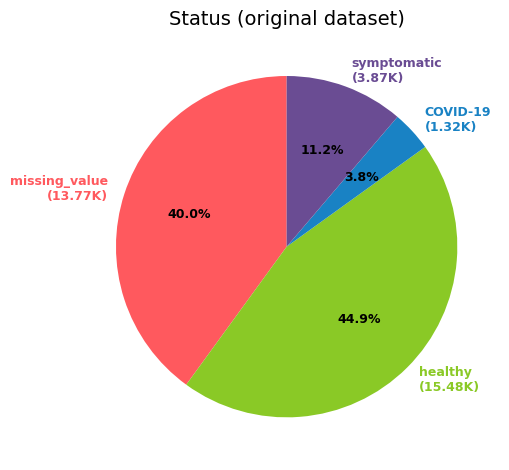

In [23]:
plot_pie_chart(metadata, 'status', 'Status (original dataset)')

As we can see, approximately `40%` of the data has missing values. Also, the features and status are imbalanced.

The recordings containing coughs were also re-labeled by the dataset creators according to a semi-supervised learning algorithm that combined the user labels with those of the expert physicians, which were modeled using ML and expanded on the previously unlabeled data. These labels can be found in the "status_SSL" column. Let's visualize the SSL status labels.

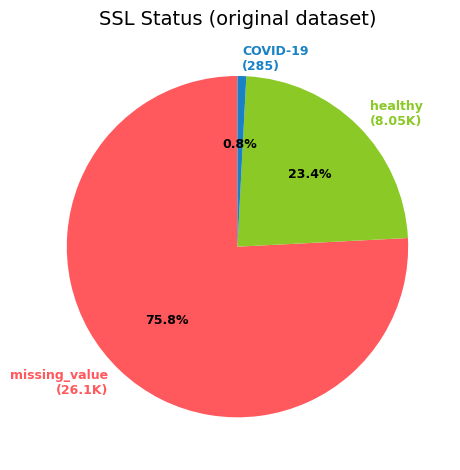

Total SSL label predictions: 8331. From those:
 - 1047 were previously unlabeled
 - 7284 were labeled (6528 correct predictions - 89.6% accuracy)


In [24]:
plot_pie_chart(metadata, 'status_SSL', 'SSL Status (original dataset)')

preds = metadata[~metadata['status_SSL'].isnull()]
labeled = preds[~preds['status'].isnull()]
correct = len(labeled[labeled['status'] == labeled['status_SSL']])
print(f"Total SSL label predictions: {len(preds)}. From those:")
print(f" - {len(preds[preds['status'].isnull()])} were previously unlabeled")
print(f" - {len(labeled)} were labeled ({correct} correct predictions - {correct/len(labeled)*100:.1f}% accuracy)")

---
## Part 2: Find a suitable subset of the dataset
Based on the previous results, I decided to keep only entries (rows) where the `status` (classification label) and the features `gender`, `respiratory_condition`, `fever_muscle_pain` and `age` are not missing. I believe those features are of great importance, since we are working with cough audio recordings, the sound of which depend on those features. Since the experts physicians disagree with each other, I decided to discard the expert annotations and SSL_status features. I also removed the metadata about location and datetime.

In [25]:
dataset = metadata[~metadata['age'].isnull()].iloc[: , :11]
dataset = dataset.drop(['datetime', 'latitude', 'longitude', 'status_SSL'], axis=1)

dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19396 entries, 1 to 34433
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   uuid                   19396 non-null  object 
 1   cough_detected         19396 non-null  float64
 2   age                    19396 non-null  float64
 3   gender                 19396 non-null  object 
 4   respiratory_condition  19396 non-null  object 
 5   fever_muscle_pain      19396 non-null  object 
 6   status                 19396 non-null  object 
dtypes: float64(2), object(5)
memory usage: 1.2+ MB


The dataset creators also provided the scipt `src/DSP.py` with the function `classify_cough` which estimates the probability that a given audio recording contains cough sound(s). Using that, the authors classified each recording. The results are in column `cough_detected`. Let's visualize it and listen to some samples. 

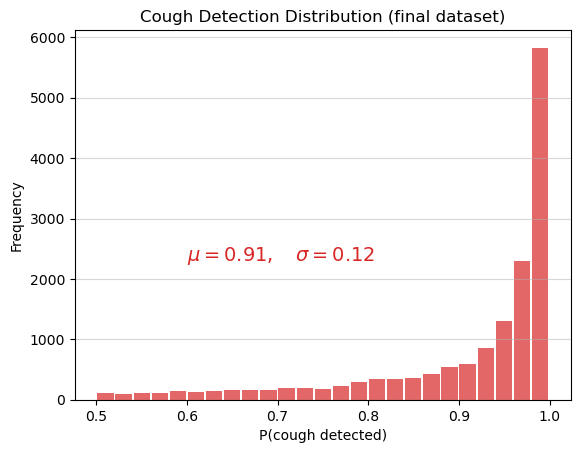

In [30]:
dataset['cough_detected'].plot.hist(color='#d82727', bins=25, rwidth=0.9, alpha=0.7)
plt.title('Cough Detection Distribution (final dataset)')
plt.xlabel('P(cough detected)')
plt.ylabel('Frequency')
plt.text(0.6, 2300, rf'$\mu={dataset["cough_detected"].mean():.2f}, \quad \sigma={dataset["cough_detected"].std():.2f}$',
        fontsize=14, color='#d82727')
plt.grid(axis='y', alpha=0.5)
plt.savefig('prob.svg')
plt.show()




print("picking some random recordings with different P(cough detected) to listen to")
for i in range(0, 7):
    start, end = i/10, (i+1)/10
    samples = dataset[(dataset['cough_detected'] >= start) & (dataset['cough_detected'] <= end)]
    sample, prob = samples['uuid'].values[0], samples['cough_detected'].values[0]
    print(f"{start} <= P(cough_detected)={prob:.2f} <= {end}: {sample}.wav")
    filename = "./coughvid_20211012/" + sample + ".wav"
    fs, x = wav.read(filename)
    display(Audio(x, rate=fs))

I decided to use a threshold of `0.5` and keep only files which are more likely to contain cough sounds (some recordings contained silence, or just speaking/background noise, which was not good for our purposes)

In [27]:
cough_threshold = 0.5
dataset = dataset[dataset['cough_detected'] >= cough_threshold]
dataset = dataset.reset_index(drop=True)
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15292 entries, 0 to 15291
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   uuid                   15292 non-null  object 
 1   cough_detected         15292 non-null  float64
 2   age                    15292 non-null  float64
 3   gender                 15292 non-null  object 
 4   respiratory_condition  15292 non-null  object 
 5   fever_muscle_pain      15292 non-null  object 
 6   status                 15292 non-null  object 
dtypes: float64(2), object(5)
memory usage: 836.4+ KB


Let's visualize some statistics of the new dataset 

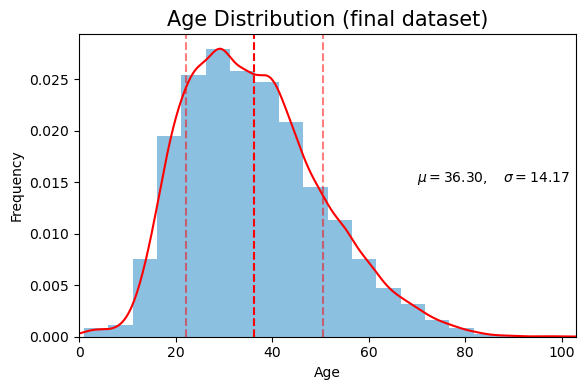

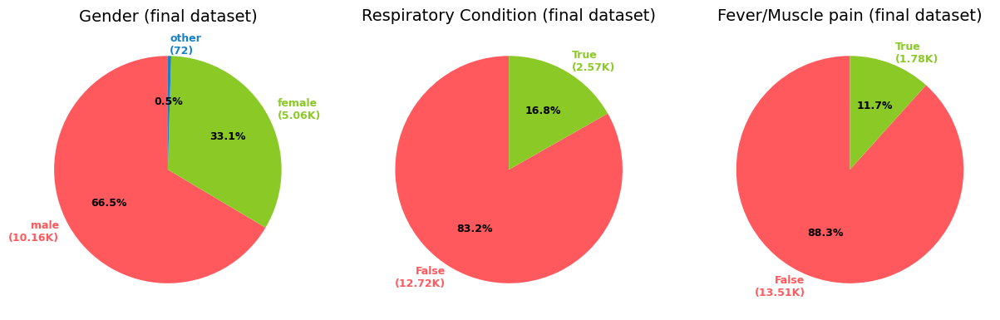

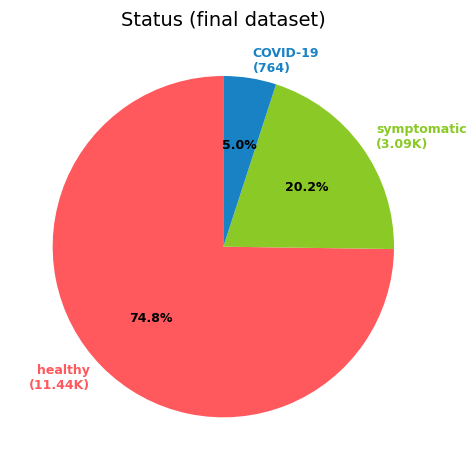

In [32]:
plot_distribution(dataset, 'age', 'Age Distribution (final dataset)', 'Age', 'age.svg')
cols = ['gender', 'respiratory_condition', 'fever_muscle_pain']
titles = ['Gender (final dataset)', 'Respiratory Condition (final dataset)',
         'Fever/Muscle pain (final dataset)']
plot_pie_charts(dataset, cols, titles, 'features.svg')
plot_pie_chart(dataset, 'status', 'Status (final dataset)', 'status.svg')

Now the features are clean. There are no missing values. Perhaps I should also remove all the entries with `gender==other`, since they are so few compared to `male/female` and may cause problems with the training.

---
## Part 3: Appending the new features to the dataset
Now that we have 'cleaned' the dataset, we can generate and add to the dataset the extracted audio features, using the [openSMILE library](https://audeering.github.io/opensmile-python/index.html)

Let's first see the process on a single file. Firstly, let's load, plot and listen to the file.  

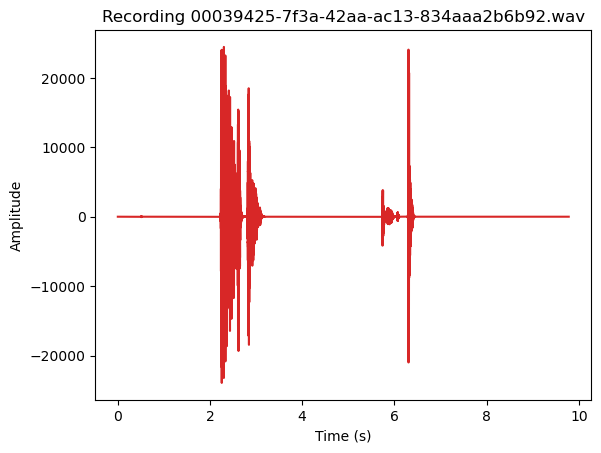

In [34]:
filename = '00039425-7f3a-42aa-ac13-834aaa2b6b92.wav'
fs, x = wav.read(recordings_dir+filename)

time = np.linspace(0, len(x)/fs, num=len(x))
plt.plot(time, x, color='#d82727')
plt.title(f'Recording {filename}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.savefig('sound.png')
plt.show()

Audio(x, rate=fs)

I use the database creators' script `src/segmentation.py` with an automatic cough segmentation function, which segments each individual cough sound using the `segment_cough` function. I used the default parameters, so the minimal cough length (below which segments are discarded) is set to 200ms and the "padding" (extra signal samples before and after each detected cough) to 200ms. These thresholds are based on the physiology of cough sounds. The segmentation produces the following results:

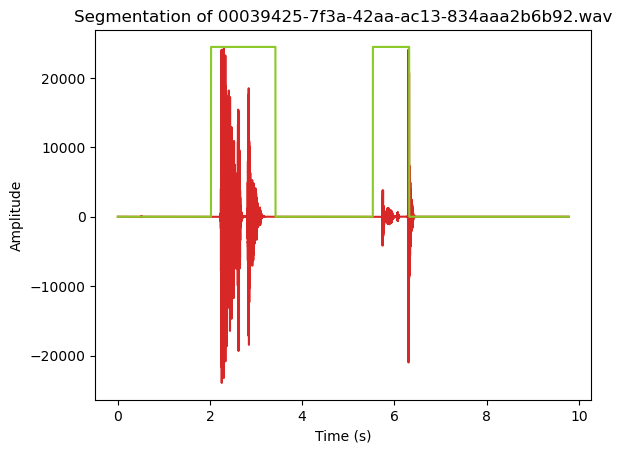

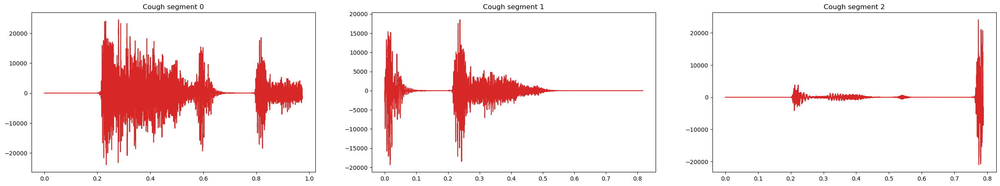

In [39]:
cough_segments, cough_mask = segment_cough(x,fs)
mask = np.zeros(len(x))
mask[cough_mask] = max(x)
time = np.linspace(0, len(x)/fs, num=len(x))

plt.plot(time, x, color='#d82727')
plt.plot(time, mask, color='#8ac926')
plt.title(f'Segmentation of {filename}')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.savefig('segmented.svg')
plt.show()

fig, axs = plt.subplots(1, len(cough_segments), figsize=(30,5))
for i in range(0,len(cough_segments)):
    time = np.linspace(0, len(cough_segments[i])/fs, num=len(cough_segments[i]))
    axs[i].plot(time, cough_segments[i], color='#d82727')
    axs[i].set_title("Cough segment " + str(i))
plt.savefig('segments.svg')

Now I want to classify the segments again and check the results. In order to do that, I use the trained model provided in the Coughvid dataset.

In [40]:
data_folder = './models'
loaded_model = pickle.load(open(os.path.join(data_folder, 'cough_classifier'), 'rb'))
loaded_scaler = pickle.load(open(os.path.join(data_folder,'cough_classification_scaler'), 'rb'))

probability = classify_cough(x, fs, loaded_model, loaded_scaler)
print(f"The file has a {round(probability*100,2)} % probability of being a cough:")
display(Audio(x, rate=fs))

probabilities = []
for i in range(len(cough_segments)):
    probability = classify_cough(cough_segments[i], fs, loaded_model, loaded_scaler)
    probabilities.append(probability)
    print(f"Segment {i} has a {round(probability*100,2)} % probability of being a cough")
    display(Audio(cough_segments[i], rate=fs))

/home/johnnykaz/anaconda3/envs/project_577/lib/python3.9/site-packages/sklearn/base.py:288: UserWarning: Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 1.2.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/home/johnnykaz/anaconda3/envs/project_577/lib/python3.9/site-packages/sklearn/base.py:288: UserWarning: Trying to unpickle estimator StandardScaler from version 0.22.1 when using version 1.2.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


The file has a 96.09 % probability of being a cough:


Segment 0 has a 89.68 % probability of being a cough


Segment 1 has a 74.48 % probability of being a cough


Segment 2 has a 46.59 % probability of being a cough


Now, I will use the openSMILE library to extract audio features. Specifically, I chose to extract features from the segment with the maximum probability of being a cough. Perhaps it would be nice to extract features from all segments and use the mean. 

I chose the eGeMAPSv2 feature set (88 features), since it contains high-level descriptors like jitter, shimmer, and harmonic-to-noise ratio, which describe the audio signal at a semantic level. These features are useful for characterizing the different sounds that are associated with respiratory diseases such as coughs.

Lets's see an example of feature extraction on the previous sound file

In [219]:
smile = opensmile.Smile(
    feature_set=opensmile.FeatureSet.eGeMAPSv02,
    feature_level=opensmile.FeatureLevel.Functionals,
)

segment_num = np.argmax(probabilities)
wav.write('temp.wav', fs, cough_segments[segment_num])
y = smile.process_file(os.path.join('temp.wav'))
y

,,,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,loudness_sma3_amean,loudness_sma3_stddevNorm,loudness_sma3_percentile20.0,loudness_sma3_percentile50.0,loudness_sma3_percentile80.0,loudness_sma3_pctlrange0-2,loudness_sma3_meanRisingSlope,loudness_sma3_stddevRisingSlope,loudness_sma3_meanFallingSlope,loudness_sma3_stddevFallingSlope,spectralFlux_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,mfcc4_sma3_amean,mfcc4_sma3_stddevNorm,jitterLocal_sma3nz_amean,jitterLocal_sma3nz_stddevNorm,shimmerLocaldB_sma3nz_amean,shimmerLocaldB_sma3nz_stddevNorm,HNRdBACF_sma3nz_amean,HNRdBACF_sma3nz_stddevNorm,logRelF0-H1-H2_sma3nz_amean,logRelF0-H1-H2_sma3nz_stddevNorm,logRelF0-H1-A3_sma3nz_amean,logRelF0-H1-A3_sma3nz_stddevNorm,F1frequency_sma3nz_amean,F1frequency_sma3nz_stddevNorm,F1bandwidth_sma3nz_amean,F1bandwidth_sma3nz_stddevNorm,F1amplitudeLogRelF0_sma3nz_amean,F1amplitudeLogRelF0_sma3nz_stddevNorm,F2frequency_sma3nz_amean,F2frequency_sma3nz_stddevNorm,F2bandwidth_sma3nz_amean,F2bandwidth_sma3nz_stddevNorm,F2amplitudeLogRelF0_sma3nz_amean,F2amplitudeLogRelF0_sma3nz_stddevNorm,F3frequency_sma3nz_amean,F3frequency_sma3nz_stddevNorm,F3bandwidth_sma3nz_amean,F3bandwidth_sma3nz_stddevNorm,F3amplitudeLogRelF0_sma3nz_amean,F3amplitudeLogRelF0_sma3nz_stddevNorm,alphaRatioV_sma3nz_amean,alphaRatioV_sma3nz_stddevNorm,hammarbergIndexV_sma3nz_amean,hammarbergIndexV_sma3nz_stddevNorm,slopeV0-500_sma3nz_amean,slopeV0-500_sma3nz_stddevNorm,slopeV500-1500_sma3nz_amean,slopeV500-1500_sma3nz_stddevNorm,spectralFluxV_sma3nz_amean,spectralFluxV_sma3nz_stddevNorm,mfcc1V_sma3nz_amean,mfcc1V_sma3nz_stddevNorm,mfcc2V_sma3nz_amean,mfcc2V_sma3nz_stddevNorm,mfcc3V_sma3nz_amean,mfcc3V_sma3nz_stddevNorm,mfcc4V_sma3nz_amean,mfcc4V_sma3nz_stddevNorm,alphaRatioUV_sma3nz_amean,hammarbergIndexUV_sma3nz_amean,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
file,start,end,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
temp.wav,0 days,0 days 00:00:00.973750,29.147787,0.14302,24.347471,28.68174,33.850906,9.503435,180.349869,75.443497,152.768784,54.856098,2.047622,0.868909,0.025269,1.950734,4.113896,4.088626,31.866455,19.502567,25.709593,14.112652,2.384522,0.97383,10.675084,0.622902,9.21643,1.113441,-0.287085,-25.226418,-1.3853,-5.489011,0.041748,0.158713,2.473864,0.500385,-2.576539,-2.210341,7.365292,3.9326,19.959433,1.395331,709.524353,0.263032,1142.051758,0.196176,-151.973297,-0.500731,1823.507202,0.143178,893.134888,0.272839,-148.130249,-0.514426,3154.431885,0.07686,844.823486,0.439588,-149.942154,-0.490604,-10.010859,-0.77674,15.86504,0.351406,0.069226,0.515813,-0.009294,-1.118046,1.784033,0.931783,16.025921,0.413723,17.960522,0.698823,-2.753078,-3.035764,-3.012717,-2.987465,-4.999527,12.242703,0.083004,-0.000141,3.825115,3.125,4.494382,0.0575,0.038971,0.145,0.110793,-18.483364



Now, let's calculate the features for each sample and add them to the dataset:

In [226]:
# first, add the new columns to the dataset and move 'status' (classification label) at the end
new_columns = list(dataset.columns)[:-1] + smile.feature_names + ['status']
dataset[smile.feature_names] = np.nan
dataset = dataset[new_columns]

In [261]:
no_segments_count = 0
no_segments_uuids = set()
corrupted = set()
length = len(dataset)-1

for i, uuid in enumerate(dataset['uuid']):
    filename = recordings_dir + uuid + '.wav'
    print(f"{i}/{length}: {filename}")
    try:
        fs, x = wav.read(filename)
    except:
        print(f'Corrupted file. Adding it to "corrupted" set to handle later')
        corrupted.add(filename)
    # if recording was not 'mono', get only the first channel
    if len(x.shape) != 1:
        x = x[:,0]
    cough_segments, cough_mask = segment_cough(x,fs)
    probabilities = [classify_cough(segm, fs, loaded_model, loaded_scaler) for segm in cough_segments]
    # if didn't find segments, use whole recording instead
    if len(cough_segments):
        segment_num = np.argmax(probabilities)
        file = cough_segments[segment_num]
        dataset.loc[dataset['uuid']==uuid, 'cough_detected'] = probabilities[segment_num]
    else:
        file = x
        no_segments_count += 1
        no_segments_uuids.add(uuid)
    wav.write('temp.wav', fs, file)
    y = smile.process_file(os.path.join('temp.wav'))
    dataset.loc[dataset['uuid']==uuid, smile.feature_names] = y.values
        
print("="*80)
print(f"for {no_segments_count} entries, couldn't detect cough segments, so the whole segment was used")
print(f"found {len(corrupted)} files (stored in 'corrupted' set). Please handle them.")

0/15291: ./coughvid_20211012/00039425-7f3a-42aa-ac13-834aaa2b6b92.wav
1/15291: ./coughvid_20211012/0009eb28-d8be-4dc1-92bb-907e53bc5c7a.wav
2/15291: ./coughvid_20211012/001328dc-ea5d-4847-9ccf-c5aa2a3f2d0f.wav
3/15291: ./coughvid_20211012/001e2f19-d81c-4029-b33c-d2db56b23a4a.wav
4/15291: ./coughvid_20211012/0028b68c-aca4-4f4f-bb1d-cb4ed5bbd952.wav
5/15291: ./coughvid_20211012/00291cce-36a0-4a29-9e2d-c1d96ca17242.wav
6/15291: ./coughvid_20211012/0029d048-898a-4c70-89c7-0815cdcf7391.wav
7/15291: ./coughvid_20211012/002d28bc-7806-4dfb-9c9b-afa8cb623cac.wav
8/15291: ./coughvid_20211012/0037f67c-0d6f-42e6-ab94-66499d4d2bf4.wav
9/15291: ./coughvid_20211012/003dbc72-83a9-442a-b130-c97d60ca794a.wav
10/15291: ./coughvid_20211012/003e1bf6-2ecf-4a00-9198-29db34e8d7ac.wav
11/15291: ./coughvid_20211012/00432f00-2477-4faf-a440-cc1276065b4a.wav
12/15291: ./coughvid_20211012/0044964d-f7e9-43e3-831f-ae3e6374a9a4.wav
13/15291: ./coughvid_20211012/0044cb7b-448c-44e5-8302-ad8bd106fe3e.wav
14/15291: ./coug

109/15291: ./coughvid_20211012/01ba3311-afec-4b53-a318-55216e0e7fae.wav
110/15291: ./coughvid_20211012/01bbb397-434a-40d1-9e14-43869155df5e.wav
111/15291: ./coughvid_20211012/01bce73f-86a6-40dd-87c1-d4cda2b79ea2.wav
112/15291: ./coughvid_20211012/01bf9678-b237-4e9d-8552-fe7b0ee650f5.wav
113/15291: ./coughvid_20211012/01c1c8d7-611c-4a28-b48a-8f0ce3506e49.wav
Corrupted file. Adding it to "corrupted" set to handle later
114/15291: ./coughvid_20211012/01c3dbd5-8f95-4878-8dd0-1aa929fd47a2.wav
115/15291: ./coughvid_20211012/01c9a962-098e-4c00-b249-518f95cf62c7.wav
116/15291: ./coughvid_20211012/01cc0555-d950-43f5-9bef-9be6dee3a892.wav
117/15291: ./coughvid_20211012/01d3857d-689f-4bc1-a6ca-97b9233df46f.wav
118/15291: ./coughvid_20211012/01dc13fa-4b56-41fe-8b01-d2ed9a3a4099.wav
119/15291: ./coughvid_20211012/01ded1fd-8a1b-4570-87ac-3fd7c789ea83.wav
120/15291: ./coughvid_20211012/01e03a0a-df5f-40b7-9196-af39fcaa261f.wav
121/15291: ./coughvid_20211012/01e0c749-1431-4cfa-8984-1629f2d3e5c4.wav
122

215/15291: ./coughvid_20211012/033c43c3-3a99-41bb-b662-0c546c3cb37f.wav
216/15291: ./coughvid_20211012/033da4e3-7365-4adc-9252-7347816e4e77.wav
217/15291: ./coughvid_20211012/033f4e9f-6873-4846-a5be-c6f5eb5bf0fc.wav
218/15291: ./coughvid_20211012/0341fb44-3b0d-4754-a32b-8ced68adbc11.wav
219/15291: ./coughvid_20211012/03430d6b-4554-4ffe-8c82-507832dc1d52.wav
220/15291: ./coughvid_20211012/03438f19-1a33-4a8b-980d-a9e2821e92dc.wav
221/15291: ./coughvid_20211012/034832ff-2598-40ac-acb0-a892812cec1b.wav
222/15291: ./coughvid_20211012/0348ad3b-e0b1-4a36-bc8a-ff381e529739.wav
223/15291: ./coughvid_20211012/03495344-ae35-497f-99c5-3392b77618b9.wav
224/15291: ./coughvid_20211012/034aa6d3-6673-47a1-a319-325aa9be44a2.wav
225/15291: ./coughvid_20211012/03587993-6548-4e37-b585-4ed49b4f9a56.wav
226/15291: ./coughvid_20211012/0358b80d-4378-4765-a733-5fb2294cb255.wav
227/15291: ./coughvid_20211012/035973bd-61a9-4cb5-ad79-45099b519a40.wav
228/15291: ./coughvid_20211012/035a5768-a6f3-4462-9ae7-c92f59b9f

328/15291: ./coughvid_20211012/055a7209-46f8-485d-9933-af57e8dff7ec.wav
329/15291: ./coughvid_20211012/056379f3-faca-437c-82d2-f26831d8ed0a.wav
330/15291: ./coughvid_20211012/05688744-5e34-43b5-9bcc-ced86fb0fc68.wav
331/15291: ./coughvid_20211012/0569d979-384b-4a30-b0ca-2b19e8c8650b.wav
332/15291: ./coughvid_20211012/05765d34-69e5-4a39-92da-d51b2ab8ffb6.wav
333/15291: ./coughvid_20211012/057f02e2-865c-4f4b-b08d-1538d1145ffd.wav
334/15291: ./coughvid_20211012/0580f7a3-775c-485c-badc-3612bb2e14db.wav
335/15291: ./coughvid_20211012/0588fbb6-1403-4b1c-8fd7-8a573fd16b0f.wav
Corrupted file. Adding it to "corrupted" set to handle later
336/15291: ./coughvid_20211012/058e2950-12ac-4ebb-a56c-ba4a6943d8f6.wav
337/15291: ./coughvid_20211012/059091a7-891b-4439-a585-be8774d0d5b3.wav
338/15291: ./coughvid_20211012/0593e9bf-e162-46c2-b1d5-3bc34ef1fc6f.wav
339/15291: ./coughvid_20211012/05941a72-f63b-45c7-bb1f-6e0a76440674.wav
340/15291: ./coughvid_20211012/059ae242-fffd-44c7-b821-9d73f93449aa.wav
341

437/15291: ./coughvid_20211012/0744becc-affd-449a-aa2a-274ed1f096c4.wav
438/15291: ./coughvid_20211012/0745a6ed-bcab-49eb-9d2a-17819c2bf9b8.wav
439/15291: ./coughvid_20211012/0750786a-538d-48c2-9db1-ada9e2ea1fdd.wav
440/15291: ./coughvid_20211012/0755730a-3c52-4eeb-a66c-baeb83187827.wav
441/15291: ./coughvid_20211012/0757b02b-8544-4fdc-b634-9e5b72f7a1e7.wav
442/15291: ./coughvid_20211012/075bc6b3-8011-4cfe-a866-6d3b5e95f8e2.wav
443/15291: ./coughvid_20211012/075cdb5a-5c29-4266-84ea-c44963bd0454.wav
444/15291: ./coughvid_20211012/075eb140-d61d-4a3f-9fce-4b2559e0a4b5.wav
445/15291: ./coughvid_20211012/07605d5e-6800-4f1c-83de-0cab036d59bd.wav
446/15291: ./coughvid_20211012/0762a05c-1356-4058-af32-ed09fc495f84.wav
447/15291: ./coughvid_20211012/0762cd0a-5ce6-4b1b-9374-5d4396c218ed.wav
448/15291: ./coughvid_20211012/076b4f38-d326-4688-b0bb-6cf542b3aa61.wav
449/15291: ./coughvid_20211012/077ccf6a-f8c4-4b13-9752-7a6126638c81.wav
450/15291: ./coughvid_20211012/077edc1c-7f85-41a3-941a-cac380f92

545/15291: ./coughvid_20211012/09161b42-1234-4fd7-8d23-d0a4094ee15d.wav
546/15291: ./coughvid_20211012/091c4195-afa0-4822-a4a5-98cb4902d070.wav
547/15291: ./coughvid_20211012/091e8ac0-1cab-4853-8662-4a127c2f4b64.wav
548/15291: ./coughvid_20211012/091f4e75-dd27-47cb-852a-b23923cdd804.wav
549/15291: ./coughvid_20211012/09215962-fc36-44a4-8d64-0c89713b5433.wav
550/15291: ./coughvid_20211012/092a0f31-db97-4d45-a643-c5984b6f4cf9.wav
Corrupted file. Adding it to "corrupted" set to handle later
551/15291: ./coughvid_20211012/092c9275-85f0-4fd4-b64a-b1b3cdf683ec.wav
552/15291: ./coughvid_20211012/092d10af-b848-473c-8dfd-19376b7c587a.wav
553/15291: ./coughvid_20211012/0932e32e-8c64-4333-a8e7-e6c7b612a89f.wav
554/15291: ./coughvid_20211012/0933baf0-16b4-458e-b4a4-118e60cdb55c.wav
555/15291: ./coughvid_20211012/093d58ba-033a-4881-b5d0-582c7723669a.wav
556/15291: ./coughvid_20211012/093e31e6-a9cd-40c6-aa3c-252ddc7b58ef.wav
557/15291: ./coughvid_20211012/0941c9a0-7d1d-4c69-9626-e9abcfcc3460.wav
558

656/15291: ./coughvid_20211012/0b088d77-d695-4d18-b3cb-235d1cc69f73.wav
657/15291: ./coughvid_20211012/0b0b0aa7-b3fd-43f5-8292-9687f7df34de.wav
658/15291: ./coughvid_20211012/0b0d7e10-8353-4124-a16b-bf96e405f63c.wav
659/15291: ./coughvid_20211012/0b0df277-37ff-4d6b-a8aa-b7cbbe8eaf90.wav
660/15291: ./coughvid_20211012/0b0fcb49-00ae-490d-8755-76f2297f5be0.wav
661/15291: ./coughvid_20211012/0b110058-23cc-4396-9e99-34f78cb72ce8.wav
662/15291: ./coughvid_20211012/0b11a8d8-29d5-4133-bc92-edd442330fb1.wav
663/15291: ./coughvid_20211012/0b130d1c-e411-46fe-9e38-71c11f9d9195.wav
664/15291: ./coughvid_20211012/0b14b4fa-edf0-4595-89af-d4a69208205b.wav
665/15291: ./coughvid_20211012/0b207336-533a-42db-bb5a-bd783defee90.wav
666/15291: ./coughvid_20211012/0b26bdbc-210a-4054-a683-f155e67ad2d1.wav
667/15291: ./coughvid_20211012/0b2f37f5-0b2d-402f-a28e-6e80331e44a5.wav
668/15291: ./coughvid_20211012/0b2f75d7-f116-4f35-ae4c-f2018eab2794.wav
669/15291: ./coughvid_20211012/0b35d226-9927-4ddc-b5ea-cca273d43

766/15291: ./coughvid_20211012/0ca8fec1-d01e-497c-82a0-abb1bb7442cb.wav
767/15291: ./coughvid_20211012/0cb18590-3107-42dc-b0ca-63b897f15a8b.wav
768/15291: ./coughvid_20211012/0cb57c85-f55d-4667-91ff-8f93989eba42.wav
769/15291: ./coughvid_20211012/0cb72725-4166-475d-99a2-5e4e269c1eea.wav
770/15291: ./coughvid_20211012/0cb74311-3d2e-416b-bb5b-bed7615c2478.wav
771/15291: ./coughvid_20211012/0cb7b8ce-bdb8-4f57-9fbb-d4f8fb094287.wav
772/15291: ./coughvid_20211012/0cb8780c-7418-4033-880b-d90d73a4fa7a.wav
773/15291: ./coughvid_20211012/0cbb5c85-7512-4b59-b491-e01c23a7a8a5.wav
774/15291: ./coughvid_20211012/0ccb89b4-61e5-4049-925f-6131cd398091.wav
775/15291: ./coughvid_20211012/0ccb9b94-5a4d-41d5-9197-386236ba545f.wav
776/15291: ./coughvid_20211012/0cce538a-ab9f-4a1e-a6ec-5594f21e8093.wav
777/15291: ./coughvid_20211012/0cce7542-7e40-499b-a098-978518473f9a.wav
778/15291: ./coughvid_20211012/0cd9698a-3077-42cd-9c3b-27c9537b5c83.wav
779/15291: ./coughvid_20211012/0cd9f425-11bb-4cba-80cf-b72df4f08

876/15291: ./coughvid_20211012/0eba0c0a-5609-4777-903d-b15292798250.wav
877/15291: ./coughvid_20211012/0ebcd337-e754-4955-a935-f7b3f04ec5ff.wav
878/15291: ./coughvid_20211012/0ebd7e72-97b3-40df-a661-68c69f42accf.wav
879/15291: ./coughvid_20211012/0ec21acc-d92b-46c3-8228-04ea2b3eccad.wav
880/15291: ./coughvid_20211012/0ec4ad51-44b4-4fa1-8635-8dd5f7452896.wav
881/15291: ./coughvid_20211012/0ec6c058-60b6-4fa4-8280-ce63d442914b.wav
882/15291: ./coughvid_20211012/0ed0b9bd-afbb-4869-8c06-55204afc8ff2.wav
883/15291: ./coughvid_20211012/0ed0f24e-8e57-4183-9b9f-837a701f87df.wav
884/15291: ./coughvid_20211012/0ed2682f-2b54-42c6-8e39-9faa7c76c673.wav
885/15291: ./coughvid_20211012/0ed9987f-9a71-4bf2-b8f9-5e787f559ae7.wav
886/15291: ./coughvid_20211012/0eda2d8e-8b47-4247-bcbe-8a1733329936.wav
887/15291: ./coughvid_20211012/0edfcc75-102f-4d34-bf67-97c6838a21cc.wav
888/15291: ./coughvid_20211012/0ee6bcca-aba7-45a0-a2ec-ed76037a2e82.wav
889/15291: ./coughvid_20211012/0eea8efa-695c-4ee9-a4ad-c008cec18

986/15291: ./coughvid_20211012/107d76db-10bb-4fd1-bf6f-a2d8a97f56e4.wav
987/15291: ./coughvid_20211012/1080b72c-f243-4e5d-96e5-a9c12c0eaed0.wav
988/15291: ./coughvid_20211012/1081144f-560d-40ec-ad07-52e1c62a2f78.wav
989/15291: ./coughvid_20211012/10820737-de4d-4d54-b239-9e0ff6b09361.wav
990/15291: ./coughvid_20211012/1084a359-74d8-4666-9034-7f964788b2c1.wav
991/15291: ./coughvid_20211012/1084d790-fc11-4649-b0fb-159d8a6d84b4.wav
992/15291: ./coughvid_20211012/108c8c35-a867-4fe9-bee3-c4392361d385.wav
993/15291: ./coughvid_20211012/1090cfe8-0e87-4eb8-a2ef-a23de44bb106.wav
994/15291: ./coughvid_20211012/1090edf5-7840-4453-8a96-6e808b036716.wav
995/15291: ./coughvid_20211012/10a416c8-a323-41e5-ba84-889a31485945.wav
996/15291: ./coughvid_20211012/10a526d6-aa83-4ba9-ab1a-ef7ee9d03924.wav
997/15291: ./coughvid_20211012/10ad068e-3a4b-4792-99c8-68e67dbea65e.wav
998/15291: ./coughvid_20211012/10aed3ae-9ec1-4041-bac6-90b1d4634aee.wav
999/15291: ./coughvid_20211012/10af8f78-3647-4027-9512-8ea4e6ccb

1093/15291: ./coughvid_20211012/125243ce-cda2-4412-a38c-474dd3875d1f.wav
1094/15291: ./coughvid_20211012/125455fd-b358-4621-a80f-bc5889eb1cb3.wav
1095/15291: ./coughvid_20211012/1257af44-1b35-4758-a764-88447aaf8ba3.wav
1096/15291: ./coughvid_20211012/125d6913-c967-4c18-9bf7-af09c974269a.wav
1097/15291: ./coughvid_20211012/1262a32f-65ff-452b-8c6a-f1a1d14c31a4.wav
1098/15291: ./coughvid_20211012/126b940c-b6c6-4d3d-adc2-92aafab911b4.wav
1099/15291: ./coughvid_20211012/126c431c-c8e6-4ce5-a4fc-bbb5829c078b.wav
1100/15291: ./coughvid_20211012/126c8949-06ca-4636-a8c7-c8f98eeb81fc.wav
1101/15291: ./coughvid_20211012/1273d304-c974-473a-b9eb-f8c42e3a8389.wav
1102/15291: ./coughvid_20211012/1278ade5-08ec-4993-b5f8-8b8cf522e7be.wav
1103/15291: ./coughvid_20211012/12881ff3-b042-4ea2-b1b4-5fba85525523.wav
1104/15291: ./coughvid_20211012/128a6dbb-44ac-4478-81de-e6ed135f3e0a.wav
1105/15291: ./coughvid_20211012/128aac08-4a43-4a36-ac34-5f294d90ca2e.wav
1106/15291: ./coughvid_20211012/1294044f-b1df-4b9e-

1202/15291: ./coughvid_20211012/1438c8ae-65ec-4518-9f3e-8a48c80223b4.wav
1203/15291: ./coughvid_20211012/143cc801-ad6d-4a0d-b1c6-c0e584e59a38.wav
1204/15291: ./coughvid_20211012/1444cd5b-76da-479f-845c-57349427911f.wav
1205/15291: ./coughvid_20211012/1444f65f-7d61-4cb4-87a3-189d5330763b.wav
1206/15291: ./coughvid_20211012/144aee04-db4b-4eea-bb1a-d4e35ac2cbd9.wav
1207/15291: ./coughvid_20211012/144af6f3-50e9-4622-b2b7-9a41256b492b.wav
1208/15291: ./coughvid_20211012/144b04ae-6c59-4b80-b024-3a16b6407c06.wav
1209/15291: ./coughvid_20211012/144cd672-7f14-4fe9-952b-450ca6f16536.wav
1210/15291: ./coughvid_20211012/145039c8-e81f-4a3f-b1d7-20a11c9f8f3d.wav
Corrupted file. Adding it to "corrupted" set to handle later
1211/15291: ./coughvid_20211012/14550d03-92e2-4fce-82cc-6051ed8ad3c4.wav
1212/15291: ./coughvid_20211012/1455b3af-0901-43f5-aa16-64fb01113eac.wav
1213/15291: ./coughvid_20211012/145ecdb4-01d0-4750-a719-61b3c40e9132.wav
1214/15291: ./coughvid_20211012/146144cb-ba2e-41fe-aed4-75835f0

1310/15291: ./coughvid_20211012/1618b8cb-832b-40b0-b94b-5e7be9183b03.wav
1311/15291: ./coughvid_20211012/1619a23c-3e9c-4ea2-a8e7-65766dc442b6.wav
1312/15291: ./coughvid_20211012/161b0476-b376-4b0b-b475-9fdf0450b6ce.wav
1313/15291: ./coughvid_20211012/161b76f0-e80a-4137-aa7c-5426df15ec91.wav
1314/15291: ./coughvid_20211012/161d1ac7-7dc1-440e-96e1-fa091f76d828.wav
1315/15291: ./coughvid_20211012/162b70d5-62d4-4e95-afc6-b80ad021902b.wav
1316/15291: ./coughvid_20211012/1630f2dd-35bf-41a3-bb6e-e1517a8228d4.wav
1317/15291: ./coughvid_20211012/163102a4-69b1-49b0-8f4d-c6c5e161ed35.wav
1318/15291: ./coughvid_20211012/1633160c-7c90-4beb-b680-29dcdf005716.wav
1319/15291: ./coughvid_20211012/16346c4f-3383-4471-9074-afba6d824c7b.wav
1320/15291: ./coughvid_20211012/163b3d1e-20da-4cad-bfac-1bc123f0a861.wav
1321/15291: ./coughvid_20211012/163ffa20-8a68-4fb9-88d6-c8944ab1c30f.wav
1322/15291: ./coughvid_20211012/1645e119-c9ee-4cf8-9a87-31bcc8b025bb.wav
1323/15291: ./coughvid_20211012/1645f68f-f295-49e8-

1420/15291: ./coughvid_20211012/17e623e8-7179-4805-889b-83ba37063d21.wav
1421/15291: ./coughvid_20211012/17e64b3f-c248-4a33-b71e-49513a8174f2.wav
1422/15291: ./coughvid_20211012/17ee0f10-42d5-4122-9b18-381a4eeb652f.wav
1423/15291: ./coughvid_20211012/17ee50fd-ac0a-49eb-b8b6-9aba80294e01.wav
1424/15291: ./coughvid_20211012/17f3ecae-f2a5-470a-8752-98a2aca19842.wav
1425/15291: ./coughvid_20211012/17f5b575-11ea-49a9-b5ca-aad540a9d9b4.wav
1426/15291: ./coughvid_20211012/17fcbeb7-ea46-45fb-84f7-8b25d11412ae.wav
1427/15291: ./coughvid_20211012/17ff41b3-1ac5-4689-b5f1-056851201c26.wav
1428/15291: ./coughvid_20211012/1809b726-b681-41eb-93ef-be88b8c74ae1.wav
1429/15291: ./coughvid_20211012/18119284-4400-42b1-aa87-883ebdb71cf6.wav
1430/15291: ./coughvid_20211012/181236e0-0d50-407d-b5c7-a5a8efd277ac.wav
1431/15291: ./coughvid_20211012/181c015f-908d-41d1-a883-cf42108f8a21.wav
1432/15291: ./coughvid_20211012/182891db-b9c3-47a2-b00e-6586f45373a8.wav
1433/15291: ./coughvid_20211012/1830e097-2803-4208-

1525/15291: ./coughvid_20211012/198f3500-da31-4e16-aa93-05e56a62eea2.wav
1526/15291: ./coughvid_20211012/198fc8a1-f269-410c-a791-c32aaf60bb9b.wav
1527/15291: ./coughvid_20211012/19931f75-e977-4b1c-9022-5202edf311fa.wav
Corrupted file. Adding it to "corrupted" set to handle later
1528/15291: ./coughvid_20211012/1993e04b-8999-47f1-8ff8-06cf7d248d6c.wav
1529/15291: ./coughvid_20211012/19958d50-0b8b-4486-8bae-a425d825deae.wav
1530/15291: ./coughvid_20211012/19a26765-2f6b-42cf-a0d6-80acbef7982c.wav
1531/15291: ./coughvid_20211012/19a50439-6b34-484d-888d-75f45a3c080d.wav
1532/15291: ./coughvid_20211012/19a6c3aa-844c-44f9-a963-a52e3793da31.wav
1533/15291: ./coughvid_20211012/19a75f25-d496-4ecd-9ce0-1ecb6be0d83d.wav
1534/15291: ./coughvid_20211012/19b21275-826c-4513-a26d-5dacb0dad30f.wav
1535/15291: ./coughvid_20211012/19b219a7-52e6-4842-9aa7-ff15bc8f3921.wav
1536/15291: ./coughvid_20211012/19b6e2ab-ba74-4760-a4f3-b97cb0d7dece.wav
1537/15291: ./coughvid_20211012/19b85386-f4cd-42ba-a5b0-f3f60c4

1631/15291: ./coughvid_20211012/1b0ee04c-9a59-40f0-a66b-a6d609544d5f.wav
1632/15291: ./coughvid_20211012/1b1544b5-dc2d-4d05-9605-fb7e995522fc.wav
1633/15291: ./coughvid_20211012/1b17ad1b-c036-46a8-8a9d-b0bdb65019c4.wav
1634/15291: ./coughvid_20211012/1b1caac9-c0b1-4ab4-a873-a87fec40355a.wav
1635/15291: ./coughvid_20211012/1b1f2c9b-7cfa-4eb5-837d-36ae3d647c92.wav
1636/15291: ./coughvid_20211012/1b202aa0-1bf2-4117-ade4-a0f77450191e.wav
1637/15291: ./coughvid_20211012/1b208457-5a9e-4768-a03c-1434aa8736c5.wav
1638/15291: ./coughvid_20211012/1b242487-86a5-4cd5-9a1b-455765f49e7b.wav
1639/15291: ./coughvid_20211012/1b25273d-6761-47f7-b1e3-36ed0d0b4701.wav
1640/15291: ./coughvid_20211012/1b28b800-9812-4128-809f-688a7ac8657d.wav
1641/15291: ./coughvid_20211012/1b2c13c5-bbc2-4aa1-99b5-82f91efb7c67.wav
1642/15291: ./coughvid_20211012/1b2e1b26-fd64-4532-838f-899137f95f7a.wav
1643/15291: ./coughvid_20211012/1b3f0979-38d9-4858-91cb-ffc017a7fa74.wav
1644/15291: ./coughvid_20211012/1b427191-6752-40b4-

1742/15291: ./coughvid_20211012/1d141121-43db-4b7e-bc89-246b33ce4ea6.wav
1743/15291: ./coughvid_20211012/1d146112-7784-4213-ad55-4a276c37fcb6.wav
1744/15291: ./coughvid_20211012/1d19775f-175d-4fdd-8dfe-c080a0c8de45.wav
1745/15291: ./coughvid_20211012/1d1b2daf-5b26-4176-b826-c521d25ee5c5.wav
1746/15291: ./coughvid_20211012/1d1c5926-b155-43f0-b9e3-5d3d20ae604d.wav
1747/15291: ./coughvid_20211012/1d1dd53c-0b98-4ebd-a34b-e168bff6b7da.wav
1748/15291: ./coughvid_20211012/1d1f1138-e687-43e7-9de3-164d74a20db3.wav
Corrupted file. Adding it to "corrupted" set to handle later
1749/15291: ./coughvid_20211012/1d21d856-538f-4131-9926-3a31a366b752.wav
Corrupted file. Adding it to "corrupted" set to handle later
1750/15291: ./coughvid_20211012/1d25a9d2-3731-4cf1-9c07-bb14e28a63c2.wav
1751/15291: ./coughvid_20211012/1d29ed0d-0fae-4656-b886-75aee4a250f8.wav
1752/15291: ./coughvid_20211012/1d2c71d3-38a3-4814-bfbc-4b9791c21e57.wav
1753/15291: ./coughvid_20211012/1d2ed7f6-e51d-4d8b-ba0b-61002732f12d.wav
17

1848/15291: ./coughvid_20211012/1ed9491a-4036-4308-bc44-5036fc2e9f28.wav
1849/15291: ./coughvid_20211012/1ee7f97c-60a9-46a1-a476-0390bc33c7d2.wav
Corrupted file. Adding it to "corrupted" set to handle later
1850/15291: ./coughvid_20211012/1ef3544d-a3d8-4058-af36-5d991d009276.wav
1851/15291: ./coughvid_20211012/1eff6dde-1550-42a8-89f3-968af39d25df.wav
1852/15291: ./coughvid_20211012/1f0008d8-d25b-4438-9ef9-f766a45c619c.wav
1853/15291: ./coughvid_20211012/1f0150f1-2882-4978-82cf-7786e0346f2e.wav
1854/15291: ./coughvid_20211012/1f0246b1-1ebe-4aae-9d26-de4e1006706e.wav
1855/15291: ./coughvid_20211012/1f0715b6-0d61-4a68-80a4-8c1074fde9b8.wav
1856/15291: ./coughvid_20211012/1f0d8f3b-c4fb-4f3e-b814-4b89f5cb03be.wav
1857/15291: ./coughvid_20211012/1f122310-8f45-4b47-9a83-f186868ed2a1.wav
1858/15291: ./coughvid_20211012/1f132f6c-7fe3-4419-b178-9b007751ef54.wav
1859/15291: ./coughvid_20211012/1f20d236-5904-42b5-994d-27283195f95f.wav
1860/15291: ./coughvid_20211012/1f292253-394e-4fd1-b43e-81289c1

1957/15291: ./coughvid_20211012/21092164-1584-43be-9f50-20fcca7762b9.wav
1958/15291: ./coughvid_20211012/2116e1b7-94b7-4f21-ba26-da9c9c08cdfc.wav
Corrupted file. Adding it to "corrupted" set to handle later
1959/15291: ./coughvid_20211012/2119c740-f1c6-4079-b808-071b3906a43d.wav
1960/15291: ./coughvid_20211012/211a8ca5-3270-49bf-b830-4f47ce1857cf.wav
1961/15291: ./coughvid_20211012/211c948b-1f0f-4e9d-ba8a-45aaf9496a78.wav
1962/15291: ./coughvid_20211012/211e05b4-e557-417b-8dc8-c2ed029c36f0.wav
1963/15291: ./coughvid_20211012/211f24c7-1e90-42b7-8c8c-d659b3e6c548.wav
1964/15291: ./coughvid_20211012/21241847-45ad-488a-aa47-5af3767aabe5.wav
1965/15291: ./coughvid_20211012/2124c72a-e68c-4c9d-b1d7-6ed8553dd7c9.wav
1966/15291: ./coughvid_20211012/21275136-dc85-4d36-ac0f-8503eeb4bb1b.wav
1967/15291: ./coughvid_20211012/212cb0e5-d5db-444d-a4fb-d60113566be3.wav
1968/15291: ./coughvid_20211012/212e4a83-34b9-4973-b0c4-c05567acdd8c.wav
1969/15291: ./coughvid_20211012/21318dc2-21c6-4302-a253-c402dba

2064/15291: ./coughvid_20211012/22aa69af-e8d0-4f05-9403-6b3e40d464f9.wav
2065/15291: ./coughvid_20211012/22ac37ec-1bae-4eab-87bc-e290cd014e8b.wav
2066/15291: ./coughvid_20211012/22ac9dc4-858e-4db5-886e-792d7553e67f.wav
2067/15291: ./coughvid_20211012/22b06845-109e-4c6d-88a4-6c4742384c54.wav
2068/15291: ./coughvid_20211012/22bef2e1-734c-471c-882f-0da1a8a2df56.wav
2069/15291: ./coughvid_20211012/22c0def5-68f5-40d3-a4fb-b2bad02abdf8.wav
2070/15291: ./coughvid_20211012/22c261f9-47db-450a-8846-8cb517e37421.wav
Corrupted file. Adding it to "corrupted" set to handle later
2071/15291: ./coughvid_20211012/22c68fe7-f409-4605-a5c4-a5e3938bd841.wav
2072/15291: ./coughvid_20211012/22ca815b-3174-40b3-adb9-310cdba33149.wav
2073/15291: ./coughvid_20211012/22cb791b-2eba-480f-9eb3-69018bd25a04.wav
2074/15291: ./coughvid_20211012/22cd4900-7de7-41f5-bbe0-973bdad37a24.wav
2075/15291: ./coughvid_20211012/22ce01ba-d1d7-4f32-85df-4bf12142340c.wav
2076/15291: ./coughvid_20211012/22dab179-99f6-4700-83db-79f2137

2171/15291: ./coughvid_20211012/24d02dc2-8632-408b-b8a4-4a937c916afc.wav
2172/15291: ./coughvid_20211012/24d3f04b-925f-462f-b750-6f61367f21a3.wav
2173/15291: ./coughvid_20211012/24d95dfb-d6a8-4ff9-b117-88a16ee2efa2.wav
2174/15291: ./coughvid_20211012/24dc7236-522f-4120-b76d-65538ab32b5b.wav
2175/15291: ./coughvid_20211012/24f20435-bf37-4ba8-b5e3-47c492e8f52b.wav
2176/15291: ./coughvid_20211012/24f7177c-c147-4ea8-9a9e-6f273d4f6fe4.wav
2177/15291: ./coughvid_20211012/24f78772-5dee-4f18-86f4-02c97991e376.wav
2178/15291: ./coughvid_20211012/24fb10ee-a2a9-4cb0-9f87-45491f116c3b.wav
2179/15291: ./coughvid_20211012/24fb6f3d-8340-4ee3-a2a4-e245a9310192.wav
2180/15291: ./coughvid_20211012/24fd7a45-f13f-4670-8a4f-1be3164962c4.wav
2181/15291: ./coughvid_20211012/24ff00ad-9681-4847-85c6-93b3c02d0d46.wav
2182/15291: ./coughvid_20211012/2502c6b2-5bb1-44c9-8d26-26c2fb6b508e.wav
2183/15291: ./coughvid_20211012/25042fb0-ce92-4bd6-aa31-c234a1988f13.wav
2184/15291: ./coughvid_20211012/2509a127-bc1d-48b4-

2279/15291: ./coughvid_20211012/268f0809-7210-4721-9ac3-112871d42e2f.wav
2280/15291: ./coughvid_20211012/26988a3f-618d-4161-aa5a-9bcd9a665168.wav
2281/15291: ./coughvid_20211012/269a05c6-4e42-4af3-8c8d-fcdf0d6b9fc4.wav
2282/15291: ./coughvid_20211012/269a2293-1f60-4b58-9863-55ae174ff95d.wav
2283/15291: ./coughvid_20211012/269d0ef3-5fe1-454d-91d1-df2adde3eb4c.wav
2284/15291: ./coughvid_20211012/269d6b06-a328-4a18-95d3-b917d65d5cac.wav
2285/15291: ./coughvid_20211012/26a082b5-a371-4659-9954-0b847298ed8f.wav
2286/15291: ./coughvid_20211012/26a16c78-c7f7-4244-9618-3f258bd6541b.wav
2287/15291: ./coughvid_20211012/26abd7b6-569b-41ed-955e-0481ed0368dd.wav
2288/15291: ./coughvid_20211012/26bd1a65-82cd-46ee-82e9-963b0f6d5a82.wav
2289/15291: ./coughvid_20211012/26c66d5c-7678-48d5-a999-1d123a480f0d.wav
2290/15291: ./coughvid_20211012/26c85178-d112-4398-b77c-e2be741ca1d1.wav
2291/15291: ./coughvid_20211012/26ca3ddb-6901-4fa8-9bb3-0b57204b6ce3.wav
2292/15291: ./coughvid_20211012/26cae02d-c83d-4918-

2386/15291: ./coughvid_20211012/288867f9-5fa0-4b48-9e20-a5513d6bdd5b.wav
2387/15291: ./coughvid_20211012/2890f10e-1731-413a-a7c7-eb405d9f7da9.wav
2388/15291: ./coughvid_20211012/28952e75-057b-41d2-a421-e9fe7db93aea.wav
2389/15291: ./coughvid_20211012/289547de-5276-4c94-8e17-07915044d226.wav
2390/15291: ./coughvid_20211012/28a03b6c-4376-4e00-a3f2-d8db8b004259.wav
2391/15291: ./coughvid_20211012/28ab40ba-682b-4277-bc80-7799c355dd0b.wav
2392/15291: ./coughvid_20211012/28b30c43-8b77-436a-a181-9b36ec9f0553.wav
2393/15291: ./coughvid_20211012/28c08126-f32e-4337-b4b1-cba26602f185.wav
2394/15291: ./coughvid_20211012/28c4e711-d437-4924-b290-aba6f059d87a.wav
2395/15291: ./coughvid_20211012/28c65a28-8653-492e-be6f-dd5183ad3339.wav
2396/15291: ./coughvid_20211012/28c7ca02-e254-4564-9575-eb0a15396ce0.wav
2397/15291: ./coughvid_20211012/28cb1fbb-ff5a-4ab6-b676-0d3d0e8c9235.wav
2398/15291: ./coughvid_20211012/28ccfa17-8a60-43b1-b0b0-2db7042c088e.wav
2399/15291: ./coughvid_20211012/28d0e859-6c84-439a-

2495/15291: ./coughvid_20211012/2a41a266-d6b2-48a7-a3a6-564ace375742.wav
2496/15291: ./coughvid_20211012/2a471e6d-779c-4d30-ba06-ffc97bda33a0.wav
Corrupted file. Adding it to "corrupted" set to handle later
2497/15291: ./coughvid_20211012/2a49d183-60b0-4ccf-8147-876cc291670f.wav
2498/15291: ./coughvid_20211012/2a55a130-c638-40cd-b61b-f55d48becfb7.wav
2499/15291: ./coughvid_20211012/2a575df8-2713-477d-8c8d-65c619e52ac5.wav
2500/15291: ./coughvid_20211012/2a5a9b19-9dfe-4ae1-b41e-c0aa177e620f.wav
2501/15291: ./coughvid_20211012/2a5eac2d-6131-4a67-bccc-5befdf62f5fb.wav
2502/15291: ./coughvid_20211012/2a657caf-f8ac-4ea1-9fed-c64a046f1de1.wav
2503/15291: ./coughvid_20211012/2a669f64-61a8-4f20-aeb8-5f53123f7832.wav
2504/15291: ./coughvid_20211012/2a7046fd-01e7-49e7-8987-5408be9b7786.wav
2505/15291: ./coughvid_20211012/2a7328f9-4c7b-461e-8975-0809d0c49de9.wav
2506/15291: ./coughvid_20211012/2a73f138-28ae-4080-abd4-5b872f4c1fb6.wav
2507/15291: ./coughvid_20211012/2a8950cf-3783-4df9-bc7f-bf1fe49

2603/15291: ./coughvid_20211012/2c38b55e-7a52-4b23-a4a5-f0da83cd2cba.wav
2604/15291: ./coughvid_20211012/2c3a756b-b698-486f-9af7-4f36e75c825e.wav
2605/15291: ./coughvid_20211012/2c4e6d17-685f-4b8b-bcda-9b346fab2b5f.wav
2606/15291: ./coughvid_20211012/2c5345d4-8471-4030-aea5-6cefb6276993.wav
2607/15291: ./coughvid_20211012/2c5570f5-449c-40dc-a0f4-5f85960b90d9.wav
2608/15291: ./coughvid_20211012/2c55bb28-a446-4758-839f-9079f630ab2f.wav
2609/15291: ./coughvid_20211012/2c5750ed-9dec-4918-a949-a6c9cc206d39.wav
Corrupted file. Adding it to "corrupted" set to handle later
2610/15291: ./coughvid_20211012/2c624181-b029-4db2-97ff-8013aa52f9b4.wav
2611/15291: ./coughvid_20211012/2c63609f-ee48-43d0-a477-678a808f403b.wav
2612/15291: ./coughvid_20211012/2c64d64f-8c01-4d39-887e-b8ce8f76e723.wav
2613/15291: ./coughvid_20211012/2c67ed7f-90c4-4e76-9bf2-61d23073a841.wav
2614/15291: ./coughvid_20211012/2c6ee7e2-6a79-4a89-a3b9-d08670dc714f.wav
2615/15291: ./coughvid_20211012/2c7a6aeb-a191-420e-b3e5-76f2d53

2707/15291: ./coughvid_20211012/2de727bc-067b-48bc-984b-f5afc956c002.wav
2708/15291: ./coughvid_20211012/2df2d29d-4cba-4ae2-a91f-67e36c52f91e.wav
2709/15291: ./coughvid_20211012/2df60f18-8e5a-415b-95b3-d8eea4511ca7.wav
2710/15291: ./coughvid_20211012/2df9d90f-7616-482f-ae5a-e0c8d3ee4289.wav
2711/15291: ./coughvid_20211012/2e01b4a8-4760-4a39-8969-ee64fdc22788.wav
2712/15291: ./coughvid_20211012/2e0216cf-0538-4920-bc29-95b195d6161a.wav
2713/15291: ./coughvid_20211012/2e0e732f-3cf5-4fb6-9762-aae4ab603d4d.wav
2714/15291: ./coughvid_20211012/2e138e21-22ba-4f2a-a6c2-a442dcedc920.wav
2715/15291: ./coughvid_20211012/2e184484-60e8-48f8-aed8-503ac57aedea.wav
2716/15291: ./coughvid_20211012/2e1de661-471b-420e-9f81-d5ca24abf21d.wav
2717/15291: ./coughvid_20211012/2e2511b8-1ec7-426b-afa2-22a2dea1692d.wav
2718/15291: ./coughvid_20211012/2e2b762c-f9d4-4275-95f3-8d1d91dbdb4e.wav
2719/15291: ./coughvid_20211012/2e2f0d38-956f-43ad-8411-70a1b2a8f83a.wav
2720/15291: ./coughvid_20211012/2e31a174-aeaa-4bb6-

2816/15291: ./coughvid_20211012/2fb4f3a5-bc1d-4ad0-8e58-dba4e3b40e2f.wav
2817/15291: ./coughvid_20211012/2fb59cd3-5fc9-4d68-b54a-cebca0fe0e45.wav
2818/15291: ./coughvid_20211012/2fb7dfda-a9fc-4148-9f67-4129fbf5eb5a.wav
2819/15291: ./coughvid_20211012/2fb9e295-bb72-4596-968c-dae04c523b68.wav
2820/15291: ./coughvid_20211012/2fbcfd5d-c2e7-4c70-afc3-11b1f7e8f3a0.wav
2821/15291: ./coughvid_20211012/2fbfa5e3-0a22-40c1-a14d-05eeded2d981.wav
2822/15291: ./coughvid_20211012/2fc3ede6-622b-4963-8471-ce85fdbb039f.wav
2823/15291: ./coughvid_20211012/2fc5b3af-0fda-447a-8a42-224208e3557c.wav
2824/15291: ./coughvid_20211012/2fd7b95c-8705-4d55-9799-225853e929cd.wav
2825/15291: ./coughvid_20211012/2fdb798a-023e-46d3-965b-07ee18c61391.wav
2826/15291: ./coughvid_20211012/2fddbef7-10bc-4dad-ab95-2a35cfe826ca.wav
2827/15291: ./coughvid_20211012/2fdfca3c-e144-4b50-b02b-122e017364e5.wav
2828/15291: ./coughvid_20211012/2fe399a0-bc5c-49df-a503-069ecf2fd59e.wav
Corrupted file. Adding it to "corrupted" set to han

2925/15291: ./coughvid_20211012/313e333e-62f8-41a7-8fb1-2f11bf92cd93.wav
2926/15291: ./coughvid_20211012/3141af44-7f1e-440e-a42f-57f521bfb245.wav
Corrupted file. Adding it to "corrupted" set to handle later
2927/15291: ./coughvid_20211012/31430f67-35ef-4b67-82e2-6951a8dbe286.wav
2928/15291: ./coughvid_20211012/31439a2c-fa4c-4370-95b5-0bbbc8d9b44b.wav
2929/15291: ./coughvid_20211012/3144261a-deea-46e6-bc07-d83a8ef279bc.wav
2930/15291: ./coughvid_20211012/3144bc8a-24ab-40be-8c7c-ea1c8a51f8b0.wav
2931/15291: ./coughvid_20211012/31453f38-1280-4126-8c24-c169711e1cf7.wav
2932/15291: ./coughvid_20211012/31482fc7-e7e9-46af-b945-a378598752f8.wav
2933/15291: ./coughvid_20211012/314cd5c3-0030-4ea1-83b3-d6845897b903.wav
2934/15291: ./coughvid_20211012/314ea6c4-b3b6-4fa5-853c-3499f3037ef4.wav
2935/15291: ./coughvid_20211012/3150b951-bbd4-499c-92f6-8a54eb127f0f.wav
2936/15291: ./coughvid_20211012/31568710-e5bd-45d6-9a3b-6086053f96f5.wav
2937/15291: ./coughvid_20211012/3163d6ed-c979-4a83-b1ba-c989046

3032/15291: ./coughvid_20211012/332d696d-74bf-49ef-998a-764316780ee5.wav
3033/15291: ./coughvid_20211012/3332da7f-e680-4fcc-b201-fa78b875083a.wav
3034/15291: ./coughvid_20211012/33354c9a-3425-43e0-b332-cd0fe15ba429.wav
3035/15291: ./coughvid_20211012/33355334-bf77-4d83-b4c4-202cb39645a1.wav
Corrupted file. Adding it to "corrupted" set to handle later
3036/15291: ./coughvid_20211012/333a6044-e9a8-4b59-bbf8-ec0f7daed75f.wav
3037/15291: ./coughvid_20211012/333ca4a1-557a-4be5-b2e3-9e572b3132ff.wav
3038/15291: ./coughvid_20211012/333d0e0b-96ba-457b-b732-778a89429fbf.wav
3039/15291: ./coughvid_20211012/334077b2-53c9-4898-b32a-9f0f4574a74c.wav
3040/15291: ./coughvid_20211012/33434444-23de-4099-9f4b-b074bea4f61a.wav
3041/15291: ./coughvid_20211012/3348f5a0-00d2-4cb4-8960-9eb06cf490b1.wav
3042/15291: ./coughvid_20211012/334b6703-dfdd-40b9-b79e-c2c78d518aa6.wav
3043/15291: ./coughvid_20211012/334e83c6-31c8-4292-852a-471c4eaff8f1.wav
3044/15291: ./coughvid_20211012/3350b879-9287-4967-96e8-0671000

3140/15291: ./coughvid_20211012/34d7e297-e62a-4044-a854-f237cbe50828.wav
3141/15291: ./coughvid_20211012/34daa0d0-7715-474c-8797-052233a93d54.wav
Corrupted file. Adding it to "corrupted" set to handle later
3142/15291: ./coughvid_20211012/34def107-3f82-4b0b-8980-e7254a2d8e22.wav
3143/15291: ./coughvid_20211012/34e31823-4c1a-44a0-8b8c-d41423054347.wav
3144/15291: ./coughvid_20211012/34e4c711-fd77-4f76-babf-76437885227e.wav
3145/15291: ./coughvid_20211012/34eab908-2108-41f0-afc6-03777d86f312.wav
3146/15291: ./coughvid_20211012/34eca216-90b7-4548-bffe-f7fc85602958.wav
3147/15291: ./coughvid_20211012/34ed92ba-3dbd-4f66-9ded-3f6e6261b14b.wav
3148/15291: ./coughvid_20211012/34f7bd21-7530-47fc-bce6-c991ef7b9c5e.wav
3149/15291: ./coughvid_20211012/34fd00ad-788a-433c-a0b8-b603b33a589c.wav
3150/15291: ./coughvid_20211012/34fdd163-de16-48f8-bc6b-92de6c302a49.wav
3151/15291: ./coughvid_20211012/34fe0ae6-b3af-477a-9234-02de89816377.wav
3152/15291: ./coughvid_20211012/34fee2ac-49b9-4203-ab8a-a1fb06e

3247/15291: ./coughvid_20211012/368740ec-b992-47a7-9a1b-ba8fbf41c8f5.wav
3248/15291: ./coughvid_20211012/368c1e5c-19ca-45c9-8d78-61bc104d6746.wav
3249/15291: ./coughvid_20211012/368c6aa1-9e4a-4a48-a6cc-13541cb9f028.wav
3250/15291: ./coughvid_20211012/368d890e-9ada-48b0-ab52-50450eeede60.wav
Corrupted file. Adding it to "corrupted" set to handle later
3251/15291: ./coughvid_20211012/36903534-e417-4dc2-b2e0-ed132e907abd.wav
3252/15291: ./coughvid_20211012/36949ff2-6511-4654-9c81-a5020fbe17ba.wav
3253/15291: ./coughvid_20211012/36a2b8e1-1621-4126-94ee-bbe07e0d9913.wav
3254/15291: ./coughvid_20211012/36a31985-3039-422f-bad1-a8b98ba1d533.wav
3255/15291: ./coughvid_20211012/36a556ff-6813-48c7-b500-c3787c2d23c3.wav
3256/15291: ./coughvid_20211012/36a63438-516a-4a1e-8f63-3af55ff40580.wav
3257/15291: ./coughvid_20211012/36a65adb-6107-4edf-90e0-0371675fb2ce.wav
Corrupted file. Adding it to "corrupted" set to handle later
3258/15291: ./coughvid_20211012/36b34a33-ec56-451d-9827-07ac41eae509.wav
32

3353/15291: ./coughvid_20211012/38578eb5-eef4-4c69-9e08-cbda1065b9d0.wav
3354/15291: ./coughvid_20211012/38593987-2561-42cc-8ee7-731ad1312073.wav
3355/15291: ./coughvid_20211012/38631635-680c-41f4-b3af-328ff762558c.wav
3356/15291: ./coughvid_20211012/3865242e-0e13-4ec4-a8ae-67702305cd3c.wav
3357/15291: ./coughvid_20211012/3866a8ef-6c1a-4483-a632-6e95a095cf7d.wav
3358/15291: ./coughvid_20211012/3867a09c-3309-4018-b456-07c4b8b9a232.wav
3359/15291: ./coughvid_20211012/386954a1-e543-4f93-bed3-70075ef82f99.wav
3360/15291: ./coughvid_20211012/38780f7b-f92d-4349-8954-1e5d44459cb5.wav
3361/15291: ./coughvid_20211012/38835412-4301-45f0-827d-a14fe6c9dda6.wav
3362/15291: ./coughvid_20211012/3890744b-0419-4fcb-b8db-519d10a88568.wav
3363/15291: ./coughvid_20211012/38917c96-274b-4493-b944-2c22bfc098b2.wav
3364/15291: ./coughvid_20211012/3899cac1-29c8-4504-8bf5-a42404cd1a2e.wav
3365/15291: ./coughvid_20211012/389af4db-2785-423d-9a10-e3127f26433e.wav
3366/15291: ./coughvid_20211012/38a70849-6146-43c5-

3464/15291: ./coughvid_20211012/3a56eba7-5667-40a4-ba87-1dea49be1afe.wav
3465/15291: ./coughvid_20211012/3a5a7ee4-3b30-418a-b7d6-9496a90898a2.wav
3466/15291: ./coughvid_20211012/3a5cf958-22cc-4dee-937d-894a73e9173d.wav
3467/15291: ./coughvid_20211012/3a5ff300-395f-4cab-98ab-0c1e83311157.wav
3468/15291: ./coughvid_20211012/3a63e885-aba5-4767-8f8b-4521d0bedde9.wav
3469/15291: ./coughvid_20211012/3a66da31-a3a3-4608-926c-a42633ac47df.wav
3470/15291: ./coughvid_20211012/3a684a9b-516d-4446-b8b7-9880418d9b71.wav
3471/15291: ./coughvid_20211012/3a6d3883-0642-4ae3-8c49-cf1e6247889a.wav
3472/15291: ./coughvid_20211012/3a6d3a21-4c29-47a9-9146-913edb738bca.wav
3473/15291: ./coughvid_20211012/3a725fa7-b8b1-4c88-a9be-d574118a4c20.wav
3474/15291: ./coughvid_20211012/3a72dfc2-e135-4aaf-8e8a-dc2a7f826094.wav
3475/15291: ./coughvid_20211012/3a81453c-4002-4cd1-a02c-e775c4e6ba0a.wav
3476/15291: ./coughvid_20211012/3a85240c-0310-48c8-aef7-2337fbbbf168.wav
3477/15291: ./coughvid_20211012/3a93212a-7980-4b53-

3573/15291: ./coughvid_20211012/3c1efb88-ebba-4dd6-8fb7-ac1fb6e78abb.wav
3574/15291: ./coughvid_20211012/3c1fc0db-4010-4831-93d9-7338aa9c4c5f.wav
3575/15291: ./coughvid_20211012/3c20faf4-8f40-408d-aa4a-02755154927c.wav
3576/15291: ./coughvid_20211012/3c21caab-7543-40a2-ac96-671f3830eb25.wav
Corrupted file. Adding it to "corrupted" set to handle later
3577/15291: ./coughvid_20211012/3c2443c6-efce-48dd-906d-21a2e8acd29b.wav
3578/15291: ./coughvid_20211012/3c28873d-8269-4947-849e-d82b283f369d.wav
3579/15291: ./coughvid_20211012/3c2d1c14-6efe-4f10-bebd-3ea7e4e8999e.wav
3580/15291: ./coughvid_20211012/3c31403a-e38b-43cb-8989-9ca80d29eeb9.wav
3581/15291: ./coughvid_20211012/3c337439-cca6-4954-9cad-7fba051e9cd3.wav
3582/15291: ./coughvid_20211012/3c3677f8-3a63-4854-bc7d-e917e0708b24.wav
3583/15291: ./coughvid_20211012/3c375c57-a48d-4f10-8930-ccf1f9fc70b1.wav
Corrupted file. Adding it to "corrupted" set to handle later
3584/15291: ./coughvid_20211012/3c3e2950-ff3d-4db5-b079-6db5182f3f92.wav
35

3679/15291: ./coughvid_20211012/3e06e89f-dbd7-4ff9-8433-70269579ecd3.wav
3680/15291: ./coughvid_20211012/3e06e9c6-1672-4394-acb5-179fc399aa9b.wav
3681/15291: ./coughvid_20211012/3e08c9ff-08e5-4a87-9d65-1da983f8ea41.wav
3682/15291: ./coughvid_20211012/3e0a63b1-cd0d-45f6-bf6a-dad3995108bc.wav
3683/15291: ./coughvid_20211012/3e146a80-5125-47da-9e25-05ab1f5be61e.wav
3684/15291: ./coughvid_20211012/3e1aeb24-4a30-43b2-bd6c-feff2a18e748.wav
3685/15291: ./coughvid_20211012/3e1be8df-6634-44ef-b0a1-a4ab499f2959.wav
3686/15291: ./coughvid_20211012/3e1fa99c-0152-4ab0-9d4d-640ada91227e.wav
3687/15291: ./coughvid_20211012/3e2193d0-a1b4-4697-8b8c-69fa4d62afcc.wav
3688/15291: ./coughvid_20211012/3e231461-a679-4e96-8fcc-07480b6309c1.wav
3689/15291: ./coughvid_20211012/3e273e38-d655-4f31-ad30-530577c78d40.wav
3690/15291: ./coughvid_20211012/3e281baa-763b-481f-9e90-ab63b9c50c95.wav
3691/15291: ./coughvid_20211012/3e282118-5c85-4765-ac28-fc05fc302c09.wav
3692/15291: ./coughvid_20211012/3e32d5ee-22d9-42e7-

3787/15291: ./coughvid_20211012/3f992dca-637c-441d-9499-8af3b2eb954b.wav
3788/15291: ./coughvid_20211012/3f9c965a-cc4e-4b49-b9b4-af47e8f962ce.wav
3789/15291: ./coughvid_20211012/3f9fb126-9c3b-4c38-99cd-5ad7dcd5c995.wav
3790/15291: ./coughvid_20211012/3fa4d893-3f8b-43d3-b4db-95c9ce5dfb6a.wav
3791/15291: ./coughvid_20211012/3fade936-b8f2-4b62-9df3-5b4db3535475.wav
3792/15291: ./coughvid_20211012/3fb30b04-0394-4b71-91dc-b7a58f625469.wav
3793/15291: ./coughvid_20211012/3fb621af-b5e9-479c-b195-9ac84f455ad5.wav
3794/15291: ./coughvid_20211012/3fb92b40-b2b6-4024-8c12-6e53e0c0eb20.wav
Corrupted file. Adding it to "corrupted" set to handle later
3795/15291: ./coughvid_20211012/3fbfea7c-0807-4513-a564-dc0c4282eefb.wav
3796/15291: ./coughvid_20211012/3fc14b91-b589-4050-9f7c-53a771b4941a.wav
3797/15291: ./coughvid_20211012/3fc24090-97ca-42fd-bb8b-8449c6c86213.wav
3798/15291: ./coughvid_20211012/3fc408b4-cccc-40a8-8a47-b3cf2b6c436d.wav
3799/15291: ./coughvid_20211012/3fc6450d-d5a3-47a0-8f31-60139f6

3894/15291: ./coughvid_20211012/419470c0-ac14-47b6-b501-779151edf891.wav
3895/15291: ./coughvid_20211012/4199d1d2-61ef-4fa2-bb76-393bcab8feba.wav
3896/15291: ./coughvid_20211012/41a3a30d-a302-4f05-9c2e-237c03d3cf75.wav
Corrupted file. Adding it to "corrupted" set to handle later
3897/15291: ./coughvid_20211012/41a5bb06-0db1-40a2-bb68-a462e8043ab1.wav
Corrupted file. Adding it to "corrupted" set to handle later
3898/15291: ./coughvid_20211012/41ad13a0-4ce1-4f88-a59d-4c615fb79586.wav
3899/15291: ./coughvid_20211012/41b02e0b-cbf2-4b0f-8859-74aa4b52d50d.wav
3900/15291: ./coughvid_20211012/41b81508-0dba-4912-8d6f-8fd111ac1a6e.wav
3901/15291: ./coughvid_20211012/41b99768-ae1b-4038-b831-d7c7d225f369.wav
3902/15291: ./coughvid_20211012/41bbd77d-1ace-4bbd-b8d3-1ffc0b415d23.wav
3903/15291: ./coughvid_20211012/41bccb0c-0edc-44ba-b8fb-16409d006672.wav
Corrupted file. Adding it to "corrupted" set to handle later
3904/15291: ./coughvid_20211012/41c05602-f87c-4adf-b197-13ba4a72fb3a.wav
3905/15291: ./

3998/15291: ./coughvid_20211012/434eaa42-85b2-4cc5-be87-b7bdb88df3bd.wav
3999/15291: ./coughvid_20211012/434eac2c-231f-4ca0-9d24-b95e3b5252a8.wav
4000/15291: ./coughvid_20211012/43517c5a-e8ee-49a1-9b28-c2d224300996.wav
4001/15291: ./coughvid_20211012/43543635-48b5-42a2-98be-751340f00302.wav
4002/15291: ./coughvid_20211012/43572730-9961-4a57-b245-6b01e1b3bb54.wav
4003/15291: ./coughvid_20211012/4361eec7-2cce-42fc-911c-603a10420687.wav
4004/15291: ./coughvid_20211012/4363199d-c2e4-4915-8d28-147250bfd2c1.wav
Corrupted file. Adding it to "corrupted" set to handle later
4005/15291: ./coughvid_20211012/436924ff-1d88-400f-b0fe-dcfba0d7e387.wav
4006/15291: ./coughvid_20211012/436d8b5d-1e8a-4951-bb15-093a0c07dadf.wav
4007/15291: ./coughvid_20211012/4375f206-82c0-4678-8f5d-d99c4c0f3a67.wav
4008/15291: ./coughvid_20211012/437e5479-259d-4221-abc5-788ca307cae4.wav
4009/15291: ./coughvid_20211012/438887d6-2805-4869-a227-eecec55dac6b.wav
4010/15291: ./coughvid_20211012/438a5bed-eba6-4ffe-90b5-20bb627

4104/15291: ./coughvid_20211012/44c4b24a-39c9-48d6-a241-ffee46bc89d5.wav
4105/15291: ./coughvid_20211012/44c8174c-1b9f-4b89-ada0-c447fd22e87a.wav
4106/15291: ./coughvid_20211012/44cd7f18-32c9-47b6-b09a-6f40fe79e323.wav
4107/15291: ./coughvid_20211012/44ce9c0c-88da-4a4f-9b8f-bc8ad1d12c21.wav
4108/15291: ./coughvid_20211012/44d3b11a-6b86-4df0-abb7-e12a45da8100.wav
Corrupted file. Adding it to "corrupted" set to handle later
4109/15291: ./coughvid_20211012/44d4f33a-4d7e-4b37-9944-102df06d4474.wav
4110/15291: ./coughvid_20211012/44d6d275-b422-4338-bda2-2d0cc203f72b.wav
4111/15291: ./coughvid_20211012/44d79c14-0c71-4ccd-bba1-ec66264a2d8f.wav
4112/15291: ./coughvid_20211012/44e1a347-c077-4669-bafa-bb331e2f8dea.wav
4113/15291: ./coughvid_20211012/44e26aa2-c9bf-4063-8caa-262c77232007.wav
4114/15291: ./coughvid_20211012/44e30386-f070-464d-b759-11ab84bb59f2.wav
4115/15291: ./coughvid_20211012/44e53d2e-bb10-4ef9-959a-57966d10bf59.wav
4116/15291: ./coughvid_20211012/44ef29a4-f235-4dcc-acc0-0321e1f

4210/15291: ./coughvid_20211012/46723cf9-49fd-404f-b62f-6ba97019d921.wav
4211/15291: ./coughvid_20211012/46764026-8c99-418c-b4b7-2bfc2b36045f.wav
4212/15291: ./coughvid_20211012/467d6abf-9296-4439-bd24-6adc4667b1d2.wav
4213/15291: ./coughvid_20211012/467f028c-0156-446a-9d63-f32f64553320.wav
4214/15291: ./coughvid_20211012/46879ad8-00f1-4461-a7c0-7da3c33afba7.wav
4215/15291: ./coughvid_20211012/468ce88d-45ce-4bf7-b4c3-a9e28ba8fcc2.wav
Corrupted file. Adding it to "corrupted" set to handle later
4216/15291: ./coughvid_20211012/469ae5ff-657d-444f-b8a0-d0a9a20d1cff.wav
4217/15291: ./coughvid_20211012/46a06a18-2b08-49b1-8c22-40b5a23089ff.wav
4218/15291: ./coughvid_20211012/46a4761b-7883-4b2b-8c69-8de040874e1b.wav
4219/15291: ./coughvid_20211012/46a647cb-8f90-4020-affb-775bf931e775.wav
4220/15291: ./coughvid_20211012/46a79d0f-ad75-47d9-b002-9048c2e59a27.wav
4221/15291: ./coughvid_20211012/46a8d526-8e87-47df-b799-a37b1db33b82.wav
4222/15291: ./coughvid_20211012/46a97228-fc26-4a23-ab25-8d9a046

4319/15291: ./coughvid_20211012/48323389-3350-4091-9713-a60a1932facc.wav
Corrupted file. Adding it to "corrupted" set to handle later
4320/15291: ./coughvid_20211012/483c3e29-ff85-4a0e-9313-a6c1103d2dd2.wav
4321/15291: ./coughvid_20211012/483f5e38-63ef-4880-95d2-021348eedc58.wav
4322/15291: ./coughvid_20211012/484d2c11-3a6a-4288-9d04-f58868afaf30.wav
4323/15291: ./coughvid_20211012/484d4d06-0c54-4ed4-8f9d-1cb52955df4d.wav
4324/15291: ./coughvid_20211012/484f767d-de6f-4b94-881b-943fd50e6f8f.wav
4325/15291: ./coughvid_20211012/484f99bb-2356-4c37-a667-4b74822637ed.wav
4326/15291: ./coughvid_20211012/48518e36-61b8-42b4-993d-6d81b1c3b9ca.wav
4327/15291: ./coughvid_20211012/485725d1-267b-411f-8332-6d9b5f520294.wav
4328/15291: ./coughvid_20211012/486120cd-170e-4073-9d1e-41f52a3f1752.wav
4329/15291: ./coughvid_20211012/48612d1a-75c7-434d-b01b-fd945a144dc8.wav
4330/15291: ./coughvid_20211012/4862765f-1d65-4204-8546-6e7c75ff4a3e.wav
4331/15291: ./coughvid_20211012/4865fd7e-4638-4029-8efc-4b71d0f

4425/15291: ./coughvid_20211012/49e437b1-1154-4b44-8bec-2011be5b55c6.wav
Corrupted file. Adding it to "corrupted" set to handle later
4426/15291: ./coughvid_20211012/49e92b24-08c2-4b83-b834-fd78f2462cf1.wav
4427/15291: ./coughvid_20211012/49ea5a82-86ef-4b48-80c9-e650d8698783.wav
Corrupted file. Adding it to "corrupted" set to handle later
4428/15291: ./coughvid_20211012/49ed0acc-1f9c-4faf-aaa4-50784832b1a9.wav
4429/15291: ./coughvid_20211012/49f52c53-8ca9-42ec-a4c0-ec04c759ac87.wav
4430/15291: ./coughvid_20211012/49f6f0db-97dc-4da4-848e-69bd536b5283.wav
4431/15291: ./coughvid_20211012/49f6f106-4088-4af1-9415-a03b4c596dbe.wav
4432/15291: ./coughvid_20211012/49f7f1de-5199-4291-b906-f058a8dc74d9.wav
4433/15291: ./coughvid_20211012/49fc6f7f-e8d9-4b5b-a9fa-789edbee9e8e.wav
4434/15291: ./coughvid_20211012/49fe90f6-1000-4e97-9adb-0922db93cbd3.wav
4435/15291: ./coughvid_20211012/4a01c2b3-a50e-41b6-8c1e-3706c295be34.wav
4436/15291: ./coughvid_20211012/4a09c251-6c75-4631-97bc-ecb8f25a0d3a.wav
44

4534/15291: ./coughvid_20211012/4b8f07ed-8f4b-400e-9898-656481449d2a.wav
4535/15291: ./coughvid_20211012/4b910657-348b-4a87-bf93-257fd2081cfa.wav
4536/15291: ./coughvid_20211012/4b9966ad-7c0c-4f16-a4cc-c968b32c4b39.wav
Corrupted file. Adding it to "corrupted" set to handle later
4537/15291: ./coughvid_20211012/4b9df238-0be3-43bd-aac2-719cf69c853c.wav
4538/15291: ./coughvid_20211012/4b9e7767-8c0f-4027-bdae-7d1fb5d91c4c.wav
4539/15291: ./coughvid_20211012/4b9f3396-593f-47dc-83f3-722cc3d1d8d7.wav
4540/15291: ./coughvid_20211012/4ba62127-a458-41ba-bc7e-25001165f263.wav
4541/15291: ./coughvid_20211012/4bad2877-594c-4a30-ac0f-9824ded35dba.wav
4542/15291: ./coughvid_20211012/4bb304a1-795a-4f65-acb6-e24b93af084f.wav
Corrupted file. Adding it to "corrupted" set to handle later
4543/15291: ./coughvid_20211012/4bb75652-f60d-4f88-8af5-add0a3563680.wav
4544/15291: ./coughvid_20211012/4bb783c4-afdc-4a2f-9a06-8deb34dd20a2.wav
4545/15291: ./coughvid_20211012/4bb7a67c-afc4-48b6-a4c7-e35a6ca9193e.wav
45

4639/15291: ./coughvid_20211012/4d5640b5-790d-4926-8e10-3ab666331500.wav
4640/15291: ./coughvid_20211012/4d5687e4-c055-483b-a916-b7d695bd4b09.wav
4641/15291: ./coughvid_20211012/4d59fd9a-236d-45ea-8b4d-bb9fe9857f8a.wav
4642/15291: ./coughvid_20211012/4d5d6505-de13-4eee-891a-9a4aed34e681.wav
4643/15291: ./coughvid_20211012/4d5fb5e7-77ab-4b75-9545-bdee699efebd.wav
4644/15291: ./coughvid_20211012/4d608f75-dd73-427f-95e8-3e6a2e08393f.wav
4645/15291: ./coughvid_20211012/4d6a6e61-d55b-4b2a-aa6a-519cf4d7ea01.wav
4646/15291: ./coughvid_20211012/4d6f32e2-01d5-4265-9b3c-d413a2fe9cd0.wav
4647/15291: ./coughvid_20211012/4d7213df-14cf-4ffb-a8ad-46a5366217bf.wav
4648/15291: ./coughvid_20211012/4d72142f-9932-47f4-8d86-29757ea3f78d.wav
4649/15291: ./coughvid_20211012/4d806c59-3211-49fd-9359-5ae88a49c4d6.wav
4650/15291: ./coughvid_20211012/4d848cf6-5a2c-4b25-9531-168d8e337017.wav
4651/15291: ./coughvid_20211012/4d86b352-ff7b-47c2-a289-c4fe8621eaf0.wav
4652/15291: ./coughvid_20211012/4d8a104f-5b5b-4ba5-

4748/15291: ./coughvid_20211012/4f6e0926-013c-4991-b5b7-36b9b0d87f91.wav
4749/15291: ./coughvid_20211012/4f7e21ef-53cd-440f-bcb5-8790db8d5f0b.wav
4750/15291: ./coughvid_20211012/4f80d714-0eaa-405e-a665-81c4037b4019.wav
4751/15291: ./coughvid_20211012/4f8c5fad-0bd3-4bf0-a781-3eff8685d8f8.wav
4752/15291: ./coughvid_20211012/4f8e47a3-7752-4df7-8509-3fe566018dd6.wav
4753/15291: ./coughvid_20211012/4f95a31d-9302-47bb-a0b6-cdd8b13c0aab.wav
4754/15291: ./coughvid_20211012/4fa3ac8d-f252-40d6-bccd-24aa5e35556c.wav
4755/15291: ./coughvid_20211012/4fa54167-06c6-485a-a7b5-4b3696aa1393.wav
4756/15291: ./coughvid_20211012/4fa70ad7-12af-4b32-81bd-f556e8663508.wav
4757/15291: ./coughvid_20211012/4fac8c4a-e85e-4e11-9002-7547db053d5c.wav
4758/15291: ./coughvid_20211012/4fb1dbb2-e13d-4c12-a5f0-2e20aa44b395.wav
4759/15291: ./coughvid_20211012/4fb2598a-f7d6-49fd-a860-a9355588fb07.wav
4760/15291: ./coughvid_20211012/4fb2ef80-dd57-4be0-afa6-866a8a5297bf.wav
4761/15291: ./coughvid_20211012/4fb52210-fe38-478f-

4857/15291: ./coughvid_20211012/51a44f2b-7717-4183-8a0b-022549f5a45b.wav
Corrupted file. Adding it to "corrupted" set to handle later
4858/15291: ./coughvid_20211012/51a6ba22-a053-4ec3-a0da-e4004ee8ce6b.wav
Corrupted file. Adding it to "corrupted" set to handle later
4859/15291: ./coughvid_20211012/51a83ce7-f260-422c-a772-3447f306ebd2.wav
4860/15291: ./coughvid_20211012/51a9ade4-721c-4a75-ab33-57e68f425a42.wav
4861/15291: ./coughvid_20211012/51b20477-7b31-4130-bc56-ef76a135dd0e.wav
Corrupted file. Adding it to "corrupted" set to handle later
4862/15291: ./coughvid_20211012/51b6f58b-4a3f-4038-97cd-887a09869544.wav
4863/15291: ./coughvid_20211012/51be6b85-561c-48e8-ac24-66ec3e7ba4b0.wav
4864/15291: ./coughvid_20211012/51c120da-664a-4b66-b2fb-68809b99b1b4.wav
4865/15291: ./coughvid_20211012/51c6a4ee-81d4-4ae5-b704-1f690a1e98f4.wav
4866/15291: ./coughvid_20211012/51cb87b3-700e-4241-8198-5cdf4c5246cf.wav
Corrupted file. Adding it to "corrupted" set to handle later
4867/15291: ./coughvid_202

4961/15291: ./coughvid_20211012/538b445d-86fb-4736-9997-8eeffa911c14.wav
4962/15291: ./coughvid_20211012/53961bd2-0696-4292-94c4-e9fcce7d4c46.wav
4963/15291: ./coughvid_20211012/5398dbc1-4b31-454e-aea5-db0dc408a9c6.wav
4964/15291: ./coughvid_20211012/53995b00-4224-4f6e-8a83-bc2daa19b557.wav
4965/15291: ./coughvid_20211012/539a8ff2-b70e-4d5d-9799-53bf23cf3acf.wav
4966/15291: ./coughvid_20211012/53a867b8-3ada-4e62-aa85-3d649a549764.wav
4967/15291: ./coughvid_20211012/53a93a50-ee0a-4989-8194-9c564db251f9.wav
4968/15291: ./coughvid_20211012/53bb55ff-faba-4b6d-8da0-b2e3c0415f26.wav
4969/15291: ./coughvid_20211012/53bbcafa-3825-4dd9-813c-5106c8ed7f21.wav
4970/15291: ./coughvid_20211012/53bc1b64-2ca0-4218-9bb3-cd1efacd55be.wav
4971/15291: ./coughvid_20211012/53bef080-934b-4aa5-b219-0fa49686a2ea.wav
4972/15291: ./coughvid_20211012/53c8efe0-12aa-409b-b8c7-272b3798b7fb.wav
4973/15291: ./coughvid_20211012/53dba739-8b1f-4b58-8120-87220b71dcd8.wav
4974/15291: ./coughvid_20211012/53dd5c5c-e202-41d3-

5070/15291: ./coughvid_20211012/55826407-b076-45ca-9b76-00b1de74b17f.wav
5071/15291: ./coughvid_20211012/55851150-a7f3-4863-b9cb-54d60cd15541.wav
5072/15291: ./coughvid_20211012/55853fe2-78ae-4d25-9413-563f00364307.wav
5073/15291: ./coughvid_20211012/55887c0d-1588-4475-8b7e-2577b2ffa068.wav
5074/15291: ./coughvid_20211012/558b268f-f3ee-4b42-8fc8-e8ca9f4ec0fd.wav
5075/15291: ./coughvid_20211012/559625c1-c5d6-4c0d-8e98-5e2a35a9f16e.wav
5076/15291: ./coughvid_20211012/5598bb27-ea8b-478e-acc7-ab40f250cf78.wav
5077/15291: ./coughvid_20211012/559d3196-444c-478f-9a69-1ffb1c05e643.wav
5078/15291: ./coughvid_20211012/559f90b2-abe1-49ff-a25a-90a022674927.wav
5079/15291: ./coughvid_20211012/55a1faa8-35cf-4c2e-838c-f4280842a941.wav
5080/15291: ./coughvid_20211012/55a3ed6c-f536-48c0-a306-4344b98b3c30.wav
5081/15291: ./coughvid_20211012/55a528bd-745e-41d4-804f-5373d4c8a982.wav
5082/15291: ./coughvid_20211012/55b0a115-62f9-4a80-8c3b-843afcad3bb0.wav
5083/15291: ./coughvid_20211012/55b173e8-da40-4cfb-

5177/15291: ./coughvid_20211012/5703869f-8f78-4c4f-906a-a960df2defac.wav
5178/15291: ./coughvid_20211012/5711e007-399f-4293-bf70-32f027c17cc4.wav
5179/15291: ./coughvid_20211012/571b52d1-524e-4846-bef9-f9ee1f30dbdd.wav
5180/15291: ./coughvid_20211012/5723dd74-7fde-431e-a2af-8165fcd0a5a5.wav
5181/15291: ./coughvid_20211012/57263117-e5ef-4d4c-b678-cec8095c7e0d.wav
5182/15291: ./coughvid_20211012/5729ad12-0130-4b4f-8865-159fbf93018a.wav
5183/15291: ./coughvid_20211012/572c8c42-71de-4572-834d-1dfd17f7ee68.wav
5184/15291: ./coughvid_20211012/572f2d42-5c6d-4049-95d0-3ecb3c6c8c59.wav
Corrupted file. Adding it to "corrupted" set to handle later
5185/15291: ./coughvid_20211012/572f6ef8-0167-41ad-8c8d-087608c1a2f5.wav
5186/15291: ./coughvid_20211012/5739a29d-b21c-4608-919f-23cd044cecac.wav
5187/15291: ./coughvid_20211012/573ae160-a462-4594-8075-fff54913bcb8.wav
Corrupted file. Adding it to "corrupted" set to handle later
5188/15291: ./coughvid_20211012/573e3228-0df6-43f1-8cc7-037a51be49c6.wav
51

5283/15291: ./coughvid_20211012/5901d736-d8db-4699-a754-5796756a2bac.wav
5284/15291: ./coughvid_20211012/590c538c-ff14-4982-8bfd-0bada6254490.wav
5285/15291: ./coughvid_20211012/590eb98d-06c1-4fac-adcf-9636db80e255.wav
5286/15291: ./coughvid_20211012/59146ce8-e56e-48a2-a48a-3224b4da4152.wav
5287/15291: ./coughvid_20211012/5918ec0f-c313-43e2-8c94-5c3b0e5e217c.wav
Corrupted file. Adding it to "corrupted" set to handle later
5288/15291: ./coughvid_20211012/591b3b62-94bb-4a7a-8a11-9e1504f79435.wav
5289/15291: ./coughvid_20211012/59285a69-a0c0-40fb-92ee-c4a771b292b4.wav
5290/15291: ./coughvid_20211012/5929941d-16bc-40e4-8eec-9f30d7c50152.wav
5291/15291: ./coughvid_20211012/5929a407-d706-4fe5-bfeb-82207963bea6.wav
5292/15291: ./coughvid_20211012/5929eb5c-9cf5-4b40-8743-a6ccd4f9a12b.wav
5293/15291: ./coughvid_20211012/592a264a-26a3-40c0-855d-6ddc52e694e7.wav
5294/15291: ./coughvid_20211012/592a589f-8ec0-4ba4-9d7a-1a71dd09799a.wav
5295/15291: ./coughvid_20211012/59482dc4-1070-49ad-a291-021e3be

5392/15291: ./coughvid_20211012/5b092f6c-37cd-483b-9145-df22d360768a.wav
5393/15291: ./coughvid_20211012/5b09457c-dce5-4456-b451-b2ca20ca7204.wav
5394/15291: ./coughvid_20211012/5b0b2657-de6a-445d-b09f-ce2ce1f32ae9.wav
5395/15291: ./coughvid_20211012/5b0be374-28d0-4a16-b010-0c18a460a7d4.wav
5396/15291: ./coughvid_20211012/5b0e3108-fb8c-4a45-b98e-bccaf4bc22f4.wav
5397/15291: ./coughvid_20211012/5b0ebcfc-f781-4e0b-af50-b2378c1de047.wav
5398/15291: ./coughvid_20211012/5b0ec48c-f457-418f-9657-0548c9a93536.wav
5399/15291: ./coughvid_20211012/5b141e6d-88ab-48ef-b89c-672981b7be0f.wav
5400/15291: ./coughvid_20211012/5b166068-27fa-43b6-8eb3-f0ad08955463.wav
5401/15291: ./coughvid_20211012/5b20026e-c664-4f47-883d-5f2cce5499eb.wav
5402/15291: ./coughvid_20211012/5b2342d2-01f8-4ad7-bf13-217601cd3c13.wav
5403/15291: ./coughvid_20211012/5b274a5d-b046-42f3-94cd-75e5aa1d9d8b.wav
5404/15291: ./coughvid_20211012/5b27a864-b54a-4014-a702-066a2c877999.wav
5405/15291: ./coughvid_20211012/5b32c2c2-fb33-47e7-

5501/15291: ./coughvid_20211012/5cf1b502-8bdd-45d4-b23d-5148cf15e7a4.wav
5502/15291: ./coughvid_20211012/5cf4c864-9d89-455c-9982-b47589878204.wav
Corrupted file. Adding it to "corrupted" set to handle later
5503/15291: ./coughvid_20211012/5cfac4d6-092a-4d54-b095-a3618f675ee0.wav
Corrupted file. Adding it to "corrupted" set to handle later
5504/15291: ./coughvid_20211012/5cfd7aa1-8f3f-4bba-917b-49c45b01f62d.wav
5505/15291: ./coughvid_20211012/5d09341c-b56a-4c92-91a6-fce81743a5f1.wav
Corrupted file. Adding it to "corrupted" set to handle later
5506/15291: ./coughvid_20211012/5d0bbe6d-6dae-4593-9b2a-2839777b3d9d.wav
5507/15291: ./coughvid_20211012/5d0c5b05-5c4a-4cf0-83bb-86bd6e0d3f79.wav
Corrupted file. Adding it to "corrupted" set to handle later
5508/15291: ./coughvid_20211012/5d16fd24-59d9-49e7-9d50-28b0f9448048.wav
5509/15291: ./coughvid_20211012/5d1a0643-4a98-4c05-ac93-dc70e11fd651.wav
5510/15291: ./coughvid_20211012/5d1a13af-9413-4d7f-b83b-57d8b4a16177.wav
5511/15291: ./coughvid_202

5603/15291: ./coughvid_20211012/5e6d9fe2-f660-49d8-8258-96fc6518187d.wav
5604/15291: ./coughvid_20211012/5e6dd1dd-897d-40ff-a73d-8242327dc508.wav
5605/15291: ./coughvid_20211012/5e6f182f-5d95-4c01-b47b-ec4b4571668d.wav
5606/15291: ./coughvid_20211012/5e72ecb7-6621-4557-9d6d-2e1783291de4.wav
5607/15291: ./coughvid_20211012/5e73cdb9-46a9-42d6-8b46-7da5c7e2e3a5.wav
5608/15291: ./coughvid_20211012/5e763565-d9d9-45d1-9586-807afe7bb6b2.wav
5609/15291: ./coughvid_20211012/5e772f01-2258-411a-94a1-83cfdb84f01b.wav
5610/15291: ./coughvid_20211012/5e7a14a1-41ae-4833-a0ed-7237768b4902.wav
Corrupted file. Adding it to "corrupted" set to handle later
5611/15291: ./coughvid_20211012/5e7a68f6-7ff9-4a35-8aad-7d120c02d989.wav
5612/15291: ./coughvid_20211012/5e806da6-a18e-4f56-9ed9-dc6cc3aa4add.wav
Corrupted file. Adding it to "corrupted" set to handle later
5613/15291: ./coughvid_20211012/5e81ab0c-8abf-4d9b-9097-fcaa2629febe.wav
5614/15291: ./coughvid_20211012/5e857daa-8129-431f-ac7d-d2a93da65e42.wav
56

5710/15291: ./coughvid_20211012/607ca59b-fefd-4d74-a855-c85a11c9bbc3.wav
5711/15291: ./coughvid_20211012/60868f54-a48b-43ee-a65d-9b5896288dc0.wav
5712/15291: ./coughvid_20211012/6091e3d7-1e7e-4316-87a0-8557ab3d0a23.wav
5713/15291: ./coughvid_20211012/6093aa70-717e-402f-9a9d-019715cc9933.wav
5714/15291: ./coughvid_20211012/60999b52-71ae-42af-9b50-4a7d1a6f5258.wav
5715/15291: ./coughvid_20211012/60a317bc-1d8a-464e-a289-8fec9449b426.wav
5716/15291: ./coughvid_20211012/60a4e1ba-fa1b-4fea-bcdc-c3040e01da53.wav
5717/15291: ./coughvid_20211012/60a67635-6c72-4c9b-8d1c-51ad691d7cfe.wav
5718/15291: ./coughvid_20211012/60aada34-8a08-4f97-97ca-c8beeb123b74.wav
5719/15291: ./coughvid_20211012/60ab1646-c540-4179-ae54-ca83767edff1.wav
5720/15291: ./coughvid_20211012/60abeeaf-3782-4c5d-8d49-ea79548dc4be.wav
5721/15291: ./coughvid_20211012/60af77a4-cd76-4da1-a645-338c358afae2.wav
5722/15291: ./coughvid_20211012/60b4e2c2-1258-4740-a10f-587d7775c65d.wav
5723/15291: ./coughvid_20211012/60b89bc2-9a75-4e9b-

5815/15291: ./coughvid_20211012/623fd67e-09bb-4259-aef8-2294458c0dc1.wav
5816/15291: ./coughvid_20211012/623ffc46-b297-4614-a11c-a6e52859b04a.wav
5817/15291: ./coughvid_20211012/62422048-001c-489c-b5e9-f4d35a0224d5.wav
5818/15291: ./coughvid_20211012/6242a8e5-555f-45bf-8489-482bf9c546ce.wav
5819/15291: ./coughvid_20211012/6245dcb7-7f26-4bc2-bd6b-9f771f779e3d.wav
5820/15291: ./coughvid_20211012/625108cb-1915-4ce0-9c2d-4fee432d4bd5.wav
5821/15291: ./coughvid_20211012/625a638e-f2e0-4254-afa0-a2ab69c2456a.wav
5822/15291: ./coughvid_20211012/625d195e-139f-4f61-9355-46bc45e2711f.wav
5823/15291: ./coughvid_20211012/626014ed-ae7a-4981-b9e5-36ad82c2ad2d.wav
5824/15291: ./coughvid_20211012/62638bfd-f9aa-4627-9ffc-0dc75ffcb911.wav
5825/15291: ./coughvid_20211012/626affce-f2c0-4313-91a0-cd921e79d8b8.wav
5826/15291: ./coughvid_20211012/62704586-e419-4bc0-81e7-b934a417f427.wav
5827/15291: ./coughvid_20211012/62713ad7-9e61-4bdf-851d-d24212d35ed5.wav
5828/15291: ./coughvid_20211012/62714525-508e-458e-

/home/johnnykaz/Desktop/577Project/coughvid/src/segmentation.py:23: RuntimeWarning: invalid value encountered in sqrt
  rms = np.sqrt(np.mean(np.square(x)))


5906/15291: ./coughvid_20211012/637d6498-1d52-4860-9976-5a7a94f2a0c3.wav
5907/15291: ./coughvid_20211012/6387cfd3-64dd-4630-b9ed-9c5bfcdda823.wav
5908/15291: ./coughvid_20211012/638b4fa0-88a1-4e55-b9e1-f9bcb844669e.wav
Corrupted file. Adding it to "corrupted" set to handle later
5909/15291: ./coughvid_20211012/638ed63d-468f-4f16-86db-6db4bb80e1c6.wav
5910/15291: ./coughvid_20211012/6394d579-f7e4-4898-b91e-15c6f52e2f53.wav
5911/15291: ./coughvid_20211012/63966209-4f8e-49a3-b634-d77b53ca9111.wav
5912/15291: ./coughvid_20211012/639ac6e2-3eb7-4568-b6c2-62902bbd5049.wav
5913/15291: ./coughvid_20211012/639c0947-16a5-421a-af60-96ddfa896024.wav
5914/15291: ./coughvid_20211012/639c6225-edd2-4f9c-8c7f-5fedd57ef73f.wav
5915/15291: ./coughvid_20211012/63acc1aa-2087-4c46-b0a8-56d38a3b1b10.wav
5916/15291: ./coughvid_20211012/63ae8910-d824-4d3c-b6ec-7473239b9bca.wav
5917/15291: ./coughvid_20211012/63ba6830-f8e2-4b42-8759-56b682fe5bd4.wav
5918/15291: ./coughvid_20211012/63bfd4b9-8ef2-4b48-850d-1da199b

6015/15291: ./coughvid_20211012/65770ef5-a434-4c24-bfab-6459a083c6a5.wav
6016/15291: ./coughvid_20211012/657ae474-47dc-4f22-add4-59f2c5d9ed61.wav
6017/15291: ./coughvid_20211012/657f183c-9e91-42ae-91cf-9de2992a7eb4.wav
6018/15291: ./coughvid_20211012/6580d2a6-231b-42d3-900d-a0e6f3b5f793.wav
6019/15291: ./coughvid_20211012/6584b9e8-962c-4f60-ae16-562bc10a7b89.wav
6020/15291: ./coughvid_20211012/6586242c-b8c2-4eb4-9169-9985dfd23cff.wav
6021/15291: ./coughvid_20211012/658daf16-7fc3-4640-911e-81dac60a2df9.wav
6022/15291: ./coughvid_20211012/65946718-82b9-4ae8-80eb-90b091a10415.wav
6023/15291: ./coughvid_20211012/6594f8e1-1667-4449-9ae3-40259764de0a.wav
Corrupted file. Adding it to "corrupted" set to handle later
6024/15291: ./coughvid_20211012/659b6958-5918-4e16-808f-2972cd40f690.wav
6025/15291: ./coughvid_20211012/659b9aec-66f9-41d1-b4dd-796a6150a448.wav
6026/15291: ./coughvid_20211012/659d3e54-2b28-405e-8edb-f6c2ac5e2262.wav
6027/15291: ./coughvid_20211012/65a68ff1-130b-4e19-9a69-73e0e2d

6123/15291: ./coughvid_20211012/671587b0-93c2-429e-a225-f93ebe8d7cd0.wav
6124/15291: ./coughvid_20211012/67188a48-c8ee-4ed2-9686-5b994de4b8bf.wav
6125/15291: ./coughvid_20211012/671caee1-76d9-403f-8194-f7456c563b1f.wav
6126/15291: ./coughvid_20211012/671d5452-c6a5-456b-aac5-48ef5278f773.wav
6127/15291: ./coughvid_20211012/671e5d05-7d14-4b73-9c0e-6cf98eb15da6.wav
Corrupted file. Adding it to "corrupted" set to handle later
6128/15291: ./coughvid_20211012/671eaeae-1a24-4c37-81e6-31ea90b4b607.wav
6129/15291: ./coughvid_20211012/6721c22f-2fc4-44bc-b805-95a014d0a9f6.wav
6130/15291: ./coughvid_20211012/6721d4a6-5d93-4acc-8fed-8b04e0b14e71.wav
6131/15291: ./coughvid_20211012/6724c580-39cb-4e7c-8d32-3100626e32f2.wav
6132/15291: ./coughvid_20211012/672cc659-fc17-4e39-9cbe-c2a2dca2de0f.wav
6133/15291: ./coughvid_20211012/672e4573-4c3e-4549-89e4-248519371b4a.wav
6134/15291: ./coughvid_20211012/672f2aaf-be18-43c1-bf2e-630f24cc56d1.wav
6135/15291: ./coughvid_20211012/6730dfca-86fc-4858-937b-c077684

6232/15291: ./coughvid_20211012/68be5313-193c-42ca-acdc-f6f93c9c1126.wav
6233/15291: ./coughvid_20211012/68c64370-9f89-4b08-84d9-89a969f0db8d.wav
6234/15291: ./coughvid_20211012/68c68db8-cf56-4ef6-bc95-6a2fcd567192.wav
6235/15291: ./coughvid_20211012/68c747d5-f364-4ec2-b696-176bdf6066d3.wav
6236/15291: ./coughvid_20211012/68ccc532-a2da-42e5-b954-cc567e63544e.wav
6237/15291: ./coughvid_20211012/68d0cdf2-2d9a-40ce-832c-286d6bbb2131.wav
6238/15291: ./coughvid_20211012/68d1e4c7-39c3-4578-8294-ab447ea93368.wav
6239/15291: ./coughvid_20211012/68d25e35-8946-474c-88ff-7a452ecc57b8.wav
6240/15291: ./coughvid_20211012/68d486de-d526-4abe-bbd8-692ac6b97505.wav
6241/15291: ./coughvid_20211012/68d5215b-afdb-4b7a-81d3-fbd5677de7b4.wav
6242/15291: ./coughvid_20211012/68d7a3f7-93d5-4d63-a6ed-c27410fa6684.wav
6243/15291: ./coughvid_20211012/68e0e526-91b1-44f1-a93e-ea7753e7290b.wav
6244/15291: ./coughvid_20211012/68eb01f0-a8b7-4f9b-bc64-a23f61c22911.wav
6245/15291: ./coughvid_20211012/68eb98d6-2d6d-4d5e-

6341/15291: ./coughvid_20211012/6a7c505b-66fe-4e2e-8a67-26a3b37ac0fd.wav
6342/15291: ./coughvid_20211012/6a805f2a-0e83-4c0a-875a-e6c20d8a55ad.wav
6343/15291: ./coughvid_20211012/6a82850b-69e7-4acb-8723-41e947270802.wav
6344/15291: ./coughvid_20211012/6a86684a-de1d-4942-a46f-a1af04d5f430.wav
6345/15291: ./coughvid_20211012/6a9d6283-b5c8-4de1-a325-49c1166311ef.wav
6346/15291: ./coughvid_20211012/6aaafece-c649-40ed-802c-5669b8410153.wav
6347/15291: ./coughvid_20211012/6aae23c2-2650-4ec3-b985-38e3cfd43c1b.wav
6348/15291: ./coughvid_20211012/6abb1a5b-90cd-48ef-9cb7-4b472ccc7760.wav
6349/15291: ./coughvid_20211012/6abf270a-8c24-42ab-bfbb-c24ba4c1976a.wav
6350/15291: ./coughvid_20211012/6ac31f05-0765-425e-9aa0-21ecc8e3c773.wav
6351/15291: ./coughvid_20211012/6acb2cff-abc9-4331-afb5-a08a5d40d003.wav
6352/15291: ./coughvid_20211012/6acffb76-cae6-4c63-9b58-a0bb4bf8fc8f.wav
Corrupted file. Adding it to "corrupted" set to handle later
6353/15291: ./coughvid_20211012/6ad14b99-9cae-4438-9589-65313ac

6449/15291: ./coughvid_20211012/6ca7b982-d5e4-4ec8-bbe0-468dd631c589.wav
6450/15291: ./coughvid_20211012/6ca9c964-a05f-41cb-bbe3-9643305bdabc.wav
6451/15291: ./coughvid_20211012/6cadbc41-4119-46b9-8d8e-ee512bfacfa4.wav
6452/15291: ./coughvid_20211012/6cafc29d-3840-4b87-abf7-46b1f9238464.wav
6453/15291: ./coughvid_20211012/6cbbcc35-04f7-49fa-b907-64ccd41196ed.wav
6454/15291: ./coughvid_20211012/6cbc0d07-c436-48c5-a13f-e1c0e9334550.wav
6455/15291: ./coughvid_20211012/6cc200db-e499-4074-906e-8c335c298fcd.wav
6456/15291: ./coughvid_20211012/6cc9c2b0-255d-4e38-8540-ab60b7c07600.wav
6457/15291: ./coughvid_20211012/6cd0a8d6-8e94-4ff2-8ad6-ed18ae2b207c.wav
6458/15291: ./coughvid_20211012/6cd4041a-ab3a-46b1-b10a-728693ab3329.wav
6459/15291: ./coughvid_20211012/6cd9b302-8603-47de-be30-64d86a211ea7.wav
6460/15291: ./coughvid_20211012/6cde55dd-7a87-4856-8c22-31bc71a46786.wav
6461/15291: ./coughvid_20211012/6ce7447d-af74-41e3-a994-e56759bb8a28.wav
6462/15291: ./coughvid_20211012/6ce853c8-5222-4a63-

6558/15291: ./coughvid_20211012/6eac290c-e092-4600-b76a-80f1d8ba0117.wav
6559/15291: ./coughvid_20211012/6eaff7b8-f690-4bd2-a6d3-bf0c3477793c.wav
6560/15291: ./coughvid_20211012/6eb5706e-c47d-4bf9-978c-f7fb4521ac3f.wav
6561/15291: ./coughvid_20211012/6eb6b7fd-e445-4230-af3c-b530d364cee1.wav
6562/15291: ./coughvid_20211012/6eb75b70-c3f1-473a-b6d7-d339d0f8726b.wav
6563/15291: ./coughvid_20211012/6eb80ed4-80b2-407d-abc1-24e6d57dc5d3.wav
6564/15291: ./coughvid_20211012/6eb8ff94-9b1b-46ef-a0df-92903ad25bf9.wav
6565/15291: ./coughvid_20211012/6ec47745-dc4f-4c8b-8c7e-771e5cd47c33.wav
6566/15291: ./coughvid_20211012/6ec4f820-4cdd-454c-bd50-9d2e47b34de5.wav
6567/15291: ./coughvid_20211012/6ec50296-42e3-4466-b660-f1f798a6baf2.wav
6568/15291: ./coughvid_20211012/6ecde34e-2767-47b0-aef3-2828d4b181c7.wav
6569/15291: ./coughvid_20211012/6eceb770-75cb-45ea-9809-0aa791043584.wav
6570/15291: ./coughvid_20211012/6ed10e4f-0ed5-4b9b-a41f-536b381aa06a.wav
6571/15291: ./coughvid_20211012/6ed2ccc2-f7cc-4f61-

6664/15291: ./coughvid_20211012/70513c8a-0b29-496d-bc63-705916b243a9.wav
6665/15291: ./coughvid_20211012/7057a4eb-e94d-4f97-9fdb-4b17d0be558e.wav
6666/15291: ./coughvid_20211012/7057c9ff-d6a0-4e04-beb2-dfb99c2f05d0.wav
6667/15291: ./coughvid_20211012/705a443c-8d08-4fb2-a940-dbe7049c1b56.wav
6668/15291: ./coughvid_20211012/705c69c8-765d-41e5-a60e-e370979c392c.wav
6669/15291: ./coughvid_20211012/705e111b-1e41-4831-97e2-7990771c9fe4.wav
6670/15291: ./coughvid_20211012/70633180-6bc5-45df-ac75-08f0039f5655.wav
6671/15291: ./coughvid_20211012/706adf18-df53-4072-a406-d322300519b2.wav
6672/15291: ./coughvid_20211012/706b1acc-0e61-499e-abb1-43de015eef46.wav
6673/15291: ./coughvid_20211012/706d8ac3-b349-4983-88d5-2a65242aa9af.wav
6674/15291: ./coughvid_20211012/706de9db-72b7-422b-bfae-fef8f4d65ed4.wav
6675/15291: ./coughvid_20211012/70785418-cef3-4f88-b3b8-6388980479c5.wav
6676/15291: ./coughvid_20211012/7078c585-556f-4e63-8e4f-f82519cf70c1.wav
6677/15291: ./coughvid_20211012/707ada10-1193-45eb-

6774/15291: ./coughvid_20211012/7206e980-6174-42b2-a680-c0b8aa29f38e.wav
6775/15291: ./coughvid_20211012/72070a3e-0717-4d65-bab7-8c9edb5266a4.wav
6776/15291: ./coughvid_20211012/7209cf44-de14-4545-9ddf-b75e7bbd0af8.wav
6777/15291: ./coughvid_20211012/72109ad3-242c-47b5-a888-06dace4889d3.wav
6778/15291: ./coughvid_20211012/721a1031-d625-4a93-be6f-741cb44e4242.wav
6779/15291: ./coughvid_20211012/7220b358-1863-47f0-9d44-ba98f409ddc0.wav
6780/15291: ./coughvid_20211012/72242b12-c80d-42af-b973-ec7e1989e66f.wav
6781/15291: ./coughvid_20211012/7225d503-ac31-43c7-a578-22a89dd4a898.wav
6782/15291: ./coughvid_20211012/72266d7d-df76-4bd7-a745-cd6d6603a71c.wav
6783/15291: ./coughvid_20211012/722dcf78-c87f-4e14-abc7-c9578c1186ea.wav
6784/15291: ./coughvid_20211012/722eefb7-9166-4891-9daf-6d93c4fcf8a9.wav
6785/15291: ./coughvid_20211012/7234b112-4ea3-43ab-89ad-c1fd9aa33a3b.wav
6786/15291: ./coughvid_20211012/72377e95-4c8f-43a7-8319-7c82a2772ab5.wav
6787/15291: ./coughvid_20211012/72418df9-2a0a-4da5-

6883/15291: ./coughvid_20211012/73a695ef-7afd-49ae-b37e-6deeb934906f.wav
6884/15291: ./coughvid_20211012/73b0e517-e89a-40fd-a002-31aac6a4aa5a.wav
6885/15291: ./coughvid_20211012/73b4f319-854a-412b-89a7-a18c8cf6daa9.wav
6886/15291: ./coughvid_20211012/73ca1cff-5ea3-4272-a77c-c93ce70d3229.wav
6887/15291: ./coughvid_20211012/73cbea4e-1884-4294-ba75-e2de6a8db118.wav
6888/15291: ./coughvid_20211012/73cc23e6-7505-4a90-9ee7-b0a361aeef62.wav
6889/15291: ./coughvid_20211012/73d15d3f-7490-4072-a2ef-b0bd7c547ed2.wav
6890/15291: ./coughvid_20211012/73dfc84e-8f4d-4589-ad3d-2238d2895a4e.wav
6891/15291: ./coughvid_20211012/73e00e8d-95a9-4c96-828f-3eb4c0f58ed0.wav
6892/15291: ./coughvid_20211012/73ea8eee-4e49-4c57-86b7-e67403f2fa09.wav
6893/15291: ./coughvid_20211012/73f27939-75dd-44b7-a4cf-e0b2c9e8963d.wav
6894/15291: ./coughvid_20211012/73f46c0e-008d-4f14-a2e1-0b30bd49547a.wav
6895/15291: ./coughvid_20211012/73fabdd9-8750-459c-bbf1-f4c35719a303.wav
6896/15291: ./coughvid_20211012/73fc1cdd-e291-46f7-

6992/15291: ./coughvid_20211012/75af5839-7986-401e-a000-18d9eb2b4230.wav
6993/15291: ./coughvid_20211012/75afea9e-cd9a-497e-bcb5-48fa6b1ad731.wav
6994/15291: ./coughvid_20211012/75b3364f-2652-439a-9eca-3088abfd4f9b.wav
6995/15291: ./coughvid_20211012/75b3b52b-d474-4b9a-85a9-9601dc89d195.wav
6996/15291: ./coughvid_20211012/75b49a3a-74a0-4cae-a9ba-de8062658553.wav
6997/15291: ./coughvid_20211012/75bbed81-c05e-4494-aef2-7ec567b5a4a8.wav
6998/15291: ./coughvid_20211012/75bc2c77-3b5a-465a-9df7-57b7ebe5bcf2.wav
6999/15291: ./coughvid_20211012/75bdfa13-fef0-402c-babe-bf668ccb844b.wav
7000/15291: ./coughvid_20211012/75be8a70-37fd-42ea-8daf-9ee78d1018a1.wav
7001/15291: ./coughvid_20211012/75cf737c-23c5-4ee9-ae64-80e114fefd3f.wav
7002/15291: ./coughvid_20211012/75dba7f6-79d8-455f-8349-c5593292f444.wav
7003/15291: ./coughvid_20211012/75e439f5-54c2-4f63-8958-2ae83a056ffb.wav
7004/15291: ./coughvid_20211012/75eb8512-4a83-4a67-9362-9617a85626d9.wav
7005/15291: ./coughvid_20211012/75f0ea86-e18a-4715-

7102/15291: ./coughvid_20211012/77676b62-fd2f-428d-9e10-2e5505d0da99.wav
7103/15291: ./coughvid_20211012/77694703-2da3-4642-a863-9a888e5d8923.wav
7104/15291: ./coughvid_20211012/776abfd5-6bfc-4100-81f2-78c5ee18940b.wav
7105/15291: ./coughvid_20211012/776b31ab-60f1-4f82-8752-4f49da22aafe.wav
7106/15291: ./coughvid_20211012/776f8d8b-da52-4463-a0ff-c73d9d6325ef.wav
Corrupted file. Adding it to "corrupted" set to handle later
7107/15291: ./coughvid_20211012/777470d7-add6-492a-abed-a2282e7bc061.wav
7108/15291: ./coughvid_20211012/777fff41-135f-4e1f-a4de-05b92f9b641d.wav
7109/15291: ./coughvid_20211012/77834588-f975-41bc-af1a-04c9addd301e.wav
7110/15291: ./coughvid_20211012/7787ffe8-78e6-4882-bd9d-35e0f502fd69.wav
7111/15291: ./coughvid_20211012/7789dcaa-f298-4724-a0ae-4f9c99241d39.wav
7112/15291: ./coughvid_20211012/778c38b9-431e-467c-85b0-468e79deacd8.wav
7113/15291: ./coughvid_20211012/778e2302-bece-4254-b437-3c9040eefe63.wav
7114/15291: ./coughvid_20211012/778e49ea-380c-4c5c-9f68-0da49bf

7212/15291: ./coughvid_20211012/794f7b86-805d-4f06-ac24-471307014992.wav
7213/15291: ./coughvid_20211012/79502d3b-b7e9-4369-b8bb-23289521ad8a.wav
7214/15291: ./coughvid_20211012/7959fa37-0e29-48c9-86f1-645a5bdc22fd.wav
7215/15291: ./coughvid_20211012/795c5b9d-7a20-47a9-9064-726d7d4c504b.wav
7216/15291: ./coughvid_20211012/795f834e-fd12-4019-a148-25b04ff3d99a.wav
7217/15291: ./coughvid_20211012/795fa843-bdc4-418d-bef0-20c55c67ab4b.wav
7218/15291: ./coughvid_20211012/795fc7c0-526d-4856-a524-a2c7eb246129.wav
7219/15291: ./coughvid_20211012/796748e0-b012-44f0-9725-dea2bf495f2f.wav
7220/15291: ./coughvid_20211012/79699f03-4779-4097-8fff-df66cefa4131.wav
7221/15291: ./coughvid_20211012/796a0c8b-9602-47ff-a213-8e3aa2b9917f.wav
7222/15291: ./coughvid_20211012/796c8767-b3d3-4ab8-a7e0-1784181f9282.wav
7223/15291: ./coughvid_20211012/796d8ef8-ead0-448d-b3b9-c5839a89aee3.wav
7224/15291: ./coughvid_20211012/7973ab09-305c-4f3c-ab00-15ef90dd0855.wav
7225/15291: ./coughvid_20211012/79778cc5-2a48-46b3-

7321/15291: ./coughvid_20211012/7af73457-999a-4b56-9500-d864595383d3.wav
7322/15291: ./coughvid_20211012/7afc88df-8e60-4e93-9fe0-8e1e8d1605a6.wav
7323/15291: ./coughvid_20211012/7b009f0b-4631-4ccf-9d7c-0abb41d2bc0a.wav
7324/15291: ./coughvid_20211012/7b01dbd4-e682-4c83-8955-365534cbd5bf.wav
7325/15291: ./coughvid_20211012/7b03a5ab-4cd2-447d-b663-23df0fe06cf2.wav
7326/15291: ./coughvid_20211012/7b088028-5cd7-4960-9dc7-8c1fa5f7aa74.wav
7327/15291: ./coughvid_20211012/7b11677e-6ea0-4500-af68-c851b2be6108.wav
Corrupted file. Adding it to "corrupted" set to handle later
7328/15291: ./coughvid_20211012/7b134d81-5ac9-4f70-800e-4498bebcc81b.wav
7329/15291: ./coughvid_20211012/7b1620a4-2e3e-4461-9ba5-7a18fde8c52e.wav
7330/15291: ./coughvid_20211012/7b1d4f20-17fb-46e1-94ad-d6085cfb3eec.wav
7331/15291: ./coughvid_20211012/7b1e5d65-4bbc-4cc5-8c4c-acd14e5f42c7.wav
7332/15291: ./coughvid_20211012/7b20c140-e6f4-461c-a8e6-bfe625e577e3.wav
7333/15291: ./coughvid_20211012/7b223c14-ab13-4215-bfd1-e0e2f7c

7430/15291: ./coughvid_20211012/7cbf0a1a-520f-4c67-a9e2-3cc375447917.wav
7431/15291: ./coughvid_20211012/7cc484be-d31c-4f51-bb40-115114bb97bd.wav
7432/15291: ./coughvid_20211012/7cc843d7-eeac-4276-9d9b-3130d03596e1.wav
7433/15291: ./coughvid_20211012/7cd1efb7-e973-492d-8a2c-e00a42ef0d78.wav
7434/15291: ./coughvid_20211012/7cd52aa3-c509-44f5-8bf1-f6792d687654.wav
7435/15291: ./coughvid_20211012/7cd5afde-1c1c-4dae-98d1-b31fa41b411f.wav
7436/15291: ./coughvid_20211012/7cd61bfb-a760-4aa5-ab44-58c5548b87eb.wav
7437/15291: ./coughvid_20211012/7cd9a519-8bb0-4e2f-ba0e-7b4a1a3c65e8.wav
7438/15291: ./coughvid_20211012/7cdb2144-0722-44b7-bd22-ccc5ad50f306.wav
7439/15291: ./coughvid_20211012/7ce9309d-89df-4bfa-9e77-f3d0a3d0ce0a.wav
Corrupted file. Adding it to "corrupted" set to handle later
7440/15291: ./coughvid_20211012/7cec5e6d-1d58-473b-a689-33c1089509cd.wav
7441/15291: ./coughvid_20211012/7cf08d23-ed1e-41fa-86d4-3ec4e6b67660.wav
7442/15291: ./coughvid_20211012/7cf38701-5c16-46cf-b4ad-09092cc

7536/15291: ./coughvid_20211012/7e4ca934-62a0-4ac5-844e-16d5b8d3ab43.wav
7537/15291: ./coughvid_20211012/7e4cf3ef-9c9a-43ff-8e0e-527eddeff067.wav
7538/15291: ./coughvid_20211012/7e4d10bc-a2cd-484b-a8dc-c5d0dea4f813.wav
7539/15291: ./coughvid_20211012/7e4d25bb-043f-4314-81ce-c0108df735a1.wav
7540/15291: ./coughvid_20211012/7e4fb464-fb4e-43a3-915a-8889552ace19.wav
7541/15291: ./coughvid_20211012/7e51bd4b-f189-40c2-bc19-e96ca474d7b8.wav
7542/15291: ./coughvid_20211012/7e5233f1-6b10-44ec-9cfc-0229e774719a.wav
7543/15291: ./coughvid_20211012/7e542aa9-d24d-49c7-8ff6-ab88a5de9a24.wav
7544/15291: ./coughvid_20211012/7e568ac1-53de-4de5-b6db-52eae7f7c3ec.wav
7545/15291: ./coughvid_20211012/7e581b1f-11dd-4c5f-a3a6-359873863180.wav
7546/15291: ./coughvid_20211012/7e58a4ac-aae4-413f-a74c-5e34ef4ec95f.wav
7547/15291: ./coughvid_20211012/7e5db16b-90e8-433c-b89a-008c48f05471.wav
7548/15291: ./coughvid_20211012/7e5e71f2-c060-4f4c-9d80-1524981eadc5.wav
7549/15291: ./coughvid_20211012/7e6416ab-ad1a-41dd-

7641/15291: ./coughvid_20211012/7fffff0a-6e0b-4001-b034-1eca4d4f4757.wav
7642/15291: ./coughvid_20211012/8001abd7-c1a0-435e-be5f-45f4b955e7bc.wav
7643/15291: ./coughvid_20211012/80064664-c851-465f-b741-ed78ea1c4469.wav
7644/15291: ./coughvid_20211012/800baf89-e68b-4022-bf75-3897b3740f64.wav
7645/15291: ./coughvid_20211012/800eaff2-fd0e-415a-bcd4-3183d4e1adfb.wav
7646/15291: ./coughvid_20211012/80104178-e033-41cc-900e-1323efbe774e.wav
7647/15291: ./coughvid_20211012/8016f5c6-1849-4060-94d0-ff495dbea03a.wav
7648/15291: ./coughvid_20211012/801a4a3b-69df-4d96-87cb-9d9b9ff3e765.wav
7649/15291: ./coughvid_20211012/801ca7e0-927a-425b-a78a-0bafe1904f77.wav
7650/15291: ./coughvid_20211012/801e53a2-0e50-4534-b99d-0253d88d334e.wav
7651/15291: ./coughvid_20211012/802009c2-f1f8-469a-8740-e734ddab4be9.wav
7652/15291: ./coughvid_20211012/8020b72b-a4be-4f02-aae4-e42458be060e.wav
7653/15291: ./coughvid_20211012/8021af98-3a92-49eb-b491-1908cacb6751.wav
7654/15291: ./coughvid_20211012/80241f4d-23f7-4912-

7748/15291: ./coughvid_20211012/82051048-1b35-4fc5-a5ea-2a3976e09f17.wav
7749/15291: ./coughvid_20211012/820550ae-9e70-4514-a79e-76894d914894.wav
7750/15291: ./coughvid_20211012/820d22d6-fe9b-4c4b-b822-320ca546e121.wav
7751/15291: ./coughvid_20211012/820fa9ca-c973-47a2-a303-f79726399dc6.wav
7752/15291: ./coughvid_20211012/821f33a1-ca83-4c6f-871a-e46897100618.wav
7753/15291: ./coughvid_20211012/821f7e73-c64d-448b-9d45-4d9d29c96018.wav
7754/15291: ./coughvid_20211012/8222257a-52a6-489c-81d9-534c542d8504.wav
7755/15291: ./coughvid_20211012/822a95b1-e69c-4e3d-9e30-5b2c93363cf9.wav
7756/15291: ./coughvid_20211012/822d4afc-6ab3-41ca-9aa5-3b200bb335a9.wav
7757/15291: ./coughvid_20211012/823249fe-a97d-4393-82f9-aa5c5d872709.wav
7758/15291: ./coughvid_20211012/8232d537-82d7-45de-ba24-c5b9088f3602.wav
7759/15291: ./coughvid_20211012/823575e6-df62-4a63-8ee9-c3c0ea893b3e.wav
7760/15291: ./coughvid_20211012/8238be44-dda4-4012-80c5-222c24ac2d72.wav
Corrupted file. Adding it to "corrupted" set to han

7857/15291: ./coughvid_20211012/843d0600-495e-441c-88f9-18695bf67b24.wav
7858/15291: ./coughvid_20211012/843d4ddd-bca4-4669-ac8b-894d01926d12.wav
Corrupted file. Adding it to "corrupted" set to handle later
7859/15291: ./coughvid_20211012/8444d045-708d-4fbf-9904-6b6f4aa18a6d.wav
7860/15291: ./coughvid_20211012/844b78ee-8043-4af0-8a6d-d0be3c0f748d.wav
7861/15291: ./coughvid_20211012/8454c3c4-745b-4250-8a3a-4cc6586bb73b.wav
7862/15291: ./coughvid_20211012/845805c6-2871-4eb5-b670-1a3651f5e77b.wav
7863/15291: ./coughvid_20211012/8469a131-4174-4d7b-b588-00c9c0f91a28.wav
7864/15291: ./coughvid_20211012/846dc4c4-da59-4a6c-9650-e6ff724c07f3.wav
7865/15291: ./coughvid_20211012/846eed91-f442-4ff2-bed1-cc21e5b4ae96.wav
7866/15291: ./coughvid_20211012/84712848-8d09-40eb-8669-90f78757876d.wav
7867/15291: ./coughvid_20211012/847271bd-085f-4327-a68f-f1bc3727c739.wav
7868/15291: ./coughvid_20211012/847451d7-a968-40fa-b894-0f27f6a49925.wav
7869/15291: ./coughvid_20211012/8475da17-5c32-415c-ba77-6dfad5e

7963/15291: ./coughvid_20211012/862ffe7a-f7bf-464e-944b-60a9b7ad4f4a.wav
7964/15291: ./coughvid_20211012/86300368-6db1-4391-bc2a-e12e461cc3d3.wav
Corrupted file. Adding it to "corrupted" set to handle later
7965/15291: ./coughvid_20211012/8630bd5c-f561-4e3b-ae54-aca6122d3754.wav
7966/15291: ./coughvid_20211012/863527af-d101-4596-8825-428394f0d6c2.wav
7967/15291: ./coughvid_20211012/8643a84c-2312-4049-a298-46f6172c0cdc.wav
7968/15291: ./coughvid_20211012/8645d274-16c7-41da-aad2-64bda2dca8a0.wav
7969/15291: ./coughvid_20211012/864a7ee6-c6e7-42e9-b9f8-aec39b6e1956.wav
7970/15291: ./coughvid_20211012/864b3b33-c30b-4215-a6ad-66be69c07197.wav
7971/15291: ./coughvid_20211012/864dc104-a3ab-4491-8dfa-0caafe0d8a79.wav
7972/15291: ./coughvid_20211012/864e1796-6fcb-4b60-b79b-b103c5a49729.wav
7973/15291: ./coughvid_20211012/864e6a64-4e75-419e-9281-35b83efec3f8.wav
7974/15291: ./coughvid_20211012/86511437-8318-48c8-ac18-9430e6668caa.wav
7975/15291: ./coughvid_20211012/865de1b2-0bdf-4b5a-92d1-1730568

8069/15291: ./coughvid_20211012/87dbf4ea-d0da-4941-a9f2-b14ffb194c98.wav
8070/15291: ./coughvid_20211012/87dcbffa-7685-46d7-a67a-d16e09b33cc0.wav
8071/15291: ./coughvid_20211012/87dea7ef-3abe-45da-ad23-1cb2c513f713.wav
8072/15291: ./coughvid_20211012/87deded6-0f28-4abe-b088-463013ac8e20.wav
Corrupted file. Adding it to "corrupted" set to handle later
8073/15291: ./coughvid_20211012/87e973e0-a2d2-47f1-a763-1a4618694c14.wav
8074/15291: ./coughvid_20211012/87ec379d-b6fc-48db-bca5-0b54efe662f8.wav
8075/15291: ./coughvid_20211012/87ed590e-f922-4118-aeb4-cc5e9cf51001.wav
8076/15291: ./coughvid_20211012/87f04cae-18da-45ae-a281-94de2b951fd2.wav
8077/15291: ./coughvid_20211012/87f52d87-03d1-469b-b8fb-247da4504f90.wav
8078/15291: ./coughvid_20211012/87f6f9bf-39d2-46ea-a955-b2ab20535e94.wav
8079/15291: ./coughvid_20211012/87fd16d2-953c-4f6b-a46a-8176cb94a6f8.wav
8080/15291: ./coughvid_20211012/88024607-e701-4a54-adeb-c4c1ecc282f4.wav
8081/15291: ./coughvid_20211012/880ba1d3-3e3b-4c83-8787-408f8c3

8179/15291: ./coughvid_20211012/89777dd8-4d37-4c64-81cd-a1c38108d689.wav
8180/15291: ./coughvid_20211012/89803194-e3b3-45cb-be7f-bd86e0979d8a.wav
8181/15291: ./coughvid_20211012/8985c68f-0fd3-40af-957c-84971d883380.wav
8182/15291: ./coughvid_20211012/8988f349-d85f-44ec-a45c-60ebabc5fc0c.wav
8183/15291: ./coughvid_20211012/899c97f3-b799-43bc-a526-a3893ef7b334.wav
8184/15291: ./coughvid_20211012/89a9d33a-38ac-4927-914b-79d448519c72.wav
8185/15291: ./coughvid_20211012/89ab1443-b17a-4465-a1a2-609c380774ea.wav
8186/15291: ./coughvid_20211012/89b57a60-179e-4bee-865d-9516ffb658a4.wav
8187/15291: ./coughvid_20211012/89bad459-b4f0-48ab-9907-28fe8f895800.wav
8188/15291: ./coughvid_20211012/89bb7d99-45fd-4199-90d1-ac000fa68a65.wav
8189/15291: ./coughvid_20211012/89bc7dae-9bc8-4e80-846c-1cbdd64d02a5.wav
8190/15291: ./coughvid_20211012/89c02625-2a7c-4518-9fd5-914c11541027.wav
8191/15291: ./coughvid_20211012/89c08cd6-b5a4-4f76-8e62-58496a8778a2.wav
Corrupted file. Adding it to "corrupted" set to han

8287/15291: ./coughvid_20211012/8b779bba-e38e-4c72-89e6-8a015f9fc4ad.wav
8288/15291: ./coughvid_20211012/8b78392d-602e-42af-9733-0814b3086789.wav
8289/15291: ./coughvid_20211012/8b856c59-c2c3-441f-a179-4568fe861547.wav
8290/15291: ./coughvid_20211012/8b8650b7-6b29-4401-bff6-fba8b05b0092.wav
8291/15291: ./coughvid_20211012/8b86dfa6-a6bd-4d8b-8b18-8bd22acd4607.wav
8292/15291: ./coughvid_20211012/8b86e1a8-a27e-447e-9833-a1ffd1ad00ff.wav
Corrupted file. Adding it to "corrupted" set to handle later
8293/15291: ./coughvid_20211012/8b8893f6-bca0-4545-97ee-092d6b3fe375.wav
8294/15291: ./coughvid_20211012/8b892e6a-5aaa-439d-bef1-f1e713a7d2c8.wav
8295/15291: ./coughvid_20211012/8b8c5abd-23e2-414c-8ffc-2246bc508f19.wav
8296/15291: ./coughvid_20211012/8b941313-6a8c-4391-bb64-b066d51c3014.wav
8297/15291: ./coughvid_20211012/8b96d238-8053-4b15-86b6-a31f448dda73.wav
8298/15291: ./coughvid_20211012/8b96fd41-6fed-4862-a308-f8dc676ad101.wav
8299/15291: ./coughvid_20211012/8baea508-46c9-4cc8-964f-3f612af

8395/15291: ./coughvid_20211012/8d6c897f-f49b-485c-a63d-e856841c1d8a.wav
8396/15291: ./coughvid_20211012/8d71f8c3-569a-413f-9df7-508c0e22cf27.wav
8397/15291: ./coughvid_20211012/8d72fd54-f0f7-43a2-a90a-92f206ed309d.wav
8398/15291: ./coughvid_20211012/8d7fa05e-2585-4929-8a57-173187bbb1a3.wav
8399/15291: ./coughvid_20211012/8d809ac5-5966-4db1-9f37-24a256b3ddbf.wav
8400/15291: ./coughvid_20211012/8d82cba5-b057-4270-a739-ff71d17da720.wav
8401/15291: ./coughvid_20211012/8d84de2b-5d02-4920-9dae-10adb0457496.wav
8402/15291: ./coughvid_20211012/8d870fda-3cb4-4d17-8650-c52596963ff3.wav
8403/15291: ./coughvid_20211012/8d89b7e8-0680-48e7-bc07-dfdf76c85cfc.wav
8404/15291: ./coughvid_20211012/8d8fefd0-c5da-4edf-99c7-aac27903136f.wav
8405/15291: ./coughvid_20211012/8d9358eb-118e-459f-a9a8-0e5ec3e9636c.wav
8406/15291: ./coughvid_20211012/8d93747f-2c79-4d46-a775-db19811c3097.wav
8407/15291: ./coughvid_20211012/8d9936de-b32a-4817-ac26-d14c088f956d.wav
8408/15291: ./coughvid_20211012/8d99b4b5-f756-4e57-

8504/15291: ./coughvid_20211012/8f485efb-f86f-42af-9fc8-a321bd069001.wav
8505/15291: ./coughvid_20211012/8f506c87-f2b3-411f-82b7-5bcf75e7d2f2.wav
8506/15291: ./coughvid_20211012/8f517c24-a2f8-4346-a4b8-0fad07f79a9f.wav
8507/15291: ./coughvid_20211012/8f5531fb-5c2a-450b-b14c-4321085887d8.wav
8508/15291: ./coughvid_20211012/8f64b83c-402e-4507-a80e-cdc3fe75b007.wav
8509/15291: ./coughvid_20211012/8f6d3e2e-93c3-4c8d-b5ad-8b608350352f.wav
8510/15291: ./coughvid_20211012/8f6db651-8431-4004-87e0-773e5f0210f0.wav
8511/15291: ./coughvid_20211012/8f6e1aec-43d7-404d-9077-5f034558cc16.wav
8512/15291: ./coughvid_20211012/8f6f00ac-c6d5-45e4-ad62-04883c38dfbe.wav
8513/15291: ./coughvid_20211012/8f71aa36-4f94-4726-9def-b98b63f03a27.wav
8514/15291: ./coughvid_20211012/8f71d0b4-c179-44a9-afb5-cc85047aca9d.wav
8515/15291: ./coughvid_20211012/8f721c87-1701-4830-aa29-bab1c4003d9c.wav
8516/15291: ./coughvid_20211012/8f75320a-d4b2-4af5-b9c1-baf31a828000.wav
8517/15291: ./coughvid_20211012/8f78899d-a789-4489-

8613/15291: ./coughvid_20211012/913141ad-f345-477b-84db-c6dfa8eba548.wav
8614/15291: ./coughvid_20211012/913c1096-6986-4770-98e7-ea5dde277b44.wav
8615/15291: ./coughvid_20211012/913c4ae7-9245-458d-9ea2-6a2fea6042f8.wav
8616/15291: ./coughvid_20211012/913f3a73-b184-453d-b83a-ae3dd1a595f7.wav
8617/15291: ./coughvid_20211012/914b3811-8801-4e5f-83b5-42e9dabc7837.wav
8618/15291: ./coughvid_20211012/914b7f47-d91d-4b98-b929-70b0d762eba4.wav
8619/15291: ./coughvid_20211012/914cd0fc-3623-4424-bc67-759743a0c593.wav
8620/15291: ./coughvid_20211012/9150ad79-1933-4b63-9693-c04052193d8f.wav
8621/15291: ./coughvid_20211012/9154418a-bdfb-4d6f-959e-16d289ba59ef.wav
8622/15291: ./coughvid_20211012/915ee983-6956-4513-b816-292ead5018e1.wav
8623/15291: ./coughvid_20211012/9166147f-5265-4da7-86dd-2918140ec1ea.wav
8624/15291: ./coughvid_20211012/9166ed9f-d8d8-44e8-af67-d12c4dc14696.wav
8625/15291: ./coughvid_20211012/91678983-1d96-4390-8f09-55df6a75bb36.wav
8626/15291: ./coughvid_20211012/91682645-b8b7-440d-

8722/15291: ./coughvid_20211012/9324895f-8ca8-4c27-af5a-5b064b7c2a75.wav
8723/15291: ./coughvid_20211012/932950f3-db09-4c30-8170-ffa142e4d148.wav
8724/15291: ./coughvid_20211012/93296d55-b478-403a-a8cd-5e1b4bab6b07.wav
8725/15291: ./coughvid_20211012/932ec51a-cb84-4e4a-8b12-0f3dda6f6ae6.wav
8726/15291: ./coughvid_20211012/932eedcb-32d6-43af-9e46-440098371c87.wav
8727/15291: ./coughvid_20211012/93315971-4781-41f5-9a90-70a378141965.wav
8728/15291: ./coughvid_20211012/9333c624-ef59-44f6-9643-fa9b2485c173.wav
8729/15291: ./coughvid_20211012/93370cd8-5ecb-4ca3-b4a4-2d6d21c48ae2.wav
8730/15291: ./coughvid_20211012/933941b9-a3ec-470a-b9b1-a76c5287d7e2.wav
8731/15291: ./coughvid_20211012/9339ffaf-aa0e-4d1a-9a7a-7654035e4b44.wav
8732/15291: ./coughvid_20211012/933f439b-50fe-4273-9ede-e204b35cb712.wav
8733/15291: ./coughvid_20211012/9346b477-e1a4-4c7c-8b9c-d24aff62d086.wav
8734/15291: ./coughvid_20211012/93496ba7-a9ac-46fd-aa9c-67ff87897050.wav
8735/15291: ./coughvid_20211012/9349b18e-5295-4092-

8831/15291: ./coughvid_20211012/94d774ea-25be-4cc1-b56d-dd6920c63435.wav
8832/15291: ./coughvid_20211012/94d9c698-ffeb-4b48-a3bf-a840e210c224.wav
8833/15291: ./coughvid_20211012/94e1ae72-5290-4675-9574-f0a05e108f85.wav
Corrupted file. Adding it to "corrupted" set to handle later
8834/15291: ./coughvid_20211012/94e22c05-82b2-49e9-8d2b-37088d9edb65.wav
8835/15291: ./coughvid_20211012/94f69a81-c9cd-43d5-9db2-86b81f265471.wav
8836/15291: ./coughvid_20211012/94fb8117-0166-4312-b9f0-e4242bd5e9c6.wav
8837/15291: ./coughvid_20211012/9501a5e3-b4ed-43f1-9d6e-15a2c990bc34.wav
8838/15291: ./coughvid_20211012/950854d6-1c5c-4034-aad3-2464bab59f4d.wav
8839/15291: ./coughvid_20211012/950d0e7b-775d-493c-b13e-d52fce3563bd.wav
8840/15291: ./coughvid_20211012/950e15ba-ac25-49cd-8b26-4c4b8a0a2737.wav
8841/15291: ./coughvid_20211012/950f4ab5-4c43-4662-84cc-aa9b982f700b.wav
8842/15291: ./coughvid_20211012/9511fa6d-5af4-488a-bb53-e915ceedde2c.wav
Corrupted file. Adding it to "corrupted" set to handle later
88

8937/15291: ./coughvid_20211012/969ada35-6441-4c97-9f61-e50c8af17f44.wav
Corrupted file. Adding it to "corrupted" set to handle later
8938/15291: ./coughvid_20211012/969f89e3-8877-4f70-954c-abde5492a338.wav
8939/15291: ./coughvid_20211012/96a74c73-2574-4a07-9406-46315180061a.wav
Corrupted file. Adding it to "corrupted" set to handle later
8940/15291: ./coughvid_20211012/96a7b959-24bf-45de-a655-0eb07dd08268.wav
8941/15291: ./coughvid_20211012/96b7b6cb-6dd8-4358-8d24-80f39f20b56b.wav
8942/15291: ./coughvid_20211012/96bccfe5-f201-4eda-adb4-8e1fb4b62402.wav
8943/15291: ./coughvid_20211012/96c4c23f-e4b4-4f20-bbe0-aea5305e5e9c.wav
8944/15291: ./coughvid_20211012/96cc2028-6c26-4c69-ba07-e6bb1d86464c.wav
8945/15291: ./coughvid_20211012/96d3559a-9ee7-4b5f-ba90-f5a43c446645.wav
8946/15291: ./coughvid_20211012/96d74d27-92ff-4886-b3a4-14e2d7886bfe.wav
8947/15291: ./coughvid_20211012/96dbf7b6-94d1-47da-9365-c75eb2e60a5d.wav
8948/15291: ./coughvid_20211012/96dd2817-c419-403f-b8ee-1884eddecd61.wav
89

9046/15291: ./coughvid_20211012/9843d9be-42c4-4514-a867-01e533073009.wav
9047/15291: ./coughvid_20211012/9846c97c-7ef2-45d3-8b1b-b9de78a720ce.wav
9048/15291: ./coughvid_20211012/9847b91f-6368-47af-8dbc-9ba177978890.wav
9049/15291: ./coughvid_20211012/984970ee-3fb1-4fbe-9ab8-56ef75ebe67a.wav
9050/15291: ./coughvid_20211012/984cb71c-3e07-49a3-ae36-3e79933a2f40.wav
9051/15291: ./coughvid_20211012/98567f11-9e88-402a-bca8-f21cc04615ff.wav
9052/15291: ./coughvid_20211012/9858d5e1-5afe-4c43-b010-1cc13d30a708.wav
9053/15291: ./coughvid_20211012/985e2b89-79e1-4edb-84ec-e818864b7ebb.wav
9054/15291: ./coughvid_20211012/985fd45f-be64-40e7-a240-dad788392c1b.wav
9055/15291: ./coughvid_20211012/9861055c-c97c-4a6e-b8b0-6d959577aa2b.wav
9056/15291: ./coughvid_20211012/9868d50a-dd22-40fd-a0ef-8f3545eac014.wav
9057/15291: ./coughvid_20211012/986cdb5d-3e6d-460e-847b-a3bff1b9ef17.wav
9058/15291: ./coughvid_20211012/9871f9c4-8059-46a7-a9d1-b2195e2df1fd.wav
9059/15291: ./coughvid_20211012/9877a438-1cca-46dd-

9154/15291: ./coughvid_20211012/9a210847-76f5-40d3-a259-262aab3f5a29.wav
9155/15291: ./coughvid_20211012/9a243df8-b45b-4634-a467-e0d186bbffc9.wav
9156/15291: ./coughvid_20211012/9a27e166-2eb6-4581-8981-2bc741448a75.wav
Corrupted file. Adding it to "corrupted" set to handle later
9157/15291: ./coughvid_20211012/9a2c45ad-1298-426b-a25f-8d3e4489cd90.wav
9158/15291: ./coughvid_20211012/9a38fbd9-1f51-4435-8678-8f592c3c43f8.wav
9159/15291: ./coughvid_20211012/9a3adfab-91fb-42b6-a890-4f33074e5781.wav
9160/15291: ./coughvid_20211012/9a3e9be5-8e72-404f-9f8b-c474729c061e.wav
9161/15291: ./coughvid_20211012/9a453913-1962-4832-94af-9c81914dae13.wav
9162/15291: ./coughvid_20211012/9a5156e6-8137-4cc1-b3b8-13c94ca9a295.wav
9163/15291: ./coughvid_20211012/9a565f77-8d5c-4558-8bc3-f305d9a09aeb.wav
9164/15291: ./coughvid_20211012/9a5b90f0-06d5-4748-a260-e888ace7e53d.wav
9165/15291: ./coughvid_20211012/9a5f4a64-f313-4240-9fc1-7c93be6a9b34.wav
9166/15291: ./coughvid_20211012/9a6320bb-c7bb-4858-bb2c-9e77f14

9262/15291: ./coughvid_20211012/9c0824d0-5d04-4852-9fa6-c387db6792c5.wav
9263/15291: ./coughvid_20211012/9c09617d-c398-498d-9a05-61ad0a10aeb3.wav
9264/15291: ./coughvid_20211012/9c0b99ea-1559-4682-a898-dfc49997b42b.wav
9265/15291: ./coughvid_20211012/9c11489a-e4ed-4628-80a0-719a7a3efd46.wav
9266/15291: ./coughvid_20211012/9c121206-2d76-40b1-bbd0-4b1f483adada.wav
9267/15291: ./coughvid_20211012/9c15586e-2810-4c03-bafd-ec95a1029f1f.wav
9268/15291: ./coughvid_20211012/9c242311-5180-40b8-a2a4-b305965c993f.wav
9269/15291: ./coughvid_20211012/9c28ea73-f389-48e6-9ba3-2280ccce80e1.wav
9270/15291: ./coughvid_20211012/9c2a7be2-f7fd-4c7e-aab5-9bee2a4e73c3.wav
9271/15291: ./coughvid_20211012/9c3226d3-f82c-4c6f-9f35-cf65d0cdfc79.wav
9272/15291: ./coughvid_20211012/9c377c28-e1d1-4dde-88d8-b2135e778d3c.wav
9273/15291: ./coughvid_20211012/9c3ab361-a336-4975-b8e6-e59c476180a8.wav
9274/15291: ./coughvid_20211012/9c3ad710-3ac7-4d46-9884-cfe125d06e34.wav
Corrupted file. Adding it to "corrupted" set to han

9372/15291: ./coughvid_20211012/9de1a088-a6ce-4802-801a-98d114cf26b2.wav
9373/15291: ./coughvid_20211012/9de67904-6c11-4ce4-83bb-69db9fe99e44.wav
9374/15291: ./coughvid_20211012/9de87976-0594-4251-99a7-5dfbd6da22f9.wav
9375/15291: ./coughvid_20211012/9ded10c7-03c9-4854-913a-fa8e4fc6fdd2.wav
9376/15291: ./coughvid_20211012/9df0c04d-ce3b-4468-83db-2645c23d1be4.wav
Corrupted file. Adding it to "corrupted" set to handle later
9377/15291: ./coughvid_20211012/9dff6375-0cdf-4cf4-a72c-ec8102c7e207.wav
9378/15291: ./coughvid_20211012/9e0490ff-2444-488a-8c01-400b958c9875.wav
9379/15291: ./coughvid_20211012/9e095854-9259-47a4-b0e6-f69d23c40bfd.wav
9380/15291: ./coughvid_20211012/9e0abcb8-2f4a-4475-a44c-e7685295d949.wav
9381/15291: ./coughvid_20211012/9e0c93eb-e04d-4d99-a971-c87b3045a6bd.wav
9382/15291: ./coughvid_20211012/9e13a2da-ea72-4369-af6a-4b8d74d84d11.wav
9383/15291: ./coughvid_20211012/9e182dc5-6994-41f9-9153-bb75277d1af4.wav
9384/15291: ./coughvid_20211012/9e18c8ca-a00f-4ece-b27c-cabc60b

9480/15291: ./coughvid_20211012/9fe060d2-02c3-4d31-9e5b-a1fc2198e493.wav
9481/15291: ./coughvid_20211012/9fe0d71a-e946-467e-aac2-767ae85ed884.wav
9482/15291: ./coughvid_20211012/9fe79324-64de-4c8a-b895-ad1edc1e2ac5.wav
9483/15291: ./coughvid_20211012/9feaa48c-8ea7-40c9-a472-e759f1003711.wav
9484/15291: ./coughvid_20211012/9ff3f723-e33b-46a2-84f6-91e3efeb6eaa.wav
9485/15291: ./coughvid_20211012/9ffca61d-e38a-4e4f-a1d6-190b201cc284.wav
9486/15291: ./coughvid_20211012/9ffd40c0-f534-405a-b69a-1dba8284d094.wav
9487/15291: ./coughvid_20211012/9fffbcfa-26cc-4418-bff7-8967ec4d14aa.wav
9488/15291: ./coughvid_20211012/a0000e11-5571-43bc-8512-225ed50b75f7.wav
9489/15291: ./coughvid_20211012/a004dd98-df4a-497b-a6cd-a4ade58945ec.wav
9490/15291: ./coughvid_20211012/a010b6e0-98d5-4dfe-bc56-86dd650b779f.wav
9491/15291: ./coughvid_20211012/a014cba7-c043-40b0-a1ab-e3aa64da4f09.wav
9492/15291: ./coughvid_20211012/a024e229-8af5-4985-83f4-dd42948cee93.wav
9493/15291: ./coughvid_20211012/a0281b30-5616-495c-

9588/15291: ./coughvid_20211012/a1cf5288-88e9-4a7c-9126-12d5661937fe.wav
9589/15291: ./coughvid_20211012/a1de33df-32e6-4845-a9af-ab7cc1bcdce3.wav
9590/15291: ./coughvid_20211012/a1e4121a-17d1-488c-93bf-8a9d23362afc.wav
9591/15291: ./coughvid_20211012/a1e4c73d-4754-4de0-a3ee-725dd650a226.wav
9592/15291: ./coughvid_20211012/a1ea9514-5208-485c-93bb-440e2ef77de9.wav
9593/15291: ./coughvid_20211012/a1f03523-0d97-4046-a286-c301996b9e8d.wav
9594/15291: ./coughvid_20211012/a1f34ed3-6944-467e-82e7-78527bed2bdb.wav
9595/15291: ./coughvid_20211012/a1f69db9-81f4-4a07-9808-dd1c99053125.wav
9596/15291: ./coughvid_20211012/a1f6bed6-9a4f-4154-b088-085a949903e9.wav
Corrupted file. Adding it to "corrupted" set to handle later
9597/15291: ./coughvid_20211012/a1fa1b53-ea20-445f-b1c5-ef8a8f62ce7e.wav
9598/15291: ./coughvid_20211012/a1ffec02-864d-4739-8725-1f7487fee29c.wav
9599/15291: ./coughvid_20211012/a203139d-8089-46a1-aa78-76c0ce55ab30.wav
9600/15291: ./coughvid_20211012/a2042146-750d-4572-a30e-59c1d3a

9695/15291: ./coughvid_20211012/a3696e39-74ab-475a-803d-2777fd76718e.wav
Corrupted file. Adding it to "corrupted" set to handle later
9696/15291: ./coughvid_20211012/a36bd6d2-5a39-4a05-9358-212359c4b651.wav
9697/15291: ./coughvid_20211012/a36df6ca-0061-44a4-ba84-bbddf3ff75ec.wav
Corrupted file. Adding it to "corrupted" set to handle later
9698/15291: ./coughvid_20211012/a3785ec6-8fff-426a-818e-39a6a1ac1005.wav
Corrupted file. Adding it to "corrupted" set to handle later
9699/15291: ./coughvid_20211012/a3867a3a-6e38-4f61-b983-611575046de5.wav
9700/15291: ./coughvid_20211012/a38b5cb8-7ee4-4a4a-90d6-1152f3dd3abb.wav
9701/15291: ./coughvid_20211012/a38f5412-4c6e-47de-b299-d8a5e07414d2.wav
9702/15291: ./coughvid_20211012/a390650f-8739-4cae-a796-ed02a82000a5.wav
9703/15291: ./coughvid_20211012/a3a09c50-2dd4-4857-9605-8a2f3ef7adae.wav
9704/15291: ./coughvid_20211012/a3a67ea5-43d5-4b74-8176-0230d2281efb.wav
9705/15291: ./coughvid_20211012/a3b123aa-8137-463a-8e97-8f5da5846b8a.wav
9706/15291: ./

9799/15291: ./coughvid_20211012/a530e91a-bff1-4c8d-ab85-9a612fe20250.wav
9800/15291: ./coughvid_20211012/a53bdb5b-34de-4442-9069-9776ea4399e5.wav
9801/15291: ./coughvid_20211012/a5424c36-3cf4-49e6-bd48-0816068d521d.wav
9802/15291: ./coughvid_20211012/a5488a49-bafe-4c95-9425-8b95f7f5d8f0.wav
9803/15291: ./coughvid_20211012/a553ed8e-9e49-43f1-b99e-db396dd3121e.wav
9804/15291: ./coughvid_20211012/a55596ff-f478-4f96-8a86-5ba5a50d9c8e.wav
9805/15291: ./coughvid_20211012/a55faf66-bb3f-44b8-a4a4-d68a071ca4b0.wav
9806/15291: ./coughvid_20211012/a5609d07-887a-4037-b011-b74afaabd9c7.wav
9807/15291: ./coughvid_20211012/a56db83e-d4fa-4729-ae3d-b2479aa2ec21.wav
9808/15291: ./coughvid_20211012/a573c143-b38c-4722-b015-252a05463020.wav
9809/15291: ./coughvid_20211012/a574e513-7e1b-4b95-ba84-46a2e6642bb5.wav
9810/15291: ./coughvid_20211012/a5768eb0-df59-425a-9813-333689cd32ba.wav
9811/15291: ./coughvid_20211012/a576b41e-476d-4841-ba8f-eb0b09f55d5a.wav
9812/15291: ./coughvid_20211012/a57a05cf-9041-47d3-

9907/15291: ./coughvid_20211012/a6dae76d-27e1-467a-a5f3-f6a0c184ec5b.wav
9908/15291: ./coughvid_20211012/a6e46de9-75c1-4056-8795-524cab22bc51.wav
9909/15291: ./coughvid_20211012/a6e80f04-8264-4f0c-833b-da531c3e1cc2.wav
9910/15291: ./coughvid_20211012/a6f4e0b0-a5d2-4be8-a5ca-ce4a0b0c4618.wav
9911/15291: ./coughvid_20211012/a6f635b0-3e17-4706-9d6e-ce7f08cd68d4.wav
9912/15291: ./coughvid_20211012/a6f93d05-5196-4fda-ace4-63cdf06183f6.wav
Corrupted file. Adding it to "corrupted" set to handle later
9913/15291: ./coughvid_20211012/a70016f0-99ed-4be0-bb29-137d83c5a7ca.wav
9914/15291: ./coughvid_20211012/a709f2ac-e549-46bd-81b4-ecaf1ce91cad.wav
9915/15291: ./coughvid_20211012/a715a6bd-c78f-4560-89aa-cc27b335ae60.wav
9916/15291: ./coughvid_20211012/a715c450-a96e-4fc8-b0b3-e89690bc4685.wav
9917/15291: ./coughvid_20211012/a7223017-0603-40c6-a474-882f500f36af.wav
9918/15291: ./coughvid_20211012/a722f1cb-1d2f-4d4a-9312-ac24e174ae82.wav
9919/15291: ./coughvid_20211012/a722f858-c7fe-4e63-9cfb-432119c

10014/15291: ./coughvid_20211012/a9102e89-0c58-44ca-bf83-45f8bc03c003.wav
10015/15291: ./coughvid_20211012/a914633f-dd15-4888-94c1-efeafc80fbd2.wav
10016/15291: ./coughvid_20211012/a914a728-0937-48e3-a4c4-fb5ddaeade53.wav
10017/15291: ./coughvid_20211012/a914ab2e-8202-430e-a851-8c20ee20b2e6.wav
10018/15291: ./coughvid_20211012/a91a1c81-3fd5-4c5d-abed-6864f6bf8f44.wav
10019/15291: ./coughvid_20211012/a91ce163-1e19-4802-b210-c5a6e3c7cbd0.wav
10020/15291: ./coughvid_20211012/a9209102-9362-447e-9514-0ef7c95681fa.wav
Corrupted file. Adding it to "corrupted" set to handle later
10021/15291: ./coughvid_20211012/a9242837-d3b0-4b3b-af63-6e454e7269ad.wav
10022/15291: ./coughvid_20211012/a92773de-a51d-46ed-8747-c46e0f660e64.wav
10023/15291: ./coughvid_20211012/a92d388a-dd35-49b0-9db9-a919841bd2f6.wav
10024/15291: ./coughvid_20211012/a934247e-c84a-46eb-95a5-7cc868403633.wav
10025/15291: ./coughvid_20211012/a937673c-2f44-480e-8ca6-0d6c903f5d95.wav
10026/15291: ./coughvid_20211012/a93775fc-ed49-424f

10122/15291: ./coughvid_20211012/ab064c77-c060-4631-9c30-321bb36aa834.wav
10123/15291: ./coughvid_20211012/ab0eaab9-6e82-4c5a-94f1-0bd73c6821c1.wav
10124/15291: ./coughvid_20211012/ab173e37-c04f-422f-b2cc-88f1f894d203.wav
Corrupted file. Adding it to "corrupted" set to handle later
10125/15291: ./coughvid_20211012/ab228702-1c84-4514-8ea9-7a207b1919c9.wav
10126/15291: ./coughvid_20211012/ab2598a4-3781-40ae-b4f2-6d34abd2039d.wav
10127/15291: ./coughvid_20211012/ab272d68-e4b6-4ad9-a3f0-0246fcf248f2.wav
10128/15291: ./coughvid_20211012/ab27b681-d095-47d5-834e-31630018415b.wav
10129/15291: ./coughvid_20211012/ab27fdf8-5891-49e1-8881-286562165216.wav
10130/15291: ./coughvid_20211012/ab281cac-55b3-44b1-9ae4-5f2379a1a989.wav
10131/15291: ./coughvid_20211012/ab292684-5360-4ea2-850f-5724a1302e09.wav
10132/15291: ./coughvid_20211012/ab2a4159-5a4f-4e49-b902-3beb090dba97.wav
10133/15291: ./coughvid_20211012/ab2b7da6-2964-489a-a322-b1e2c562c254.wav
10134/15291: ./coughvid_20211012/ab2ccdf1-16b9-4bac

10231/15291: ./coughvid_20211012/acc483cf-ce9a-486e-9ec4-03f9805218e2.wav
10232/15291: ./coughvid_20211012/acc6cf07-bb38-4b4e-85d7-b6d8c0405385.wav
10233/15291: ./coughvid_20211012/acca5b35-1424-48de-9b4d-f3d38932bd63.wav
10234/15291: ./coughvid_20211012/accd7047-9b5e-445c-b5d3-ee9a2fd76380.wav
10235/15291: ./coughvid_20211012/acd3adc4-4f5c-4144-8dd6-3ea2063845db.wav
10236/15291: ./coughvid_20211012/acd5e5f0-5429-48ff-b7cc-f6d542837978.wav
10237/15291: ./coughvid_20211012/ace3cc36-d7ac-47ef-850b-40ecd4bcd781.wav
10238/15291: ./coughvid_20211012/ace55ed0-37fb-4f08-bbc4-997092a22bec.wav
10239/15291: ./coughvid_20211012/ace6e101-e3bc-4af5-a097-c3cb10159d39.wav
10240/15291: ./coughvid_20211012/aceec8bc-4022-4490-b7e9-8fc854101e7a.wav
10241/15291: ./coughvid_20211012/acf20c47-9595-45b9-88e2-2df2a8465fbb.wav
10242/15291: ./coughvid_20211012/acf267c9-3e4b-4044-8f2f-8cb477a6e1d2.wav
10243/15291: ./coughvid_20211012/acf90edc-0d31-402c-90d0-dbcde927e43c.wav
10244/15291: ./coughvid_20211012/acfaa

10337/15291: ./coughvid_20211012/ae7ee0f8-d516-451d-b7a8-b855b638d74e.wav
10338/15291: ./coughvid_20211012/ae7f3e27-5c50-48bd-ba50-4b52ddfc6b8f.wav
10339/15291: ./coughvid_20211012/ae800719-1e77-45cb-9c1d-264eebca44ec.wav
10340/15291: ./coughvid_20211012/ae87b83e-1e19-43fc-9fd1-98fbbb42248e.wav
10341/15291: ./coughvid_20211012/ae995219-847b-4ba6-ba33-acaa467ded08.wav
10342/15291: ./coughvid_20211012/ae9ac7d1-62f6-409c-9390-bdbb700a1112.wav
10343/15291: ./coughvid_20211012/ae9ae0a2-f646-4f2d-a8d2-050d71fc3a29.wav
10344/15291: ./coughvid_20211012/aea619cd-0fd0-47a3-99bf-08f1b254f1b4.wav
Corrupted file. Adding it to "corrupted" set to handle later
10345/15291: ./coughvid_20211012/aea6900e-3207-4aab-92cc-f5f4041388ab.wav
10346/15291: ./coughvid_20211012/aea7dfcd-e53c-4be4-aac6-05be76d995e1.wav
10347/15291: ./coughvid_20211012/aeb00e3d-6f65-4240-8310-d42eb27716d1.wav
10348/15291: ./coughvid_20211012/aeb0c601-2736-4818-9b56-1c8445944925.wav
10349/15291: ./coughvid_20211012/aeb4ace7-8713-490e

10442/15291: ./coughvid_20211012/b06c3ef7-97cf-40c0-896f-b50bf20a6a17.wav
10443/15291: ./coughvid_20211012/b06d9b77-c254-487b-979e-ee7fd655b354.wav
10444/15291: ./coughvid_20211012/b076e9ac-376a-423f-8d7a-d2c1021696b0.wav
10445/15291: ./coughvid_20211012/b07782ac-d2f7-4c46-bd5a-045e715d20a3.wav
10446/15291: ./coughvid_20211012/b07e494b-29dd-4c8f-9543-7eed5fcf9c51.wav
10447/15291: ./coughvid_20211012/b08bd7a4-a123-4f28-b659-bbb5ea70fb6f.wav
10448/15291: ./coughvid_20211012/b08d949f-bcd2-4e27-bb3b-cb5796202ac5.wav
10449/15291: ./coughvid_20211012/b08fff73-a00e-480b-933f-3479e4480ee6.wav
10450/15291: ./coughvid_20211012/b090cefb-e5db-4d23-a8d9-88ff8e613fa7.wav
10451/15291: ./coughvid_20211012/b0965b9a-b850-4a1b-81eb-a23ee06f9a63.wav
10452/15291: ./coughvid_20211012/b09a8fb8-6dda-44ea-acab-6d5c86ba75c7.wav
10453/15291: ./coughvid_20211012/b09a9f07-62d0-44fa-b3da-b4716361eb88.wav
10454/15291: ./coughvid_20211012/b09b5a75-9260-40cf-9f86-9ae0121b4964.wav
Corrupted file. Adding it to "corrupte

10546/15291: ./coughvid_20211012/b20ff8d4-2ba6-4365-af37-bde81a8ff325.wav
10547/15291: ./coughvid_20211012/b214d5d0-532e-424b-9219-abe7098749f8.wav
10548/15291: ./coughvid_20211012/b2172223-5895-4165-8fe3-e50c886c8825.wav
10549/15291: ./coughvid_20211012/b21d0f0b-321b-4748-9711-9a3910a6459e.wav
10550/15291: ./coughvid_20211012/b220808a-309a-4786-9dfe-6270373e1fe3.wav
Corrupted file. Adding it to "corrupted" set to handle later
10551/15291: ./coughvid_20211012/b226b63d-3883-46d5-b949-9cfe0eed579d.wav
10552/15291: ./coughvid_20211012/b22be3a3-fe77-4f97-97ec-ca345821c9e4.wav
10553/15291: ./coughvid_20211012/b22dc80a-2eec-4b9f-a69b-7eb5353a08e8.wav
10554/15291: ./coughvid_20211012/b235a516-97d4-4a64-91dc-f85f31f50deb.wav
10555/15291: ./coughvid_20211012/b235d631-6a76-4e0c-b84b-b411a1a1d289.wav
10556/15291: ./coughvid_20211012/b240f6db-5b51-42ee-aed7-1d5075acf1e2.wav
10557/15291: ./coughvid_20211012/b242b7a1-4f5d-4367-934a-84f7c01619df.wav
10558/15291: ./coughvid_20211012/b24347b4-ab14-46c7

10653/15291: ./coughvid_20211012/b3ca765e-b9f9-40d8-8cc3-f42c40ec4a41.wav
10654/15291: ./coughvid_20211012/b3caafa0-e61d-447f-983d-3f927d18446f.wav
10655/15291: ./coughvid_20211012/b3cbb0b0-dc01-4888-b6d7-bb4543b96b17.wav
10656/15291: ./coughvid_20211012/b3d012b6-8786-45dc-ae18-1ced1f99895d.wav
10657/15291: ./coughvid_20211012/b3d4fd8f-d75a-4d0c-aa97-7a338997794a.wav
10658/15291: ./coughvid_20211012/b3da744c-5595-4876-9b8c-c09a9a288bfb.wav
10659/15291: ./coughvid_20211012/b3dfa407-71fb-4cbb-bf79-89943fe80970.wav
10660/15291: ./coughvid_20211012/b3e0dc79-0457-4a79-83ce-810e36215ffd.wav
10661/15291: ./coughvid_20211012/b3f10b47-a389-4174-b39a-496873e130e0.wav
10662/15291: ./coughvid_20211012/b3f67729-c21c-442c-9c48-8e3725e200d9.wav
10663/15291: ./coughvid_20211012/b3f8aaf3-e09d-4e8d-9fdd-1b6f042b36a2.wav
10664/15291: ./coughvid_20211012/b3fd90b7-97f1-4f34-8977-4a84f4e44f47.wav
Corrupted file. Adding it to "corrupted" set to handle later
10665/15291: ./coughvid_20211012/b408553b-befa-4a28

10760/15291: ./coughvid_20211012/b575e4f8-db9c-4219-b0df-ad05766c8806.wav
10761/15291: ./coughvid_20211012/b57685f3-fa22-4c69-970c-9202721d4854.wav
10762/15291: ./coughvid_20211012/b576bd2d-0fdc-4f70-8376-baa693c020db.wav
10763/15291: ./coughvid_20211012/b576e9d9-e98b-44a0-a951-10a84326246e.wav
10764/15291: ./coughvid_20211012/b57e5d14-8c3a-415b-89a6-79befe87330c.wav
10765/15291: ./coughvid_20211012/b57f7462-629a-44f6-860d-b90399e45e10.wav
10766/15291: ./coughvid_20211012/b5808d67-b898-4d8b-b74c-6d3ef7085be4.wav
10767/15291: ./coughvid_20211012/b5812d35-5d2e-43d9-80a2-772c81ee600c.wav
10768/15291: ./coughvid_20211012/b5874103-fb3c-4154-ae85-1c47bd38eada.wav
10769/15291: ./coughvid_20211012/b5880de4-b63e-4b27-9a51-35a5a6667af3.wav
10770/15291: ./coughvid_20211012/b5889b4f-e6e5-42b8-88f2-18d3a57942d8.wav
10771/15291: ./coughvid_20211012/b58fc4dc-a52e-4611-b621-0ea410ebb90f.wav
10772/15291: ./coughvid_20211012/b594ca83-cca1-4a95-b8d3-9852db7a2662.wav
10773/15291: ./coughvid_20211012/b5965

10868/15291: ./coughvid_20211012/b72f4888-ba0c-4968-b9f1-d6c66e491395.wav
10869/15291: ./coughvid_20211012/b739e31e-ea83-42c1-925d-f6d3b669e993.wav
10870/15291: ./coughvid_20211012/b73a0fda-fd0c-41da-926d-21ea6ca690d7.wav
10871/15291: ./coughvid_20211012/b74176fe-cc78-4daa-8541-10ba8968439d.wav
10872/15291: ./coughvid_20211012/b74495c3-ed67-4e4c-9926-f87bbe8b3e1d.wav
10873/15291: ./coughvid_20211012/b756b158-9ece-4b40-89ef-9a3013cfd098.wav
10874/15291: ./coughvid_20211012/b7575a47-a203-493a-865c-9d7d54af43fe.wav
10875/15291: ./coughvid_20211012/b75bc5f1-f19d-4b79-bf86-99dd5f7f0bc6.wav
10876/15291: ./coughvid_20211012/b7694f05-7405-474f-9296-b57ed64ded23.wav
10877/15291: ./coughvid_20211012/b77585a8-543a-4757-92a6-5465ee1284af.wav
10878/15291: ./coughvid_20211012/b77a69db-6e16-492b-817a-84f3ad542f17.wav
10879/15291: ./coughvid_20211012/b77e1bcc-b5f7-44f6-bfb6-bbd928844cb9.wav
10880/15291: ./coughvid_20211012/b7825dc8-a17f-4171-863b-2c0b346cfcd0.wav
10881/15291: ./coughvid_20211012/b7854

10973/15291: ./coughvid_20211012/b9517f96-558a-46af-bf54-acf5b86a5c5f.wav
10974/15291: ./coughvid_20211012/b9578696-dadc-47bc-8ab2-96f607d7ac67.wav
Corrupted file. Adding it to "corrupted" set to handle later
10975/15291: ./coughvid_20211012/b9579f63-24fd-4e2f-8444-c087556984ea.wav
10976/15291: ./coughvid_20211012/b959bcb2-1909-4903-920d-2307e88ffc95.wav
10977/15291: ./coughvid_20211012/b95b4d94-e665-41d0-bd0e-4fb9d4684e65.wav
10978/15291: ./coughvid_20211012/b95f29a0-c711-4934-91ec-6d4611957743.wav
10979/15291: ./coughvid_20211012/b9693d70-b932-4246-bcbe-72779700b4cf.wav
10980/15291: ./coughvid_20211012/b96a4570-e2e9-48ea-b7e1-c011e067c26a.wav
10981/15291: ./coughvid_20211012/b96f15c4-c838-4421-8185-38105601e7cb.wav
10982/15291: ./coughvid_20211012/b97161c7-28f2-4749-be0a-f999fd93fb5f.wav
10983/15291: ./coughvid_20211012/b97627c7-a99b-4e5b-a1b5-47bc8b588c6a.wav
10984/15291: ./coughvid_20211012/b97cb5a8-e327-4d61-9242-70b2407d7f6d.wav
10985/15291: ./coughvid_20211012/b97d16dd-66a1-49dc

11078/15291: ./coughvid_20211012/bae793eb-4a37-46cd-b98d-93a94cdb6fac.wav
11079/15291: ./coughvid_20211012/baeccca1-2fa3-4b6d-a99b-03ebd334f90e.wav
11080/15291: ./coughvid_20211012/bb04fd5a-3d12-466a-8b4f-c3da0369cd4f.wav
11081/15291: ./coughvid_20211012/bb08f1af-8bc9-4a3a-a721-c8f7e63354ed.wav
11082/15291: ./coughvid_20211012/bb0c0e0c-d6d9-4f98-8975-2abd6d1418cd.wav
11083/15291: ./coughvid_20211012/bb107fcf-342d-4cd0-bc3b-98c03c464952.wav
11084/15291: ./coughvid_20211012/bb152c2f-784c-4ef4-98fb-2871505a62f7.wav
11085/15291: ./coughvid_20211012/bb15b0c7-2f79-41ec-87fa-f226dd6736e1.wav
Corrupted file. Adding it to "corrupted" set to handle later
11086/15291: ./coughvid_20211012/bb17ca61-9aa8-45d2-9b3e-52c53965641f.wav
11087/15291: ./coughvid_20211012/bb20b6e7-e165-4688-a0e9-27b10e6051b0.wav
11088/15291: ./coughvid_20211012/bb254f57-59ac-4387-b341-f2b43deade5b.wav
11089/15291: ./coughvid_20211012/bb30cc39-d714-42bd-bfb5-efbb18505571.wav
11090/15291: ./coughvid_20211012/bb351636-70a4-4dcf

11185/15291: ./coughvid_20211012/bca2f8ed-377b-4507-b083-9883f55be910.wav
11186/15291: ./coughvid_20211012/bcafde79-5a8d-4239-a50c-d0f1f680ffa3.wav
Corrupted file. Adding it to "corrupted" set to handle later
11187/15291: ./coughvid_20211012/bcb0395a-9346-46e4-906f-c103c85b61ea.wav
11188/15291: ./coughvid_20211012/bcb56997-8193-4fbb-9b15-8fcaa5fba53b.wav
11189/15291: ./coughvid_20211012/bcb69f37-df84-485a-af43-4ff8b9de570c.wav
11190/15291: ./coughvid_20211012/bcb6c957-c62c-4e7b-91a3-8e28ed788b5b.wav
11191/15291: ./coughvid_20211012/bcb90b43-185a-4420-a4ca-dafe8f914682.wav
11192/15291: ./coughvid_20211012/bcbb5260-a7c1-4153-9953-3e15429af4a4.wav
11193/15291: ./coughvid_20211012/bcbcc217-9222-4a95-8a1f-ad30edb0437b.wav
11194/15291: ./coughvid_20211012/bcbebf33-393e-42fe-8263-315c7e168f41.wav
11195/15291: ./coughvid_20211012/bcbfb9a2-058c-44cd-b6b4-80309a4fd9c0.wav
11196/15291: ./coughvid_20211012/bcc118e3-39f2-45f9-8dae-46650d962729.wav
11197/15291: ./coughvid_20211012/bcd05117-c0f9-46da

11292/15291: ./coughvid_20211012/be64b205-3a63-491d-9031-a4905be17ab9.wav
11293/15291: ./coughvid_20211012/be68accd-fa07-454a-8270-2a15cef4f53e.wav
11294/15291: ./coughvid_20211012/be6e9264-cdce-4be6-bb88-a2e8d0d99a49.wav
11295/15291: ./coughvid_20211012/be728c36-f5e8-4fc5-abe2-ebe7ee955fac.wav
11296/15291: ./coughvid_20211012/be7d066a-7362-4a68-af88-bdb277d09b1a.wav
11297/15291: ./coughvid_20211012/be7de593-e2ca-494f-be2d-20eaadeb09ff.wav
11298/15291: ./coughvid_20211012/be7e7539-c8c7-4ebb-ba74-38a471d99769.wav
11299/15291: ./coughvid_20211012/be7fa109-eaa8-4656-95e9-6e9fb5de9dce.wav
11300/15291: ./coughvid_20211012/be808b39-ff71-4d98-99c0-97436d1e198a.wav
11301/15291: ./coughvid_20211012/be8a4157-afb7-4f38-9cd4-5850278000fc.wav
11302/15291: ./coughvid_20211012/be8a660f-d3d7-40c5-8b17-2b080c28790c.wav
11303/15291: ./coughvid_20211012/be8b3d0d-3dd9-42c0-925a-879372be62c5.wav
11304/15291: ./coughvid_20211012/be920126-b1e2-4117-84e2-461b2230e46e.wav
11305/15291: ./coughvid_20211012/be983

11403/15291: ./coughvid_20211012/bffb11c9-3661-4352-aa2d-708860756355.wav
Corrupted file. Adding it to "corrupted" set to handle later
11404/15291: ./coughvid_20211012/bffd1d6e-c355-463c-a8fa-905b91bfd2fd.wav
11405/15291: ./coughvid_20211012/bfff05ff-e849-4caa-96dd-db325e702b42.wav
11406/15291: ./coughvid_20211012/c0010fe9-5280-4919-86ee-43502f79c950.wav
Corrupted file. Adding it to "corrupted" set to handle later
11407/15291: ./coughvid_20211012/c01b9572-1fbf-463a-9d03-e3857ab5d55a.wav
11408/15291: ./coughvid_20211012/c01c4b93-213e-4598-b6e9-6734d20d84c8.wav
11409/15291: ./coughvid_20211012/c01effc4-815d-4135-b30b-9b518e85138b.wav
11410/15291: ./coughvid_20211012/c0205277-e586-4fd2-aa87-b3fc76fae1b9.wav
11411/15291: ./coughvid_20211012/c023e01a-bab8-49b1-ab12-6889f9e8dd17.wav
11412/15291: ./coughvid_20211012/c029704b-72be-4d5e-9199-4e29659e6c4e.wav
Corrupted file. Adding it to "corrupted" set to handle later
11413/15291: ./coughvid_20211012/c02f1970-4e6a-4b16-a66a-bdfce6e2a632.wav
Cor

11504/15291: ./coughvid_20211012/c1c1539c-1ff1-402a-8833-89b3ec049441.wav
11505/15291: ./coughvid_20211012/c1c674e7-ab26-414e-b88d-46cfbb00acc1.wav
11506/15291: ./coughvid_20211012/c1c6a66b-9cd3-4ae9-8e01-8c5c7f01f0b2.wav
11507/15291: ./coughvid_20211012/c1c75ffb-98f4-49ad-b43d-90d3614979a9.wav
11508/15291: ./coughvid_20211012/c1c8c88d-14ea-45e4-b7eb-1fde1cf396a2.wav
11509/15291: ./coughvid_20211012/c1d5254a-e39e-41ec-bdf7-58a4dd650367.wav
11510/15291: ./coughvid_20211012/c1d5cce6-2eb1-4624-8c49-0a70387dd09c.wav
11511/15291: ./coughvid_20211012/c1d86c76-5622-4dbb-9da1-65aebf6a0f0b.wav
11512/15291: ./coughvid_20211012/c1da2932-1513-407f-8609-5a7639ff8a40.wav
11513/15291: ./coughvid_20211012/c1dd19f2-c0eb-4636-8805-4a583c5f1559.wav
11514/15291: ./coughvid_20211012/c1dee1a7-6e2a-4fe0-88b0-efa8ec09406e.wav
11515/15291: ./coughvid_20211012/c1e4b8f4-eed1-46cf-8471-859ca88e62bf.wav
11516/15291: ./coughvid_20211012/c1e5dd07-2e7d-47a1-9d89-c8eebf01b749.wav
11517/15291: ./coughvid_20211012/c1e78

11614/15291: ./coughvid_20211012/c398c9bc-7fb4-4e1a-abb0-28aa402f0667.wav
11615/15291: ./coughvid_20211012/c39989df-2535-414d-9997-862d7eb7538b.wav
11616/15291: ./coughvid_20211012/c39aab97-4362-4163-91c2-b474d85965c6.wav
11617/15291: ./coughvid_20211012/c39b42d8-f16b-4c65-8701-5f093f243514.wav
11618/15291: ./coughvid_20211012/c39bb62b-b510-4c73-a68d-9a61a28bf856.wav
11619/15291: ./coughvid_20211012/c39fd087-5cc3-4c58-b9ce-ff0ea218e776.wav
11620/15291: ./coughvid_20211012/c3ad3d4d-2486-42a9-bc81-17fac4d00f43.wav
11621/15291: ./coughvid_20211012/c3bbad39-9dde-496f-bb58-b52b01d421a6.wav
11622/15291: ./coughvid_20211012/c3bcea97-1dfc-4978-88a2-654bd8303244.wav
11623/15291: ./coughvid_20211012/c3be739f-3025-4ca8-9fd0-861a4d617eca.wav
11624/15291: ./coughvid_20211012/c3c69ce2-8617-4329-8f39-7f7b16daafed.wav
11625/15291: ./coughvid_20211012/c3c8dc09-4b55-4bb7-9a1d-83ffd99a27aa.wav
11626/15291: ./coughvid_20211012/c3cac04b-ef4b-4bc3-9554-8b04c1b40592.wav
11627/15291: ./coughvid_20211012/c3cbb

11723/15291: ./coughvid_20211012/c55309e9-7214-4596-b63f-4af8c4f4782e.wav
11724/15291: ./coughvid_20211012/c5556738-47b6-4603-b6b7-96bd2a4bd168.wav
11725/15291: ./coughvid_20211012/c5596a75-c213-4ab9-874d-b21b57559c9b.wav
11726/15291: ./coughvid_20211012/c55e4ac5-03f1-4432-ada6-be2c30e76bcb.wav
11727/15291: ./coughvid_20211012/c56cb889-9b61-4040-9d38-57102d570a0a.wav
11728/15291: ./coughvid_20211012/c576b1e0-cb74-4560-bea4-0ba89b862273.wav
11729/15291: ./coughvid_20211012/c57e2581-2c9e-4cd8-9974-71547dd288d4.wav
11730/15291: ./coughvid_20211012/c5815f32-1aca-4b5c-a3c9-7c0b3aadb316.wav
11731/15291: ./coughvid_20211012/c5868d6c-a411-4f12-b563-0a418224c376.wav
11732/15291: ./coughvid_20211012/c587c70a-7489-4c3b-9696-ce1b715168ec.wav
11733/15291: ./coughvid_20211012/c5901b26-cf9f-4235-be9b-8b900cc77a8b.wav
11734/15291: ./coughvid_20211012/c5917869-e68e-4638-8afb-4436ba55d542.wav
11735/15291: ./coughvid_20211012/c591921d-6476-4ec6-81f3-0cb647c142ad.wav
11736/15291: ./coughvid_20211012/c5931

11828/15291: ./coughvid_20211012/c7205c4a-db39-41d9-b481-e65224156352.wav
11829/15291: ./coughvid_20211012/c7221177-e933-47a7-b502-5320c015f5c5.wav
11830/15291: ./coughvid_20211012/c7231471-4879-4a07-817f-37d9705369e3.wav
11831/15291: ./coughvid_20211012/c7239b74-21aa-4d8d-8199-55182627f3be.wav
11832/15291: ./coughvid_20211012/c723aaaa-0712-4673-80c5-0ddd96a76196.wav
11833/15291: ./coughvid_20211012/c72617ae-bf63-40c2-b4d6-01e2dddf1854.wav
11834/15291: ./coughvid_20211012/c72adff5-0b27-4fb4-a6cb-997e9423fa1e.wav
11835/15291: ./coughvid_20211012/c72e32f7-3bb8-4eb5-b1d0-13463ae63b38.wav
11836/15291: ./coughvid_20211012/c73619c3-d999-4871-8e57-513ace8b457d.wav
11837/15291: ./coughvid_20211012/c73a46f0-4e12-4372-840a-9b9d6483a9c1.wav
11838/15291: ./coughvid_20211012/c73b6fef-128e-4f4d-91a5-f9d706360f0e.wav
11839/15291: ./coughvid_20211012/c73c0e08-c880-4f04-a432-150d9c955b0c.wav
11840/15291: ./coughvid_20211012/c73d1a85-3e2d-434d-80cc-99a2896c7575.wav
11841/15291: ./coughvid_20211012/c73e1

11936/15291: ./coughvid_20211012/c8b74c3e-d4ff-40b7-aec5-36f5a9f75f94.wav
11937/15291: ./coughvid_20211012/c8ba1dd4-6c91-45e1-8fa9-1f3fac6b6048.wav
11938/15291: ./coughvid_20211012/c8bac943-39b7-420f-9629-37d81d5e7b92.wav
11939/15291: ./coughvid_20211012/c8bbce8c-2da2-49ea-b7ed-6552c856bf47.wav
11940/15291: ./coughvid_20211012/c8bc94bd-800b-4e20-a821-d2afedc6678d.wav
11941/15291: ./coughvid_20211012/c8c6d7ad-f067-430f-94bb-bb5969b06839.wav
11942/15291: ./coughvid_20211012/c8c92122-f325-463e-a741-559043e94e99.wav
11943/15291: ./coughvid_20211012/c8c97182-d4b9-4ccf-ad4e-c2757aa6288f.wav
11944/15291: ./coughvid_20211012/c8d10797-89f0-4952-a59f-17fcfe1586a7.wav
11945/15291: ./coughvid_20211012/c8d916d6-03f2-4dd1-9c89-4d8fab97b522.wav
11946/15291: ./coughvid_20211012/c8dadae8-22f9-40fd-b7f4-540b211df29e.wav
11947/15291: ./coughvid_20211012/c8dc6a91-9a75-446d-bb4f-7b6779485909.wav
Corrupted file. Adding it to "corrupted" set to handle later
11948/15291: ./coughvid_20211012/c8dc94f0-339b-407b

12041/15291: ./coughvid_20211012/ca450848-f597-4355-a8b4-1cfbcf84a551.wav
12042/15291: ./coughvid_20211012/ca4579a8-d65b-42aa-8fdf-1108e3b0323e.wav
12043/15291: ./coughvid_20211012/ca469aa5-18ba-41a5-80ab-c3f603f53397.wav
12044/15291: ./coughvid_20211012/ca4c72fb-627d-4cd4-9120-ce93f05dcb56.wav
12045/15291: ./coughvid_20211012/ca4daff0-2cdf-49c4-a65f-828a392855e6.wav
12046/15291: ./coughvid_20211012/ca515f89-c75a-4cf0-ad78-5bfef05cceaf.wav
12047/15291: ./coughvid_20211012/ca550039-8cbf-4b37-8e04-9cd99669479a.wav
12048/15291: ./coughvid_20211012/ca646ddb-7c9d-4027-8ce8-a3afee09f93e.wav
12049/15291: ./coughvid_20211012/ca670280-f035-4eae-9d5d-91eb36294e83.wav
12050/15291: ./coughvid_20211012/ca6b4d24-58c0-42e6-9d24-9cf0b4c32cfa.wav
Corrupted file. Adding it to "corrupted" set to handle later
12051/15291: ./coughvid_20211012/ca6eac25-8f01-4d70-a7f5-3d22b68f6c1d.wav
12052/15291: ./coughvid_20211012/ca7b6cfd-3134-471c-abfb-fc361189d3d7.wav
12053/15291: ./coughvid_20211012/ca7e8819-aa2b-4061

12146/15291: ./coughvid_20211012/cc0f7098-a254-439c-9c1b-281ebc7a3ffa.wav
12147/15291: ./coughvid_20211012/cc101735-32d8-46f0-8ecc-c52de4b8a4a1.wav
12148/15291: ./coughvid_20211012/cc1f2167-f1ae-4b10-afa0-302c5caa5ec7.wav
12149/15291: ./coughvid_20211012/cc206205-1297-44cb-8301-80abb385eb22.wav
12150/15291: ./coughvid_20211012/cc2a0fab-1588-4543-80dc-eacf0aa66a40.wav
12151/15291: ./coughvid_20211012/cc2d4652-f8b9-4b1e-af1f-f038f9a840df.wav
12152/15291: ./coughvid_20211012/cc3146b1-a7c4-46b3-a97d-a1b1ff706c2f.wav
12153/15291: ./coughvid_20211012/cc36293a-edb0-4016-9a75-c70afcbca985.wav
12154/15291: ./coughvid_20211012/cc3c1f82-0559-4ae6-bcbd-45a61a6178b0.wav
12155/15291: ./coughvid_20211012/cc3c4362-a30c-4049-8950-793dd2944c48.wav
12156/15291: ./coughvid_20211012/cc3ce43b-b919-4fd7-9d3a-f5a04a5a055f.wav
12157/15291: ./coughvid_20211012/cc486aa3-fac0-41e1-9e32-82dce5285317.wav
12158/15291: ./coughvid_20211012/cc544fd1-c5c3-4744-b44c-d7acb7921bb3.wav
12159/15291: ./coughvid_20211012/cc583

12251/15291: ./coughvid_20211012/cdfda012-6ab1-442a-81d4-cf0d2bc7b4c4.wav
12252/15291: ./coughvid_20211012/cdfe6551-a385-42d7-a52a-0821e47e67c5.wav
12253/15291: ./coughvid_20211012/ce02bd1b-5ef9-4840-a9b8-152ba4c8be70.wav
12254/15291: ./coughvid_20211012/ce02bd9e-e910-4b5d-802b-6341371f2df9.wav
12255/15291: ./coughvid_20211012/ce047b79-fd52-4ac5-a451-f27d8a368985.wav
12256/15291: ./coughvid_20211012/ce054f1e-3baa-4ecd-aa84-d9151041de25.wav
12257/15291: ./coughvid_20211012/ce0c319b-da2c-4f90-9050-108a8156acb5.wav
12258/15291: ./coughvid_20211012/ce0e2d73-d6ea-4d3a-8c7d-86f092bdecf3.wav
12259/15291: ./coughvid_20211012/ce0f03f6-afe7-418e-94a5-12994ee2da24.wav
12260/15291: ./coughvid_20211012/ce12c57b-8e96-4c48-acbb-8008139c4723.wav
12261/15291: ./coughvid_20211012/ce2634a4-1ad5-4e79-bb90-905c03e52afb.wav
12262/15291: ./coughvid_20211012/ce29aef9-0a86-42e6-ab49-258b8a6b1a5e.wav
12263/15291: ./coughvid_20211012/ce2a2597-94b6-4e20-a853-27af4242e05c.wav
12264/15291: ./coughvid_20211012/ce3f9

12361/15291: ./coughvid_20211012/cff6cce1-2ba3-4eb7-9b65-24c60647fa85.wav
12362/15291: ./coughvid_20211012/cffba440-b36d-4442-b61d-9a36828ecdf8.wav
12363/15291: ./coughvid_20211012/cffd0c7e-533d-4134-93e9-6918e7686eca.wav
12364/15291: ./coughvid_20211012/cfffee43-95e7-46c8-8fac-c953aa0f3be1.wav
12365/15291: ./coughvid_20211012/d0043709-97ab-4096-b796-6d2fe3b85972.wav
12366/15291: ./coughvid_20211012/d0044614-8376-454a-97a1-37626398daf2.wav
12367/15291: ./coughvid_20211012/d005e56d-cf5d-44ca-bc7c-6b0fc2242c28.wav
12368/15291: ./coughvid_20211012/d009cf2d-59a1-4e33-8071-22f5018bd098.wav
12369/15291: ./coughvid_20211012/d00aa7b7-5f75-4941-abdd-f6bda0db6997.wav
12370/15291: ./coughvid_20211012/d00bc320-56a1-4f85-b3c8-8447d1b92568.wav
12371/15291: ./coughvid_20211012/d00ea88c-8581-4fc2-8956-e5d996ab2a5c.wav
12372/15291: ./coughvid_20211012/d014a758-b70b-4474-9de5-63f7061f95a6.wav
12373/15291: ./coughvid_20211012/d01a5b29-0de1-425b-87b9-9a56c471ef07.wav
12374/15291: ./coughvid_20211012/d01e8

12468/15291: ./coughvid_20211012/d176e889-aea4-47fe-aff4-f24ed2bb335d.wav
12469/15291: ./coughvid_20211012/d180820b-8ec3-4c4c-af58-a048dea208f0.wav
12470/15291: ./coughvid_20211012/d180a2c7-add6-4aad-820d-7fe93ac4e102.wav
12471/15291: ./coughvid_20211012/d181566a-0c5a-4572-b0b8-15271e2f306f.wav
12472/15291: ./coughvid_20211012/d18517b4-8077-4e93-8389-98121da7d24e.wav
12473/15291: ./coughvid_20211012/d18df57c-bcde-463b-b38b-e8a8930802c1.wav
12474/15291: ./coughvid_20211012/d1958f86-89a5-495d-9ee5-806d72101d6c.wav
12475/15291: ./coughvid_20211012/d198f229-bf67-4080-ba06-f480d323c7fb.wav
12476/15291: ./coughvid_20211012/d19f14da-6411-425f-9bc8-82f62bc866b0.wav
12477/15291: ./coughvid_20211012/d1a1d2d7-54ad-4045-9572-283aff5650ae.wav
12478/15291: ./coughvid_20211012/d1a40efe-4d92-4a1f-95be-a4a4f02094c9.wav
12479/15291: ./coughvid_20211012/d1b2d285-0779-4a2f-8d41-be0e4145fdbe.wav
12480/15291: ./coughvid_20211012/d1b4b968-3c70-4363-b858-b9c24e8e73fa.wav
12481/15291: ./coughvid_20211012/d1b4b

12568/15291: ./coughvid_20211012/d2ef4a2f-1e0b-4a14-afbd-9ef0e3bc2f5b.wav
12569/15291: ./coughvid_20211012/d2ef6477-ff78-471a-89e3-5ab5009878f5.wav
12570/15291: ./coughvid_20211012/d2f71072-14eb-4289-98c4-6f6b4389a5dc.wav
12571/15291: ./coughvid_20211012/d2fe2090-b8d3-432a-9fe1-00ee30afecc5.wav
12572/15291: ./coughvid_20211012/d2ff50c6-a05d-4347-89f8-ee6e67c62360.wav
12573/15291: ./coughvid_20211012/d30e6059-1706-403f-a1b0-98f8fa193c79.wav
Corrupted file. Adding it to "corrupted" set to handle later
12574/15291: ./coughvid_20211012/d3171f3e-3d2c-4f02-8460-e141d901eaa1.wav
12575/15291: ./coughvid_20211012/d31afee3-f8d2-45df-aa1b-e7a44d8362ea.wav
12576/15291: ./coughvid_20211012/d31bf682-844f-43a6-9108-28cba4b83194.wav
12577/15291: ./coughvid_20211012/d325b616-ee95-4867-927b-5efd006b1ffd.wav
12578/15291: ./coughvid_20211012/d3261b1a-29fc-483f-ada5-293742233497.wav
12579/15291: ./coughvid_20211012/d33a8167-adc5-4c16-a83d-10633df665b5.wav
12580/15291: ./coughvid_20211012/d340e250-d01d-4a31

12672/15291: ./coughvid_20211012/d4cdbb95-45a0-4023-97d2-773d9c3cb828.wav
12673/15291: ./coughvid_20211012/d4cf4bcc-86c5-4762-b9ef-e851dd4bf966.wav
12674/15291: ./coughvid_20211012/d4cfceea-dfee-4fca-b04e-af189fbecf72.wav
Corrupted file. Adding it to "corrupted" set to handle later
12675/15291: ./coughvid_20211012/d4def6b5-cc34-413c-871e-4f7c5194078b.wav
12676/15291: ./coughvid_20211012/d4e486be-ee8f-460e-b7ff-7dd4aa36b097.wav
12677/15291: ./coughvid_20211012/d4e734b0-d99f-4ab4-803f-1f96b056c3aa.wav
12678/15291: ./coughvid_20211012/d4e8ee05-0882-4829-bce7-b51c597ca574.wav
12679/15291: ./coughvid_20211012/d4eb7923-bad0-484f-a7d4-75ba1f23be2a.wav
12680/15291: ./coughvid_20211012/d4f0a81c-dfca-4af4-a679-4564dcbe0d1c.wav
12681/15291: ./coughvid_20211012/d4f45b04-9a8c-4409-a91d-ee4da9e62393.wav
12682/15291: ./coughvid_20211012/d4fd956c-75e6-4185-aa73-2bd99575ee39.wav
12683/15291: ./coughvid_20211012/d5026541-fd74-4fca-a340-1cfb141d1604.wav
12684/15291: ./coughvid_20211012/d5034e4b-acd2-46d4

12778/15291: ./coughvid_20211012/d669fb14-82c2-4981-9bb5-49df79a772c1.wav
12779/15291: ./coughvid_20211012/d66c93d7-6aac-4876-9252-66d9bf26323f.wav
12780/15291: ./coughvid_20211012/d66e2987-33e5-413e-95bb-f57c4618c0ed.wav
12781/15291: ./coughvid_20211012/d67219bd-4d4a-4d3c-b402-e071927ed1ba.wav
12782/15291: ./coughvid_20211012/d672c892-6015-4875-b01e-71bdd4f5d791.wav
12783/15291: ./coughvid_20211012/d67334f2-ce06-439e-9bce-92c7c2f27a02.wav
12784/15291: ./coughvid_20211012/d674483c-0d91-4e05-acd5-c4a3fc7d66ae.wav
12785/15291: ./coughvid_20211012/d67584bc-94f4-48d0-85ed-0dffdf25f01c.wav
Corrupted file. Adding it to "corrupted" set to handle later
12786/15291: ./coughvid_20211012/d67922f1-a6b5-4107-b136-cf4cb7aa15e4.wav
12787/15291: ./coughvid_20211012/d67d3103-5ec4-402f-9df4-1a83f9730575.wav
12788/15291: ./coughvid_20211012/d6874a6c-f9c8-47d4-88e8-2e7775423047.wav
Corrupted file. Adding it to "corrupted" set to handle later
12789/15291: ./coughvid_20211012/d687f6dd-770d-4f8a-9789-1d78b33

12883/15291: ./coughvid_20211012/d7f62f3f-d0bb-4482-b53a-1b8dbf27ae84.wav
12884/15291: ./coughvid_20211012/d7ffcc87-baf3-4d51-a38e-1d3f9bc0fc41.wav
12885/15291: ./coughvid_20211012/d80673d1-ff42-4ee3-b981-206b1c932611.wav
12886/15291: ./coughvid_20211012/d8095fdd-f417-4fe4-aa3c-369e63977f44.wav
Corrupted file. Adding it to "corrupted" set to handle later
12887/15291: ./coughvid_20211012/d809e3ef-99d6-4aac-9c36-68dc1b3a0d00.wav
12888/15291: ./coughvid_20211012/d81285fa-a717-47d7-8eea-e25aa65439f0.wav
12889/15291: ./coughvid_20211012/d81a9166-5e95-4654-b0d3-66f14ddbe8ae.wav
12890/15291: ./coughvid_20211012/d81adbaa-3240-4f17-85c7-e523292d7ac0.wav
12891/15291: ./coughvid_20211012/d82560ad-0676-4290-bd04-1ee24a31da00.wav
12892/15291: ./coughvid_20211012/d82b952c-46ba-41b5-9912-f14b65cc0b4e.wav
12893/15291: ./coughvid_20211012/d8342199-9f8c-4f48-b4a9-0111d485fdf5.wav
12894/15291: ./coughvid_20211012/d835684c-a59e-49a5-b9b1-397e8fc049b5.wav
12895/15291: ./coughvid_20211012/d83c8583-3f99-43b8

12988/15291: ./coughvid_20211012/d997353e-bfe7-4933-ab3d-44165a1a4318.wav
12989/15291: ./coughvid_20211012/d99b3120-9f50-45da-9a1f-a9bff28f15ab.wav
12990/15291: ./coughvid_20211012/d9ab064b-3903-445f-9f20-1ca354411c49.wav
12991/15291: ./coughvid_20211012/d9abc58a-02eb-4517-be6d-11175376c990.wav
Corrupted file. Adding it to "corrupted" set to handle later
12992/15291: ./coughvid_20211012/d9b4a30f-682d-4889-b65f-b359f4ebc74d.wav
12993/15291: ./coughvid_20211012/d9b4c94b-c5b1-441c-aac1-1426fde6529f.wav
12994/15291: ./coughvid_20211012/d9b95572-d7e5-4022-8f3b-86bbc2c54d74.wav
12995/15291: ./coughvid_20211012/d9bb69b5-897e-4eaf-9f43-2b1369c9e454.wav
12996/15291: ./coughvid_20211012/d9bbd789-3516-4bd1-982f-040ffd01eddf.wav
12997/15291: ./coughvid_20211012/d9c167aa-a99c-44ad-981e-aa5b18c9fb5c.wav
12998/15291: ./coughvid_20211012/d9caa5a9-d9df-48ca-9b23-ac8dd4ea8691.wav
12999/15291: ./coughvid_20211012/d9dbba95-f0b3-4a06-ae8c-15d798abd0da.wav
13000/15291: ./coughvid_20211012/d9dcbb55-86f2-4eb0

13096/15291: ./coughvid_20211012/dba6a1e3-ce39-438e-af77-9b1ce00332de.wav
13097/15291: ./coughvid_20211012/dba8751f-cc4f-46b3-9e47-e5550d4573b0.wav
13098/15291: ./coughvid_20211012/dbb52561-93ca-444e-9ff9-e61fd6c6996f.wav
13099/15291: ./coughvid_20211012/dbbe9d85-c343-4f9e-9466-dd2c963c2a8d.wav
Corrupted file. Adding it to "corrupted" set to handle later
13100/15291: ./coughvid_20211012/dbc00524-4854-463e-9329-7e46427a0d77.wav
13101/15291: ./coughvid_20211012/dbc6d838-25eb-47cd-9556-1b5c8f3818de.wav
Corrupted file. Adding it to "corrupted" set to handle later
13102/15291: ./coughvid_20211012/dbc6f669-469e-4306-acdc-f46039006148.wav
13103/15291: ./coughvid_20211012/dbc83f8b-7906-4534-83d5-f4827287749b.wav
13104/15291: ./coughvid_20211012/dbcc6cfe-045c-4b9f-b890-23f598a9e6f2.wav
13105/15291: ./coughvid_20211012/dbcfba13-d6be-4298-9ccc-793b0e05d903.wav
13106/15291: ./coughvid_20211012/dbd2d72a-af51-4fe0-bd5b-7ba1194ef0f1.wav
13107/15291: ./coughvid_20211012/dbd5fdd1-e0a6-444c-a1f0-2617ef1

13202/15291: ./coughvid_20211012/dd71c497-bd80-4d54-9abd-b3fd515541dc.wav
13203/15291: ./coughvid_20211012/dd774ccf-3980-4eda-90d9-aa2fa57bde32.wav
13204/15291: ./coughvid_20211012/dd7a30c3-e69b-4d0c-bf89-e341c59e5d1a.wav
13205/15291: ./coughvid_20211012/dd7e32e6-a949-4c92-a5b1-628edbb65144.wav
13206/15291: ./coughvid_20211012/dd80d0c6-76ec-43b1-9611-23ea269cec57.wav
13207/15291: ./coughvid_20211012/dd856240-bfc0-473d-bf3f-701f50c1e68d.wav
13208/15291: ./coughvid_20211012/dd8d2207-1752-4790-9a69-fdcb72a473fe.wav
13209/15291: ./coughvid_20211012/dd91de30-4410-4836-a55e-ca4166110e54.wav
13210/15291: ./coughvid_20211012/dd970c1b-4eaf-43f4-a48a-adc81bffd854.wav
13211/15291: ./coughvid_20211012/dd9803ee-0a34-4ac1-ac8d-aaaf653809f2.wav
13212/15291: ./coughvid_20211012/dda38397-58dc-4929-b3fa-147ce9061de2.wav
13213/15291: ./coughvid_20211012/dda674af-7aeb-4fde-8242-8f1912858a5b.wav
Corrupted file. Adding it to "corrupted" set to handle later
13214/15291: ./coughvid_20211012/dda93c15-4745-4de3

13306/15291: ./coughvid_20211012/df17949b-3eb0-45a5-801b-7a7f3985031e.wav
13307/15291: ./coughvid_20211012/df1c90ef-c7f6-4229-b04a-79051ee14d64.wav
13308/15291: ./coughvid_20211012/df1efd5a-5cdf-4794-86f4-4e299a7631cd.wav
13309/15291: ./coughvid_20211012/df26664f-a61e-4468-98df-1c559a11250c.wav
13310/15291: ./coughvid_20211012/df289030-ad81-423b-9f74-6d802173d396.wav
13311/15291: ./coughvid_20211012/df2f4017-bd34-43c9-9383-dfd2ce8acf4d.wav
13312/15291: ./coughvid_20211012/df34edcf-8124-45ad-bc4d-112c64f5a988.wav
13313/15291: ./coughvid_20211012/df35b241-5aff-4f49-80f6-4ef5fabc115c.wav
13314/15291: ./coughvid_20211012/df38e64d-b7e8-4318-857a-e50280ad7182.wav
13315/15291: ./coughvid_20211012/df3c9c02-2d1a-46e8-9e09-bf3766d31a70.wav
13316/15291: ./coughvid_20211012/df40fc5b-991c-4b8d-bfea-d73a0836d829.wav
13317/15291: ./coughvid_20211012/df42ba5c-dc88-437d-8124-7de8c7e99d99.wav
13318/15291: ./coughvid_20211012/df4db418-89db-433b-ac48-f77a1247eafa.wav
13319/15291: ./coughvid_20211012/df4dc

13415/15291: ./coughvid_20211012/e0ddbcc8-8c86-439e-aad3-7a812bdcdf45.wav
13416/15291: ./coughvid_20211012/e0ddeaf8-5496-48a7-b7bc-c9e6bf8edfdc.wav
Corrupted file. Adding it to "corrupted" set to handle later
13417/15291: ./coughvid_20211012/e0e4b206-6395-4c4e-a8f9-f346fd3a653e.wav
13418/15291: ./coughvid_20211012/e0e56ad2-5825-4e76-88a7-fba93a7efdad.wav
13419/15291: ./coughvid_20211012/e0e82e37-83f2-4bcb-a37c-d2108928f723.wav
13420/15291: ./coughvid_20211012/e0e876a8-36cf-4405-9d2b-82f18238811d.wav
13421/15291: ./coughvid_20211012/e0e93bb5-ebdb-42f5-9087-40599f4f3ed0.wav
13422/15291: ./coughvid_20211012/e0f3776a-cfc0-481a-9cc2-8154cde790f5.wav
13423/15291: ./coughvid_20211012/e0fe0d3a-a5a7-4eeb-bf83-eb313ea349cc.wav
13424/15291: ./coughvid_20211012/e0fe2b2e-b29f-4c52-a5bb-e752acdec7af.wav
13425/15291: ./coughvid_20211012/e103b9f7-6950-477e-8e5e-aa3f49e64fd9.wav
13426/15291: ./coughvid_20211012/e1062226-f13a-4dcd-9144-344e44a59cfa.wav
Corrupted file. Adding it to "corrupted" set to han

13521/15291: ./coughvid_20211012/e2a202e2-0a01-4f6f-9e56-7b2092d5e85b.wav
13522/15291: ./coughvid_20211012/e2a72896-8aac-4254-81f4-97812b05d4d4.wav
13523/15291: ./coughvid_20211012/e2a88586-af0a-4c93-be1a-3cf0c02704a9.wav
13524/15291: ./coughvid_20211012/e2ac657b-31a1-4925-9aa5-40f7e38a00ec.wav
Corrupted file. Adding it to "corrupted" set to handle later
13525/15291: ./coughvid_20211012/e2ade96c-1330-4e5b-b7e9-3f3770fa17b5.wav
13526/15291: ./coughvid_20211012/e2b217c3-6a14-46a2-b520-14eaff6134f3.wav
13527/15291: ./coughvid_20211012/e2b665cf-a013-45fa-b5de-ca7602e1c462.wav
13528/15291: ./coughvid_20211012/e2b9ec78-89f4-40e3-bc8d-d8e78a23cee1.wav
13529/15291: ./coughvid_20211012/e2bf9bf4-03eb-4cc8-ba8f-dac6251d1a6e.wav
13530/15291: ./coughvid_20211012/e2bfe8fd-2a5e-4953-9b3a-ffa89b0b6bb4.wav
13531/15291: ./coughvid_20211012/e2bffa5e-1d2d-4e12-8049-1c345adb2778.wav
13532/15291: ./coughvid_20211012/e2c29842-3094-4eb1-98e8-22ac1733fd65.wav
13533/15291: ./coughvid_20211012/e2c7f859-5590-455d

13628/15291: ./coughvid_20211012/e4452fd9-7ab8-4ab5-b3c1-d979d6b05970.wav
13629/15291: ./coughvid_20211012/e446352d-1c68-4388-801c-b81e179403c0.wav
13630/15291: ./coughvid_20211012/e447fb5d-624a-43a8-b5bc-858797dbaf11.wav
Corrupted file. Adding it to "corrupted" set to handle later
13631/15291: ./coughvid_20211012/e448c66f-1426-4ecb-be3a-b76b04590181.wav
13632/15291: ./coughvid_20211012/e448f990-ce9f-467e-8ded-db4d831b4e86.wav
13633/15291: ./coughvid_20211012/e455ff10-edda-46f3-881a-d451b745c4e8.wav
13634/15291: ./coughvid_20211012/e4598d68-c9ff-452c-874c-507c5d644ca8.wav
13635/15291: ./coughvid_20211012/e45b2bcf-87d1-4e47-83c2-5ec6c87181b8.wav
13636/15291: ./coughvid_20211012/e45fd08e-a1ad-470c-990d-ffec98a90ebb.wav
13637/15291: ./coughvid_20211012/e46ef39a-c167-43b5-9302-70ef65d06792.wav
13638/15291: ./coughvid_20211012/e4714f0e-c191-42dc-9928-78da49129e16.wav
13639/15291: ./coughvid_20211012/e4729edf-12e5-4ba9-883e-1114c32b90f0.wav
13640/15291: ./coughvid_20211012/e4739ce1-f3e5-4af2

13732/15291: ./coughvid_20211012/e614bfdf-0264-4094-8585-a1cd4068f503.wav
13733/15291: ./coughvid_20211012/e61540dc-1e09-46fa-b435-f13c67b88378.wav
13734/15291: ./coughvid_20211012/e6169a2a-ad7e-4e5a-9dcd-7f1d5237b144.wav
13735/15291: ./coughvid_20211012/e61e9d35-7f7e-483d-ae80-63c2eaf5ee10.wav
13736/15291: ./coughvid_20211012/e62090ef-6c61-4454-9ede-35ee1350fb4b.wav
Corrupted file. Adding it to "corrupted" set to handle later
13737/15291: ./coughvid_20211012/e6264c42-d888-4a82-97ac-6c5a40c1cc19.wav
13738/15291: ./coughvid_20211012/e6270950-c2ab-49e0-94a3-16c4c0db4e14.wav
13739/15291: ./coughvid_20211012/e628d1cc-5d84-4b91-a622-69d2375bf9f0.wav
13740/15291: ./coughvid_20211012/e62a0536-978d-406d-b68f-b0658b8f31c3.wav
13741/15291: ./coughvid_20211012/e62c5ce4-f23f-4d7c-a1fc-1314b73787fe.wav
13742/15291: ./coughvid_20211012/e631c186-6e5e-4a4d-94dc-882d0d8787ed.wav
13743/15291: ./coughvid_20211012/e6353550-a36c-4035-a2ba-f5018eec957a.wav
13744/15291: ./coughvid_20211012/e637c958-9479-4e14

13837/15291: ./coughvid_20211012/e7ba5986-ccd6-4199-824a-29be199516ff.wav
13838/15291: ./coughvid_20211012/e7bd9488-4878-404b-bc30-da40ac705462.wav
13839/15291: ./coughvid_20211012/e7bf285b-8d9a-456e-a432-2744217405ff.wav
13840/15291: ./coughvid_20211012/e7c55809-d7d5-4b9f-9e6e-4ea6c9a8404a.wav
13841/15291: ./coughvid_20211012/e7d35933-84ce-4e86-9b7b-f0ebccf8b7e5.wav
13842/15291: ./coughvid_20211012/e7db2f8c-cb48-4353-9a7e-6dae99b0de2f.wav
13843/15291: ./coughvid_20211012/e7de157a-e5c7-401e-abd3-cbb9b8a92bca.wav
13844/15291: ./coughvid_20211012/e7de7992-2c72-48c6-87df-b71500174310.wav
13845/15291: ./coughvid_20211012/e7df116c-3ab8-4ed6-a7c1-736e7a9d1f72.wav
13846/15291: ./coughvid_20211012/e7e6514f-c919-4b6d-bd8d-e8d5dd401bd0.wav
13847/15291: ./coughvid_20211012/e7e7f234-9f5b-41dc-b672-918af594e143.wav
13848/15291: ./coughvid_20211012/e7ebc1d7-244c-41c3-aa85-c4aa4fa1947d.wav
13849/15291: ./coughvid_20211012/e7fe4f5b-fc5d-4c1e-a68a-be0ab363a58e.wav
13850/15291: ./coughvid_20211012/e8002

13944/15291: ./coughvid_20211012/e99af3a7-2de7-4ce7-ae75-ad203bd687e6.wav
13945/15291: ./coughvid_20211012/e99e6e48-c166-4c63-bab3-7b2770129009.wav
13946/15291: ./coughvid_20211012/e9a15fb0-520e-46d5-bd2c-385acafc86b4.wav
13947/15291: ./coughvid_20211012/e9ab1357-11a3-456b-921b-a8049c8c985d.wav
13948/15291: ./coughvid_20211012/e9ab96bf-bbe4-4577-b3d7-a7c4f805bf6e.wav
13949/15291: ./coughvid_20211012/e9ac8c20-f223-4225-8e17-bd524ecb0a68.wav
13950/15291: ./coughvid_20211012/e9b6c992-e63c-446d-8c92-e7e62209b6a1.wav
13951/15291: ./coughvid_20211012/e9bd3b7f-a41b-420d-bddf-5976ff444068.wav
13952/15291: ./coughvid_20211012/e9bf8b8c-2165-48c5-a270-1e61410de018.wav
13953/15291: ./coughvid_20211012/e9c3a859-4db9-4060-84b5-44dccf0f122b.wav
13954/15291: ./coughvid_20211012/e9ca6b6a-5d78-48dd-bde2-5086f5cc0d80.wav
13955/15291: ./coughvid_20211012/e9cc9a65-15c2-4acf-8412-4cffc98eb56f.wav
13956/15291: ./coughvid_20211012/e9d1bf91-6936-4d75-aa19-000c5e2a46d8.wav
Corrupted file. Adding it to "corrupte

14051/15291: ./coughvid_20211012/ebd6f02a-90e6-4246-81de-6ae390459757.wav
14052/15291: ./coughvid_20211012/ebdb39d5-3d3b-4c16-b34b-ef8f798f97c3.wav
14053/15291: ./coughvid_20211012/ebdec77d-fc75-40ba-bdc3-2c82bb8a410e.wav
14054/15291: ./coughvid_20211012/ebe4059f-4895-4a9c-bf0a-5854df39e15c.wav
14055/15291: ./coughvid_20211012/ebe73d8d-a39b-42f8-9d86-fb040deb1a69.wav
14056/15291: ./coughvid_20211012/ebe94c01-3555-472e-80cd-5786f3c41aeb.wav
14057/15291: ./coughvid_20211012/ebed3884-4648-4234-8e60-a83c2c02e9c3.wav
Corrupted file. Adding it to "corrupted" set to handle later
14058/15291: ./coughvid_20211012/ebf084de-cbfd-4ce6-9757-7a519d77b70b.wav
14059/15291: ./coughvid_20211012/ebf14c8c-a04b-4908-84b0-cfbac227580b.wav
14060/15291: ./coughvid_20211012/ebf61a29-25fb-4561-8490-20072f024d5b.wav
14061/15291: ./coughvid_20211012/ebf7f964-336d-4afa-94b4-3cd8c090a05d.wav
14062/15291: ./coughvid_20211012/ebfbd038-2bcf-4767-b333-c252dd1f38ee.wav
14063/15291: ./coughvid_20211012/ebfc7dbc-220c-48d9

14159/15291: ./coughvid_20211012/eda46370-78aa-48b5-990d-5d235dff1ee8.wav
14160/15291: ./coughvid_20211012/eda82a84-047c-4ea8-b91a-9460dcca5d15.wav
14161/15291: ./coughvid_20211012/edadf9c4-d66b-42ce-9a5e-de6b894c7cd7.wav
14162/15291: ./coughvid_20211012/edb18382-56da-43fe-86f5-ec802277ebb5.wav
14163/15291: ./coughvid_20211012/edb2b9d6-b31d-4f4b-a39f-1ca3bdb86615.wav
14164/15291: ./coughvid_20211012/edb48c27-fa2f-42bf-9910-b2ffecbc5892.wav
14165/15291: ./coughvid_20211012/edb6dbda-90b7-4205-a68d-22e3bce68f39.wav
14166/15291: ./coughvid_20211012/edb83e4e-53d1-4648-9332-78f9c75bcae3.wav
14167/15291: ./coughvid_20211012/edb94440-ae3b-49a6-96cb-5ca5e1b5b4b3.wav
14168/15291: ./coughvid_20211012/edbc9515-7a84-478a-8f64-059ee904c4c1.wav
14169/15291: ./coughvid_20211012/edbd813d-2d90-42d9-91bf-24c88b96fef9.wav
14170/15291: ./coughvid_20211012/edbe28b0-f738-40e2-a940-b378b7541af3.wav
14171/15291: ./coughvid_20211012/edc020dd-7cc9-455c-8edd-36947aef4b88.wav
14172/15291: ./coughvid_20211012/edc37

14266/15291: ./coughvid_20211012/ef2b5528-621e-4bdb-87f2-57296da6acab.wav
14267/15291: ./coughvid_20211012/ef2d6bd0-f305-409d-b430-583b67988e07.wav
14268/15291: ./coughvid_20211012/ef2f9861-6fde-4d13-9163-894af17965d0.wav
14269/15291: ./coughvid_20211012/ef3c1b4f-578b-45ac-979b-91bc86c94352.wav
14270/15291: ./coughvid_20211012/ef3f4a93-0a99-4361-8132-5b41fa26610c.wav
14271/15291: ./coughvid_20211012/ef4098b8-f694-4b16-89df-c81df3ce4192.wav
14272/15291: ./coughvid_20211012/ef458365-a016-45ff-842a-7388a89ed774.wav
14273/15291: ./coughvid_20211012/ef458709-3672-45cf-a264-8eb3e6a187a0.wav
14274/15291: ./coughvid_20211012/ef481aa4-a9e4-490f-a47c-a0345613daf9.wav
14275/15291: ./coughvid_20211012/ef4824e2-03c5-4c72-bc4a-0f45b71eb155.wav
14276/15291: ./coughvid_20211012/ef4b3fa8-7c0d-4220-b3b3-47b581d1085b.wav
14277/15291: ./coughvid_20211012/ef4f2d04-e916-4727-b74c-821f100491fa.wav
14278/15291: ./coughvid_20211012/ef5449ee-ddf8-4b3b-b6c6-23b7e0f084e8.wav
14279/15291: ./coughvid_20211012/ef5cd

14374/15291: ./coughvid_20211012/f113a413-1640-421e-9ec7-6d8624c6c95f.wav
14375/15291: ./coughvid_20211012/f114a26d-73cc-4065-814b-4de83dbda99b.wav
14376/15291: ./coughvid_20211012/f11703c1-edf4-4559-9ef6-ef3932bdcb6b.wav
14377/15291: ./coughvid_20211012/f121e641-bdff-4cda-8c0a-15c2f038f4a6.wav
14378/15291: ./coughvid_20211012/f121f5ac-4dbb-4c53-9f0d-fba79b3a75f8.wav
14379/15291: ./coughvid_20211012/f12203fb-4a41-4fb9-8803-781df1eed1b1.wav
14380/15291: ./coughvid_20211012/f123bc13-ad5e-4fdd-8e60-ed98d63ed819.wav
14381/15291: ./coughvid_20211012/f1359dfb-2634-4b9d-9627-3704e369768a.wav
14382/15291: ./coughvid_20211012/f138bc82-25bc-447c-a2ab-49291b023790.wav
14383/15291: ./coughvid_20211012/f13d96df-e926-4e9c-87a2-05d604d48f0a.wav
14384/15291: ./coughvid_20211012/f1419cdc-0b76-4625-b956-e256f5379553.wav
14385/15291: ./coughvid_20211012/f143c132-15f3-4f59-852b-ad366025e922.wav
14386/15291: ./coughvid_20211012/f144202e-4e95-4b13-a6b5-5e3d9e07fadf.wav
14387/15291: ./coughvid_20211012/f1445

14484/15291: ./coughvid_20211012/f2971552-b35b-4ebd-8f19-e6684c020e94.wav
14485/15291: ./coughvid_20211012/f298d2ae-9f19-49b8-a150-33dd50a5a453.wav
14486/15291: ./coughvid_20211012/f29a9c9d-fb7d-4bbc-a2b4-3a89a770ceea.wav
14487/15291: ./coughvid_20211012/f2a248b7-1df5-4365-95d5-5aa50900a399.wav
14488/15291: ./coughvid_20211012/f2a36460-032b-4eb1-b7c2-d983593bca81.wav
14489/15291: ./coughvid_20211012/f2a5ca6e-969d-41d7-95a6-a177dab918e2.wav
14490/15291: ./coughvid_20211012/f2a73c6a-d982-4b35-b2f7-32fa6f3dc9ee.wav
14491/15291: ./coughvid_20211012/f2a76818-8d40-4033-9a48-10845fa9df29.wav
14492/15291: ./coughvid_20211012/f2ade1a7-6e99-436f-946e-62216e5d0bfb.wav
14493/15291: ./coughvid_20211012/f2aef6f1-a208-4c57-8585-329c91d31334.wav
14494/15291: ./coughvid_20211012/f2b512e4-d117-438b-94bb-f41c526b722a.wav
14495/15291: ./coughvid_20211012/f2b8d4c0-b7ba-49a6-8e91-9f20be33520a.wav
14496/15291: ./coughvid_20211012/f2b9efae-1d9f-4f11-a927-0c11988ada71.wav
14497/15291: ./coughvid_20211012/f2bc3

14591/15291: ./coughvid_20211012/f448d819-a8d4-42a9-99e6-51d54993035c.wav
14592/15291: ./coughvid_20211012/f449802a-7f3d-4ca8-a770-e1dc180246ed.wav
14593/15291: ./coughvid_20211012/f44aa535-ade3-4a48-95c8-d1753d072587.wav
14594/15291: ./coughvid_20211012/f45082d4-f205-483f-8d0b-427470db2ffc.wav
14595/15291: ./coughvid_20211012/f4559ad2-8039-4057-ab02-7b5ba672d85b.wav
14596/15291: ./coughvid_20211012/f455b70c-7bf2-47fc-b4a2-2b27f9198104.wav
14597/15291: ./coughvid_20211012/f45c6de8-03d8-4378-bef2-e0645bdee5a6.wav
14598/15291: ./coughvid_20211012/f4659577-76e9-4ec2-b298-ac2f9d52ee43.wav
14599/15291: ./coughvid_20211012/f46622c6-cb02-4271-816b-2d3b0fe0aab6.wav
14600/15291: ./coughvid_20211012/f46c5215-8097-4891-bbd4-d4ac017c224c.wav
14601/15291: ./coughvid_20211012/f46e2733-fa94-4e29-8144-435333b7eba9.wav
14602/15291: ./coughvid_20211012/f47fb054-3736-46c3-ab97-2b17b80da36b.wav
14603/15291: ./coughvid_20211012/f48862b4-21c2-4b6d-ae62-7f1ca39b0291.wav
Corrupted file. Adding it to "corrupte

14696/15291: ./coughvid_20211012/f5d1d24e-13ed-46f6-9f68-516ae92414b7.wav
14697/15291: ./coughvid_20211012/f5dbc6be-d1b6-4f85-b4c1-d6a5ffdf8dda.wav
Corrupted file. Adding it to "corrupted" set to handle later
14698/15291: ./coughvid_20211012/f5dd8e7b-6ec9-4446-bd62-89bec6cceb37.wav
14699/15291: ./coughvid_20211012/f5e3c403-1588-49ad-8984-47f123f941f8.wav
14700/15291: ./coughvid_20211012/f5e4c9ed-6a33-4fb3-8969-7b434c890452.wav
14701/15291: ./coughvid_20211012/f5e6b92a-788e-4d3b-bff4-9a5be79ef1e8.wav
14702/15291: ./coughvid_20211012/f5e8d8ec-e234-4117-a4ab-2f7dba0066ef.wav
14703/15291: ./coughvid_20211012/f5ec322f-c2d0-42af-8f7b-9accde4f17ca.wav
14704/15291: ./coughvid_20211012/f5f0501a-f976-4bbc-8240-3e5fa7673856.wav
14705/15291: ./coughvid_20211012/f5f5b71b-4892-4b9f-9660-54562921acd8.wav
14706/15291: ./coughvid_20211012/f5f641a4-9a38-41d1-869a-7c425756b66f.wav
Corrupted file. Adding it to "corrupted" set to handle later
14707/15291: ./coughvid_20211012/f5fd0d73-a106-48f1-be02-7279a22

14799/15291: ./coughvid_20211012/f730f723-0bcf-4574-9f31-486590a71d76.wav
14800/15291: ./coughvid_20211012/f7370038-3bff-4dcc-af92-cae8910387fa.wav
Corrupted file. Adding it to "corrupted" set to handle later
14801/15291: ./coughvid_20211012/f7380760-c4d0-4c8d-ac8a-fbbd838aaeb9.wav
Corrupted file. Adding it to "corrupted" set to handle later
14802/15291: ./coughvid_20211012/f73d615e-0c05-454c-a505-52ef2c1c2865.wav
14803/15291: ./coughvid_20211012/f73e4d48-3a46-4243-a21a-be2c7dc694a8.wav
14804/15291: ./coughvid_20211012/f7462599-0cb5-4e13-86ad-9adf4c4eae62.wav
14805/15291: ./coughvid_20211012/f74c0bc5-65ab-417c-b039-563afca97836.wav
14806/15291: ./coughvid_20211012/f74c2e12-cb93-4487-a715-09e97580c895.wav
14807/15291: ./coughvid_20211012/f74d0c3c-1303-4b5d-bc28-1206afdf982c.wav
Corrupted file. Adding it to "corrupted" set to handle later
14808/15291: ./coughvid_20211012/f74d98c7-948a-436a-b7f2-e48ae2436bce.wav
14809/15291: ./coughvid_20211012/f74e1390-3003-41d0-b130-ff047191ae54.wav
148

14905/15291: ./coughvid_20211012/f930602c-d0c5-4f91-ba64-9f86dff15d78.wav
14906/15291: ./coughvid_20211012/f9328b47-1943-4dea-a54a-18cc3c5d06e4.wav
14907/15291: ./coughvid_20211012/f93905da-3a67-4a0c-845a-d5ebaf11d769.wav
14908/15291: ./coughvid_20211012/f93f9e0d-0465-461f-8a6c-e3c163e9cc45.wav
14909/15291: ./coughvid_20211012/f942b766-ef1e-42e7-826d-40e053414824.wav
14910/15291: ./coughvid_20211012/f94e2b01-d8eb-4bda-bc26-418c16f228b9.wav
14911/15291: ./coughvid_20211012/f9542d4f-b590-4152-b48c-5926a4e31cda.wav
Corrupted file. Adding it to "corrupted" set to handle later
14912/15291: ./coughvid_20211012/f9571339-8645-4d28-8750-11dcf19de78d.wav
14913/15291: ./coughvid_20211012/f9622c96-c36f-420c-8860-6367dad73142.wav
14914/15291: ./coughvid_20211012/f963326c-9fd1-4bf0-9343-78bfa3eeebbd.wav
14915/15291: ./coughvid_20211012/f964265c-2f67-406b-b15a-c3daf2728db7.wav
14916/15291: ./coughvid_20211012/f965252d-ebb7-4307-94e9-18412e1d9809.wav
14917/15291: ./coughvid_20211012/f966a79e-726e-496a

15011/15291: ./coughvid_20211012/fae754f2-3bf1-4270-a471-ca575bded59a.wav
Corrupted file. Adding it to "corrupted" set to handle later
15012/15291: ./coughvid_20211012/faf757c6-53d0-4e07-a132-c5b19de0ab96.wav
15013/15291: ./coughvid_20211012/faf79597-3c26-49bb-92b1-1518c686c9e1.wav
15014/15291: ./coughvid_20211012/faf8722a-df4a-4624-815e-427e9d90db97.wav
15015/15291: ./coughvid_20211012/fafbe64d-8da4-4901-95a2-e0025771f446.wav
15016/15291: ./coughvid_20211012/fafccc34-9c5e-4530-bbd8-ea29b4514bea.wav
15017/15291: ./coughvid_20211012/fb0971e2-8ebf-459c-972d-b09d28ae0ca6.wav
15018/15291: ./coughvid_20211012/fb0ad725-7be2-45af-bf59-03770f4cd5f5.wav
15019/15291: ./coughvid_20211012/fb0ca6e4-431b-449c-a968-f6b80f57ed56.wav
15020/15291: ./coughvid_20211012/fb0efa4a-e4db-4895-93cc-fde322dd8c5e.wav
15021/15291: ./coughvid_20211012/fb1234a1-0fd5-4b9e-b1b9-688246fe2255.wav
15022/15291: ./coughvid_20211012/fb1a7f7c-7b2a-428a-bf15-83f8eb8386eb.wav
15023/15291: ./coughvid_20211012/fb242da8-7ea9-4475

15118/15291: ./coughvid_20211012/fce1634f-f64c-43d5-ba2f-6dee31407f22.wav
15119/15291: ./coughvid_20211012/fce19545-4bd4-40f5-8c12-19ec7cee4d18.wav
15120/15291: ./coughvid_20211012/fce70059-67e8-49fb-a227-f702198cacaf.wav
15121/15291: ./coughvid_20211012/fce7cf09-b094-4d0a-a266-40ce9b942bec.wav
15122/15291: ./coughvid_20211012/fced0839-d712-4306-b53d-b5366f620a3c.wav
15123/15291: ./coughvid_20211012/fcefa0dd-81e5-4df7-8940-1ff10b9c4005.wav
15124/15291: ./coughvid_20211012/fcf09cf5-3cb4-417f-a71c-8b6d1d917e4d.wav
15125/15291: ./coughvid_20211012/fcf33253-480c-47f2-9c7f-b0e74de42ae4.wav
15126/15291: ./coughvid_20211012/fcfa2d24-1802-464c-9c0b-3497f85892cc.wav
15127/15291: ./coughvid_20211012/fd0859a7-9b11-405f-b151-6f21048f50bd.wav
15128/15291: ./coughvid_20211012/fd0d470a-6153-45fd-9f10-804245974c63.wav
15129/15291: ./coughvid_20211012/fd0f92d7-8ea0-4e1e-8374-ece838ac6446.wav
15130/15291: ./coughvid_20211012/fd1efc4d-3425-4df1-8467-bd728df07dd3.wav
15131/15291: ./coughvid_20211012/fd239

15222/15291: ./coughvid_20211012/fee76448-7da9-4a35-8c30-162be74dfc04.wav
15223/15291: ./coughvid_20211012/fee97eb3-b9cb-4c25-b0a1-9c7c36fa1ca3.wav
15224/15291: ./coughvid_20211012/feea35d7-073c-4d62-9b00-ef2f6b9c2f7e.wav
Corrupted file. Adding it to "corrupted" set to handle later
15225/15291: ./coughvid_20211012/feecacb2-52ce-4454-9dcf-267ea138fa63.wav
15226/15291: ./coughvid_20211012/fef56781-4da2-4c12-ac26-54c1acd6df73.wav
15227/15291: ./coughvid_20211012/fef9babd-e4b0-4c4e-92e2-7b3a916918bd.wav
15228/15291: ./coughvid_20211012/fefb451a-1860-4703-890b-4a50e223f68f.wav
15229/15291: ./coughvid_20211012/fefd13f8-7246-4889-a022-8db91fe215b6.wav
15230/15291: ./coughvid_20211012/fefdde05-5212-493c-9210-54f3d0d26662.wav
15231/15291: ./coughvid_20211012/ff0c946c-c655-498b-8a6e-1173ec83a32b.wav
15232/15291: ./coughvid_20211012/ff0e3673-34d7-4635-9594-3bfd14d48a41.wav
15233/15291: ./coughvid_20211012/ff0e5509-55fd-4f08-a495-0532c147bae4.wav
15234/15291: ./coughvid_20211012/ff0f6437-eb34-43ec

In [262]:
dataset

,uuid,cough_detected,age,gender,respiratory_condition,fever_muscle_pain,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,loudness_sma3_amean,loudness_sma3_stddevNorm,loudness_sma3_percentile20.0,loudness_sma3_percentile50.0,loudness_sma3_percentile80.0,loudness_sma3_pctlrange0-2,loudness_sma3_meanRisingSlope,loudness_sma3_stddevRisingSlope,loudness_sma3_meanFallingSlope,loudness_sma3_stddevFallingSlope,spectralFlux_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc1_sma3_amean,mfcc1_sma3_stddevNorm,mfcc2_sma3_amean,mfcc2_sma3_stddevNorm,mfcc3_sma3_amean,mfcc3_sma3_stddevNorm,mfcc4_sma3_amean,mfcc4_sma3_stddevNorm,jitterLocal_sma3nz_amean,jitterLocal_sma3nz_stddevNorm,shimmerLocaldB_sma3nz_amean,shimmerLocaldB_sma3nz_stddevNorm,HNRdBACF_sma3nz_amean,HNRdBACF_sma3nz_stddevNorm,logRelF0-H1-H2_sma3nz_amean,logRelF0-H1-H2_sma3nz_stddevNorm,logRelF0-H1-A3_sma3nz_amean,logRelF0-H1-A3_sma3nz_stddevNorm,F1frequency_sma3nz_amean,F1frequency_sma3nz_stddevNorm,F1bandwidth_sma3nz_amean,F1bandwidth_sma3nz_stddevNorm,F1amplitudeLogRelF0_sma3nz_amean,F1amplitudeLogRelF0_sma3nz_stddevNorm,F2frequency_sma3nz_amean,F2frequency_sma3nz_stddevNorm,F2bandwidth_sma3nz_amean,F2bandwidth_sma3nz_stddevNorm,F2amplitudeLogRelF0_sma3nz_amean,F2amplitudeLogRelF0_sma3nz_stddevNorm,F3frequency_sma3nz_amean,F3frequency_sma3nz_stddevNorm,F3bandwidth_sma3nz_amean,F3bandwidth_sma3nz_stddevNorm,F3amplitudeLogRelF0_sma3nz_amean,F3amplitudeLogRelF0_sma3nz_stddevNorm,alphaRatioV_sma3nz_amean,alphaRatioV_sma3nz_stddevNorm,hammarbergIndexV_sma3nz_amean,hammarbergIndexV_sma3nz_stddevNorm,slopeV0-500_sma3nz_amean,slopeV0-500_sma3nz_stddevNorm,slopeV500-1500_sma3nz_amean,slopeV500-1500_sma3nz_stddevNorm,spectralFluxV_sma3nz_amean,spectralFluxV_sma3nz_stddevNorm,mfcc1V_sma3nz_amean,mfcc1V_sma3nz_stddevNorm,mfcc2V_sma3nz_amean,mfcc2V_sma3nz_stddevNorm,mfcc3V_sma3nz_amean,mfcc3V_sma3nz_stddevNorm,mfcc4V_sma3nz_amean,mfcc4V_sma3nz_stddevNorm,alphaRatioUV_sma3nz_amean,hammarbergIndexUV_sma3nz_amean,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,status
0,00039425-7f3a-42aa-ac13-834aaa2b6b92,0.896771,15.0,male,False,False,29.147787,0.143020,24.347471,28.681740,33.850906,9.503435,180.349869,75.443497,152.768784,54.856098,2.047622,0.868909,0.025269,1.950734,4.113896,4.088626,31.866455,19.502567,25.709593,14.112652,2.384522,0.973830,10.675084,0.622902,9.216430,1.113441,-0.287085,-25.226418,-1.385300,-5.489011,0.041748,0.158713,2.473864,0.500385,-2.576539,-2.210341,7.365292,3.932600,19.959433,1.395331,709.524353,0.263032,1142.051758,0.196176,-151.973297,-0.500731,1823.507202,0.143178,893.134888,0.272839,-148.130249,-0.514426,3154.431885,0.076860,844.823486,0.439588,-149.942154,-0.490604,-10.010859,-0.776740,15.865040,0.351406,0.069226,0.515813,-0.009294,-1.118046,1.784033,0.931783,16.025921,0.413723,17.960522,0.698823,-2.753078,-3.035764,-3.012717,-2.987465,-4.999527,12.242703,0.083004,-0.000141,3.825115,3.125000,4.494382,0.057500,0.038971,0.145000,0.110793,-18.483364,healthy
1,0009eb28-d8be-4dc1-92bb-907e53bc5c7a,0.930145,34.0,male,True,False,27.316082,0.259979,23.518070,26.094170,30.442678,6.924608,197.320404,193.383453,198.429626,117.907082,1.873038,1.053906,0.158841,0.488907,4.221688,4.062847,16.784363,9.464920,12.517518,8.759899,1.788527,1.253394,18.839228,0.408473,-4.830377,-2.860804,5.753406,1.733642,-11.574928,-1.928553,0.107496,1.221005,1.494115,0.634538,-0.524645,-7.525414,-0.177510,-86.583435,9.992382

In [303]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15292 entries, 0 to 15291
Data columns (total 95 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   uuid                                            15292 non-null  object 
 1   cough_detected                                  15292 non-null  float64
 2   age                                             15292 non-null  float64
 3   gender                                          15292 non-null  object 
 4   respiratory_condition                           15292 non-null  object 
 5   fever_muscle_pain                               15292 non-null  object 
 6   F0semitoneFrom27.5Hz_sma3nz_amean               15292 non-null  float64
 7   F0semitoneFrom27.5Hz_sma3nz_stddevNorm          15292 non-null  float64
 8   F0semitoneFrom27.5Hz_sma3nz_percentile20.0      15292 non-null  float64
 9   F0semitoneFrom27.5Hz_sma3nz_percentile5

In [301]:
corrupted2 = set()
# fix corrupted samples
for filename in corrupted:
    file = filename.split('.wav')[0]
    uuid = file.split('/')[-1]
    # to fix them, convert to .mp3 and back to .wav
    subprocess.call(['ffmpeg', '-y', '-i', file+'.wav', file+'.mp3'])
    subprocess.call(['ffmpeg', '-y', '-i', file+'.mp3', file+'.wav'])
    try:
        fs, x = wav.read(filename)
    except:
        print(f'Corrupted file. Adding it to "corrupted" set to handle later')
        corrupted2.add(filename)
    # if recording was not 'mono', get only the first channel
    if len(x.shape) != 1:
        x = x[:,0]
    cough_segments, cough_mask = segment_cough(x,fs)
    probabilities = [classify_cough(segm, fs, loaded_model, loaded_scaler) for segm in cough_segments]
    # if didn't find segments, use whole recording instead
    if len(cough_segments):
        segment_num = np.argmax(probabilities)
        file = cough_segments[segment_num]
        dataset.loc[dataset['uuid']==uuid, 'cough_detected'] = probabilities[segment_num]
    else:
        file = x
        no_segments_count += 1
        no_segments_uuids.add(uuid)
    wav.write('temp.wav', fs, file)
    y = smile.process_file(os.path.join('temp.wav'))
    dataset.loc[dataset['uuid']==uuid, smile.feature_names] = y.values
assert(len(corrupted2) == 0)

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

size=     942kB time=00:00:10.04 bitrate= 768.1kbits/s speed=1.63e+03x    
video:0kB audio:942kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.008086%
ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora 

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

size=     944kB time=00:00:10.06 bitrate= 768.1kbits/s speed=1.66e+03x    
video:0kB audio:944kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.008069%
ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora 

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

size=     944kB time=00:00:10.06 bitrate= 768.1kbits/s speed=1.64e+03x    
video:0kB audio:944kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.008069%
ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora 

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

ffmpeg version n5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 12.2.0 (GCC)
  configuration: --prefix=/usr --disable-debug --disable-static --disable-stripping --enable-amf --enable-avisynth --enable-cuda-llvm --enable-lto --enable-fontconfig --enable-gmp --enable-gnutls --enable-gpl --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libdav1d --enable-libdrm --enable-libfreetype --enable-libfribidi --enable-libgsm --enable-libiec61883 --enable-libjack --enable-libmfx --enable-libmodplug --enable-libmp3lame --enable-libopencore_amrnb --enable-libopencore_amrwb --enable-libopenjpeg --enable-libopus --enable-libpulse --enable-librav1e --enable-librsvg --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libsvtav1 --enable-libtheora --enable-libv4l2 --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxcb --enable-libxml2 -

Finally, let's see the new cough detection distribution and save the final dataset.

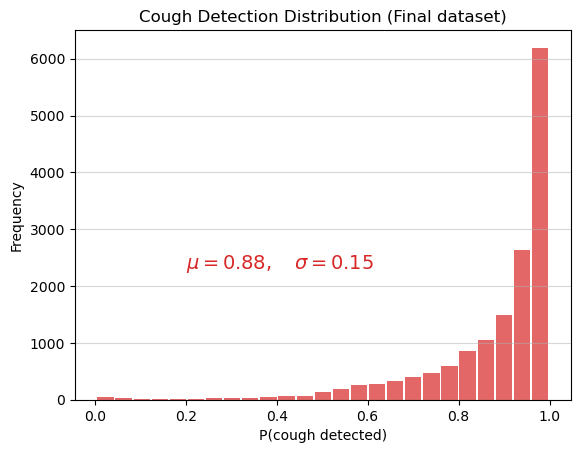

In [307]:
dataset['cough_detected'].plot.hist(color='#d82727', bins=25, rwidth=0.9, alpha=0.7)
plt.title('Cough Detection Distribution (Final dataset)')
plt.xlabel('P(cough detected)')
plt.ylabel('Frequency')
plt.text(0.2, 2300, rf'$\mu={dataset["cough_detected"].mean():.2f}, \quad \sigma={dataset["cough_detected"].std():.2f}$',
        fontsize=14, color='#d82727')
plt.grid(axis='y', alpha=0.5)
plt.show()

In [305]:
dataset.to_csv("dataset.csv", index=False)